# Model wildfire burn-severity (dNBR) across the 2025 Los Angeles wildfires using EMIT, ECOSTRESS, and topographic variables

**Workflow for Random Forest Regression burn severity modeling**
1. Kitchen Sink model
    - All variables
        - Trim 100 m from burn perimeter 
        - ~300 m subsampling (block-wise random) to mitigate spatial autocorrelation
        - Fit 1 scaler to all fires
        - Omit urban and water land cover classes
    - Hyperparameter tuning with RandomizedSearchCV
    - Reduce overfitting on Kitchen Sink model by further tuning hyperparameters
        - Find balance between train and test R² 
        - Retrain Kitchen Sink model with updated hyperparameters
2. Feature Reduction Analysis
    - RFECV to begin pruning features
    - Importance and Correlation evaluation
        - Eliminate low-importance and highly correlated features (>0.75)
3. Retrain the RF on the refined set of predictors
    - Hyperparameter tuning with RandomizedSearchCV
    - Reduce overfitting on reduced model by further tuning hyperparameters
        - Find balance between train and test R² 
        - Retrain reduced model with updated hyperparameters

# Imports

In [1]:
import numpy as np
import pandas as pd
import rasterio
from rasterio.mask import mask
from rasterio.warp import reproject, Resampling
from rasterio.transform import array_bounds
from rasterio.windows import from_bounds
import geopandas as gpd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.ticker as mtick
import matplotlib.colors as mcolors
import seaborn as sns
from rasterio.warp import calculate_default_transform
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, RandomizedSearchCV, StratifiedKFold
from sklearn.model_selection import GroupKFold, validation_curve, KFold
from sklearn.feature_selection import RFECV, RFE
from sklearn.preprocessing import StandardScaler
from sklearn.inspection import permutation_importance
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from sklearn.inspection import partial_dependence
import joblib
from pathlib import Path
import warnings, random
warnings.filterwarnings("ignore", category=FutureWarning)

# Full kitchen sink model 

In [2]:
# Full Kitchen Sink Model for Wildfire Burn Severity (dNBR)
# Wildfire RF pipeline

# -----------------------------
# Inputs
# -----------------------------
"""
For each fire, we have:
- a burn perimeter clipped inward by 100m (to remove edge effects from firefighting) 
- an ENVI-formatted file with all data layers stacked and resampled (bilinear) to EMIT spatial resolution
- a mask omitting water and urban classes (from NLCD)
- a raster with NLCD classes nearest-neighbor resampled to EMIT resolution
"""

wildfire_rasters = {
    "Eaton": {
        "burn_perimeter": "/Volumes/GEOG/EMIT_ECOSTRESS_wildfires/data/allfires_model/burnperimeters/Eaton_WFIGS_Interagency_Perimeters_YearToDate_-8396875942426194654/Perimeters_inward100m.shp",
        "stacked": "/Volumes/GEOG/EMIT_ECOSTRESS_wildfires/updated_allfiresmodel/Eaton/Eaton_LayerStack_updated20250902",
        "mask": "/Volumes/GEOG/EMIT_ECOSTRESS_wildfires/updated_allfiresmodel/Eaton/NLCD_Eaton_mask_resampled.tif",
        "nlcd_raster": "/Volumes/GEOG/EMIT_ECOSTRESS_wildfires/updated_allfiresmodel/Eaton/NLCD_Eaton_resampled.tif"
    },
    "Hughes": {
        "burn_perimeter": "/Volumes/GEOG/EMIT_ECOSTRESS_wildfires/data/allfires_model/burnperimeters/Hughes_WFIGS_Interagency_Perimeters_YearToDate_7148479240675437113/Perimeters_inward100m.shp",
        "stacked": "/Volumes/GEOG/EMIT_ECOSTRESS_wildfires/updated_allfiresmodel/Hughes/Hughes_layerstack_updated_20250902",
        "mask": "/Volumes/GEOG/EMIT_ECOSTRESS_wildfires/updated_allfiresmodel/Hughes/NLCD_Hughes_mask_resampled.tif",
        "nlcd_raster": "/Volumes/GEOG/EMIT_ECOSTRESS_wildfires/updated_allfiresmodel/Hughes/NLCD_Hughes_resampled.tif"
    },
    "Palisades": {
        "burn_perimeter": "/Volumes/GEOG/EMIT_ECOSTRESS_wildfires/data/allfires_model/burnperimeters/Palisades_WFIGS_Interagency_Perimeters_YearToDate_2024716492027912883/Perimeters_inward100m.shp",
        "stacked": "/Volumes/GEOG/EMIT_ECOSTRESS_wildfires/updated_allfiresmodel/Palisades/Palisades_LayerStack_updated20250902",
        "mask": "/Volumes/GEOG/EMIT_ECOSTRESS_wildfires/updated_allfiresmodel/Palisades/NLCD_Palisades_mask_resampled.tif",
        "nlcd_raster": "/Volumes/GEOG/EMIT_ECOSTRESS_wildfires/updated_allfiresmodel/Palisades/NLCD_Palisades_resampled.tif"
    }
}

# -------------------------------------------
# Define per-fire band mappings
# -------------------------------------------
"""
We include only predictors shared across fires.
"""

base_band_mapping = {
        1: "CWC_20240625",
        #2: "Normalized_CWC_NDVI_20240625",
        #3: "Normalized_CWC_Vfrac_20240625",
        4: "Vfrac_20240625",
        #5: "NDVI_20240625",
        6: "ET_20240625_1038am",
        7: "ESI_20240625_1038am",
        8: "WUE_20240625_1038am",
        9: "ET_20241201_1049am",
        10: "ESI_20241201_1049am",
        11: "WUE_20241201_1049am",
        12: "ET_20231202_1121am",
        13: "ESI_20231202_1121am",
        14: "WUE_20231202_1121am",
        15: "ET_20230409_1028am",
        16: "ESI_20230409_1028am",
        17: "WUE_20230409_1028am",
        18: "ETdiff_Dec24-June24",
        #19: "ETpctchangeJunDec",
        20: "ETdiffDec24-Dec23",
        #21: "ETpctchngDecDec",
        #22: "ETdiffAprDec",
        #23: "ETpctchgAprDec",
        24: "ESIdiff_Dec24-June24",
        #25: "ESIpctchangeJunDec",
        26: "ESIdiffDec24-Dec23",
        #27: "ESIpctchngDecDec",
        #28: "ESIdiffAprDec",
        #29: "ESIpctchgAprDec",
        30: "WUEdiff_Dec24-June24",
        #31: "WUEpctchangeJunDec",
        32: "WUEdiffDec24-Dec23",
        #33: "WUEpctchngDecDec",
        #34: "WUEdiffAprDec",
        #35: "WUEpctchgAprDec",
        36: "AreaSolarRadiation_all",
        37: "AreaSolarRadiation_directonly",
        38: "Elevation",
        39: "Slope",
        #40: "Aspect",
        41: "cosAspect",
        42: "WindSpeed_avg_20250108",
        43: "UGRD_avg_20250108",
        44: "VGRD_avg_20250108",
        45: "WindGust_max_20250108",
        46: "VPD_max_20250107",
        #47: "NLCD", #biinlinear resampling makes this layer incorrect
        #48: "Landfire_LC23_F13_240", #biinlinear resampling makes this layer incorrect
        #49: "preNBR_L8_20250106",
        #50: "postNBR_L8_20250223",
        51: "dNBR",
        52: "ESIdiff_Dec24-Apr23",
        53: "WUEdiff_Dec24-Apr23"
}

band_mappings = {
    "Eaton": base_band_mapping,
    "Hughes": base_band_mapping,
    "Palisades": base_band_mapping,
}

# Get predictor names 
# All fires share the same band mapping, so we can safely use Eaton
predictor_names = sorted([
    name for name in band_mappings["Eaton"].values()
    if name != "dNBR"
])

continuous_vars = predictor_names[:]

# -----------------------------
# NLCD
# -----------------------------
# NLCD code-to-class lookup
nlcd_classes = {
    11: 'Open Water', 12: 'Perennial Ice/Snow', 21: 'Developed, Open Space',
    22: 'Developed, Low Intensity', 23: 'Developed, Medium Intensity',
    24: 'Developed, High Intensity', 31: 'Barren Land',
    41: 'Deciduous Forest', 42: 'Evergreen Forest', 43: 'Mixed Forest',
    52: 'Shrub/Scrub', 71: 'Grassland/Herbaceous', 81: 'Pasture/Hay',
    82: 'Cultivated Crops', 90: 'Woody Wetlands', 95: 'Emergent Herbaceous Wetlands'
}

# -----------------------------
# Load raster and extract valid pixels
# -----------------------------
"""
Load predictor and target bands from a stacked raster.

Returns
-------
predictors : np.ndarray
    3D array (bands, rows, cols) of predictors.
target : np.ndarray
    2D array (rows, cols) of dNBR values.
predictor_names_out : list
    Names of predictors extracted.
profile : dict
    Raster profile metadata.
mask_data : np.ndarray
    Binary mask of valid pixels.
"""
def load_predictor_and_target_bands(raster_path, burn_perimeter, band_map, mask_path, nlcd_path):
    with rasterio.open(raster_path) as src:
        geom = [burn_perimeter.geometry.union_all().__geo_interface__]
        all_bands_data, transform = mask(src, geom, crop=True, nodata=-9999)
        all_bands_data = all_bands_data.astype(float)
        all_bands_data[all_bands_data == -9999] = np.nan
        profile = src.profile
        profile.update({
            "height": all_bands_data.shape[1],
            "width": all_bands_data.shape[2],
            "transform": transform
        })

    with rasterio.open(mask_path) as mask_src:
        mask_clipped, _ = mask(mask_src, geom, crop=True, nodata=0)
        mask_data = mask_clipped[0, :, :]

    with rasterio.open(nlcd_path) as nlcd_src:
        nlcd_clipped, _ = mask(nlcd_src, geom, crop=True, nodata=0)
        nlcd_data = nlcd_clipped[0, :, :]

    predictors, predictor_names_out = [], []
    for band_num, name in band_map.items():
        band_data = all_bands_data[band_num - 1, :, :]
        if name == "dNBR":
            target = band_data
        else:
            predictors.append(band_data)
            predictor_names_out.append(name)

    predictors = np.array(predictors)
    return predictors, target, predictor_names_out, profile, mask_data, nlcd_data

# -----------------------------
# Subsampling mask (~300 m)
# -----------------------------
"""
Generate a boolean mask that selects one random valid pixel per block_size x block_size area.
Helps reduce spatial autocorrelation (≈300 m subsampling).
"""
def random_subsample_mask(mask_data, block_size=5, seed=42):
    rng = np.random.default_rng(seed)  # create seeded RNG
    rows, cols = mask_data.shape
    subsample_mask = np.zeros_like(mask_data, dtype=bool)

    for i in range(0, rows, block_size):
        for j in range(0, cols, block_size):
            block = mask_data[i:i+block_size, j:j+block_size]
            valid_indices = np.argwhere(block == 1)
            if valid_indices.size > 0:
                idx = rng.choice(valid_indices)
                subsample_mask[i + idx[0], j + idx[1]] = True

    return subsample_mask


# -----------------------------
# Loop over fires and extract data
# -----------------------------
"""
For each fire:
1. Read the burn perimeter and stacked raster bands.
2. Extract predictors (all continuous variables) and the target (dNBR) within the burn perimeter.
3. Apply a ~300 m block subsampling mask to reduce spatial autocorrelation,
   keeping one random valid pixel per block -> stored in df_all_unscaled.
4. Also extract all valid pixels (full-scene, no subsampling) -> stored in df_all_full.
5. Record raster metadata (target + profile) in profiles for later georeferencing.
"""

df_all_unscaled, df_all_full, profiles = [], [], {}

for fire, paths in wildfire_rasters.items():
    print(f"Processing {fire}")
    burn_perimeter = gpd.read_file(paths["burn_perimeter"])
    band_map = band_mappings[fire]

    predictors, target, pred_names_fire, profile, mask_data, nlcd_data = load_predictor_and_target_bands(
        paths["stacked"], burn_perimeter, band_map, paths["mask"], paths["nlcd_raster"]
    )

    rows, cols = target.shape
    row_indices, col_indices = np.indices((rows, cols))
    transform = profile["transform"]

    # --- Subsample (~300 m) ---
    subsample_mask = random_subsample_mask((~np.isnan(target)) & (mask_data == 1), block_size=5, seed=42)
    valid_mask = subsample_mask
    flat_predictors = predictors[:, valid_mask].T

    data = {
        "dNBR": target[valid_mask].flatten(),
        "NLCD": nlcd_data[valid_mask].flatten(),
        "NLCD_Class": [nlcd_classes.get(code, "Unknown") for code in nlcd_data[valid_mask].flatten()],
        "Row": row_indices[valid_mask].flatten(),
        "Col": col_indices[valid_mask].flatten(),
        "X": np.array(rasterio.transform.xy(transform, row_indices[valid_mask], col_indices[valid_mask])[0]),
        "Y": np.array(rasterio.transform.xy(transform, row_indices[valid_mask], col_indices[valid_mask])[1]),
        "Fire": [fire] * flat_predictors.shape[0]
    }
    for i, name in enumerate(pred_names_fire):
        data[name] = flat_predictors[:, i]

    df_fire = pd.DataFrame(data).dropna().reset_index(drop=True)
    df_all_unscaled.append(df_fire)

    # --- Full-scene (no subsampling) ---
    full_valid_mask = (~np.isnan(target)) & (mask_data == 1)
    flat_predictors_full = predictors[:, full_valid_mask].T

    data_full = {
        "dNBR": target[full_valid_mask].flatten(),
        "NLCD": nlcd_data[full_valid_mask].flatten(),
        "NLCD_Class": [nlcd_classes.get(code, "Unknown") for code in nlcd_data[full_valid_mask].flatten()],
        "Row": row_indices[full_valid_mask].flatten(),
        "Col": col_indices[full_valid_mask].flatten(),
        "X": np.array(rasterio.transform.xy(transform, row_indices[full_valid_mask], col_indices[full_valid_mask])[0]),
        "Y": np.array(rasterio.transform.xy(transform, row_indices[full_valid_mask], col_indices[full_valid_mask])[1]),
        "Fire": [fire] * flat_predictors_full.shape[0]
    }
    for i, name in enumerate(pred_names_fire):
        data_full[name] = flat_predictors_full[:, i]

    df_all_full.append(pd.DataFrame(data_full).dropna().reset_index(drop=True))
    profiles[fire] = (target, profile)

# -----------------------------
# Scaling
# -----------------------------
"""
We fit the StandardScaler on all fires combined to ensure variables are standardized consistently across fires.
"""
scaler = StandardScaler()
df_unscaled = pd.concat(df_all_unscaled, ignore_index=True)
scaler.fit(df_unscaled[continuous_vars])

df_all_scaled = []
for df_fire in df_all_unscaled:
    df_scaled = df_fire.copy()
    df_scaled[continuous_vars] = scaler.transform(df_scaled[continuous_vars])
    df_all_scaled.append(df_scaled)

df = pd.concat(df_all_scaled, ignore_index=True)
df_full = pd.concat(df_all_full, ignore_index=True)
df_full_scaled = df_full.copy()
df_full_scaled[continuous_vars] = scaler.transform(df_full[continuous_vars])

# -----------------------------
# Modeling
# -----------------------------
"""
Prepare predictors (X) and target (y), then split into training/testing sets.
- Stratify by "Fire" to keep a balanced representation of each fire in train/test.
- Use RandomizedSearchCV to tune Random Forest hyperparameters at first:
    * n_estimators: number of trees
    * max_depth: tree depth
    * min_samples_split / min_samples_leaf: control tree complexity
    * max_features: number of features to consider at each split
- Search over 25 random parameter combinations with 5-fold CV.
- Optimize for R² score and select the best-performing model.
"""
X = df[continuous_vars]
y = df["dNBR"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=df["Fire"]
)

param_dist = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [10, 20, 30],
    'min_samples_split': [5, 10, 20],
    'min_samples_leaf': [5, 10, 20],
    'max_features': ['sqrt', 'log2']
}

rf = RandomizedSearchCV(
    RandomForestRegressor(random_state=42),
    param_distributions=param_dist,
    n_iter=25,
    cv=5,
    n_jobs=-1,
    verbose=0,
    random_state=42,
    scoring='r2'
)
rf.fit(X_train, y_train)
model = rf.best_estimator_

# -----------------------------
# Apply the trained model to the full dataset (all valid pixels)
# -----------------------------
"""
- X_full: all continuous predictors, scaled consistently across fires
- Predicted_dNBR: model output for each pixel
- Residual: difference between prediction and observed dNBR
This gives wall-to-wall predictions (not just test points) so results can be mapped
and residuals analyzed spatially.
"""
X_full = df_full_scaled[continuous_vars]
df_full_scaled["Predicted_dNBR"] = model.predict(X_full)
df_full_scaled["Residual"] = df_full_scaled["Predicted_dNBR"] - df_full_scaled["dNBR"]

print(df_full_scaled[["Fire", "Row", "Col", "X", "Y", "Predicted_dNBR", "dNBR", "Residual"]].sample(5))

Processing Eaton
Processing Hughes
Processing Palisades
            Fire  Row  Col           X          Y  Predicted_dNBR      dNBR  \
30008  Palisades   64  303 -118.519564  34.093792        0.610328  0.491739   
31767  Palisades   80  217 -118.566195  34.085116        0.624009  0.453939   
45105  Palisades  140  178 -118.587342  34.052582        0.508968  0.385153   
15422     Hughes   25   80 -118.582462  34.566569        0.531478  0.548618   
41817  Palisades  126  179 -118.586800  34.060173        0.721914  0.753148   

       Residual  
30008  0.118589  
31767  0.170070  
45105  0.123815  
15422 -0.017140  
41817 -0.031233  


In [3]:
# ----------------------------
# Kitchen Sink Model Performance Metrics
# ----------------------------
"""
Evaluate how well the tuned Random Forest performs:
- Compare training vs. testing R² to check for overfitting
- Report standard error metrics (RMSE, MAE) on the test set
- Show the difference between Train and Test R² as an overfit indicator
- Print the best hyperparameters found via RandomizedSearchCV
- Display the mean CV R² score from the search
"""

# Predict on training and testing data using the best model
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Compute metrics
r2_train = r2_score(y_train, y_pred_train)
r2_test = r2_score(y_test, y_pred_test)
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred_test))
mae_test = mean_absolute_error(y_test, y_pred_test)

# Print metrics
print("\nKitchen Sink Model (Train vs Test):")
print(f"Train R²:       {r2_train:.3f}")
print(f"Test R²:        {r2_test:.3f}")
print(f"Test RMSE:      {rmse_test:.3f}")
print(f"Test MAE:       {mae_test:.3f}")
print(f"Test - Train R²:{r2_test - r2_train:.3f}")

# Print best parameters and score from RandomizedSearchCV
print("Best RandomizedSearchCV Parameters:")
print(rf.best_params_)

print(f"\nBest R² Score from CV: {rf.best_score_:.3f}")


Kitchen Sink Model (Train vs Test):
Train R²:       0.819
Test R²:        0.618
Test RMSE:      0.117
Test MAE:       0.086
Test - Train R²:-0.201
Best RandomizedSearchCV Parameters:
{'n_estimators': 300, 'min_samples_split': 5, 'min_samples_leaf': 5, 'max_features': 'log2', 'max_depth': 30}

Best R² Score from CV: 0.587


In [4]:
# ----------------------------
# Track Fire Source in Metrics
# ----------------------------

# To better interpret generalization across fires, evaluate R² per fire in the test set
df_test = df.iloc[X_test.index].copy()
df_test["y_true"] = y_test
df_test["y_pred"] = y_pred_test
per_fire_r2 = df_test.groupby("Fire").apply(lambda g: r2_score(g["y_true"], g["y_pred"]))
print("\nTest R² per fire:\n", per_fire_r2)


Test R² per fire:
 Fire
Eaton        0.316324
Hughes       0.696957
Palisades    0.637678
dtype: float64


/var/folders/br/pyt6szbd2wb4q6n5wqkffrbc0000gn/T/ipykernel_22412/545674150.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  per_fire_r2 = df_test.groupby("Fire").apply(lambda g: r2_score(g["y_true"], g["y_pred"]))


In [5]:
# ----------------------------
# Save the Trained Model 
# ----------------------------
"""
- Save the trained Random Forest model (pkl via joblib) so it can be reloaded later
- Export the full prediction DataFrame (with predictors, observed dNBR, predictions, residuals)
  as a Parquet file for efficient storage and downstream analysis/visualization
"""
joblib.dump(model, "/Volumes/GEOG/EMIT_ECOSTRESS_wildfires/updated_allfiresmodel/manuscript_ready/kitchen_sink_model_2025103.pkl")

# Export
df_full_scaled.to_parquet("/Volumes/GEOG/EMIT_ECOSTRESS_wildfires/updated_allfiresmodel/manuscript_ready/kitchen_sink_model_20251023.parquet")

In [6]:
# -------------------------------------------
# Print training and testing sample counts
# -------------------------------------------

# Add back fire labels to splits for per-fire counts
train_idx = X_train.index
test_idx = X_test.index

df["Set"] = "Unused"
df.loc[train_idx, "Set"] = "Train"
df.loc[test_idx, "Set"] = "Test"

# Count per fire and set
fire_counts = df.groupby(["Fire", "Set"]).size().unstack(fill_value=0)
print("\nPixel counts per fire and split:")
print(fire_counts)

# Overall count
total_train = len(X_train)
total_test = len(X_test)
print(f"\nTotal training pixels: {total_train}")
print(f"Total testing pixels: {total_test}")
print(f"Total pixels: {total_train + total_test}")


Pixel counts per fire and split:
Set        Test  Train
Fire                  
Eaton       184    429
Hughes      166    387
Palisades   337    787

Total training pixels: 1603
Total testing pixels: 687
Total pixels: 2290


## Update Kitchen Sink model with further hyperparameter tuning to reduce overfitting risk

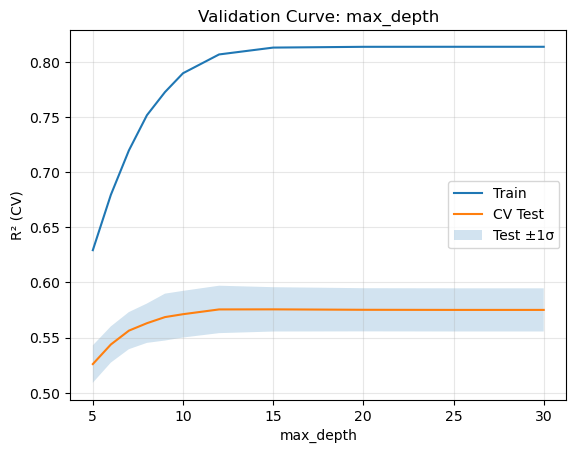

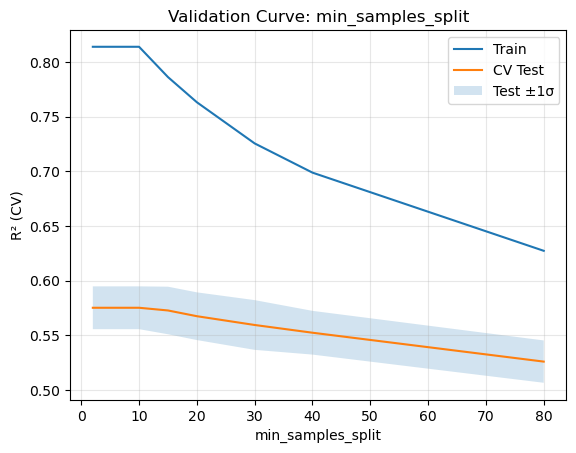

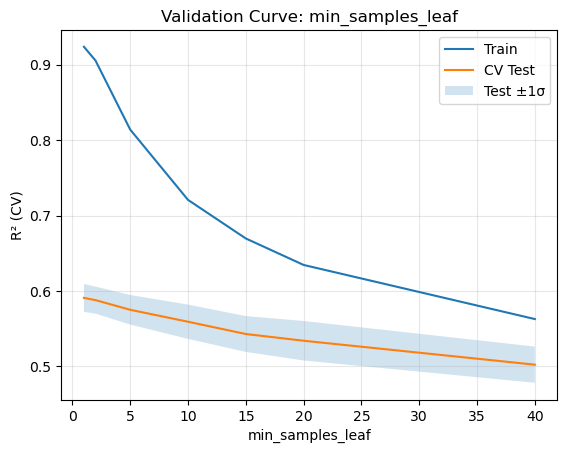

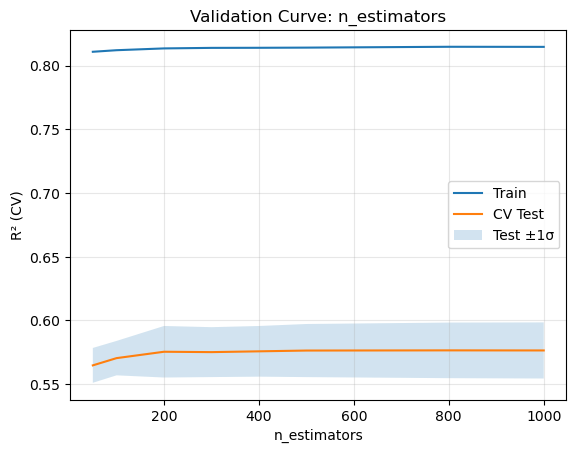

In [7]:
# ----------------------------
# Hyperparameter Diagnostics: Validation Curves
# ----------------------------
"""
Purpose:
- Systematically test how individual RF hyperparameters affect model performance
- Uses cross-validation (CV) scores to compare training vs. validation R²
- A large gap between Train and Test curves indicates overfitting

What we evaluate:
  * max_depth          → controls maximum depth of each tree
  * min_samples_split  → minimum samples needed to split an internal node
  * min_samples_leaf   → minimum samples at a leaf node
  * n_estimators       → number of trees in the forest

Output:
- Validation curves (plots of Train vs. Test R²)
- Tabular results including Train R², Test R², Gap, and Test StdDev
- Updated RF model retrained with selected parameters based on these curves
"""

# Base: use tuned params to vary one thing at a time
base_params = {**rf.best_params_, "random_state": 42}
base_est = RandomForestRegressor(**base_params)

# 5-fold CV across all fires (mixed, no grouping by fire)
kf = KFold(n_splits=5, shuffle=True, random_state=42)

def run_val_curve(estimator, X, y, param_name, param_range, xlabel=None, title=None):
    train_scores, test_scores = validation_curve(
        estimator, X, y,
        param_name=param_name, param_range=param_range,
        cv=kf,  #not grouping by Fire
        scoring="r2", n_jobs=-1
    )
    tr_m, te_m = train_scores.mean(axis=1), test_scores.mean(axis=1)
    tr_s, te_s = train_scores.std(axis=1),  test_scores.std(axis=1)

    # Plot
    plt.plot(param_range, tr_m, label="Train")
    plt.plot(param_range, te_m, label="CV Test")
    plt.fill_between(param_range, te_m - te_s, te_m + te_s, alpha=0.2, label="Test ±1σ")
    if xlabel: plt.xlabel(xlabel)
    plt.ylabel("R² (CV)"); plt.title(title or f"Validation Curve: {param_name}")
    plt.legend(); plt.grid(True, alpha=0.3); plt.show()

    # Tabular summary 
    return pd.DataFrame({
        param_name: param_range,
        "train_r2": tr_m, "test_r2": te_m,
        "gap": tr_m - te_m, "test_std": te_s
    }).round(3)

# max_depth
depths = [5, 6, 7, 8, 9, 10, 12, 15, 20, 25, 30]
vc_depth = run_val_curve(base_est, X_train, y_train, "max_depth", depths, xlabel="max_depth")

# min_samples_split
split_range = [2, 5, 10, 15, 20, 30, 40, 80]
vc_split = run_val_curve(base_est, X_train, y_train, "min_samples_split", split_range, xlabel="min_samples_split")

# min_samples_leaf
leaf_range = [1, 2, 5, 10, 15, 20, 40]
vc_leaf = run_val_curve(base_est, X_train, y_train, "min_samples_leaf", leaf_range, xlabel="min_samples_leaf")

# n_estimators
estimator_range = [50, 100, 200, 300, 400, 500, 800, 1000]
vc_trees = run_val_curve(base_est, X_train, y_train, "n_estimators", estimator_range, xlabel="n_estimators")

## Retrain kitchen sink model on updated model hyperparameters

In [8]:
# ----------------------------
# Update RF model hyperparameters
# ----------------------------
# Retrain the RF with selected hyperparameters (based on curves + CV)
custom_params = rf.best_params_.copy()
custom_params.update({
    "n_estimators": 400,
    "max_depth": 10,        
    "min_samples_split": 20,
    "min_samples_leaf": 10,
    "max_features": "sqrt",
})
rf_kitchen_tuned = RandomForestRegressor(**custom_params, oob_score=True, random_state=42)
rf_kitchen_tuned.fit(X_train, y_train)

# Evaluate
ytr = rf_kitchen_tuned.predict(X_train)
yte = rf_kitchen_tuned.predict(X_test)
print("\nModel Performance with updated hyperparameters:")
print(f"OOB R²:         {rf_kitchen_tuned.oob_score_:.3f}")
print(f"Train R²:       {r2_score(y_train, ytr):.3f}")
print(f"Test R²:        {r2_score(y_test, yte):.3f}")
print(f"Test RMSE:      {np.sqrt(mean_squared_error(y_test, yte)):.3f}")
print(f"Test MAE:       {mean_absolute_error(y_test, yte):.3f}")
print(f"Test - Train R²:{r2_score(y_test, yte) - r2_score(y_train, ytr):.3f}")


Model Performance with updated hyperparameters:
OOB R²:         0.570
Train R²:       0.718
Test R²:        0.587
Test RMSE:      0.122
Test MAE:       0.089
Test - Train R²:-0.131



Kitchen Sink Model Metrics (All Predictors):
R²:            0.587
Adjusted R²:   0.567
RMSE:          0.122
MAE:           0.089


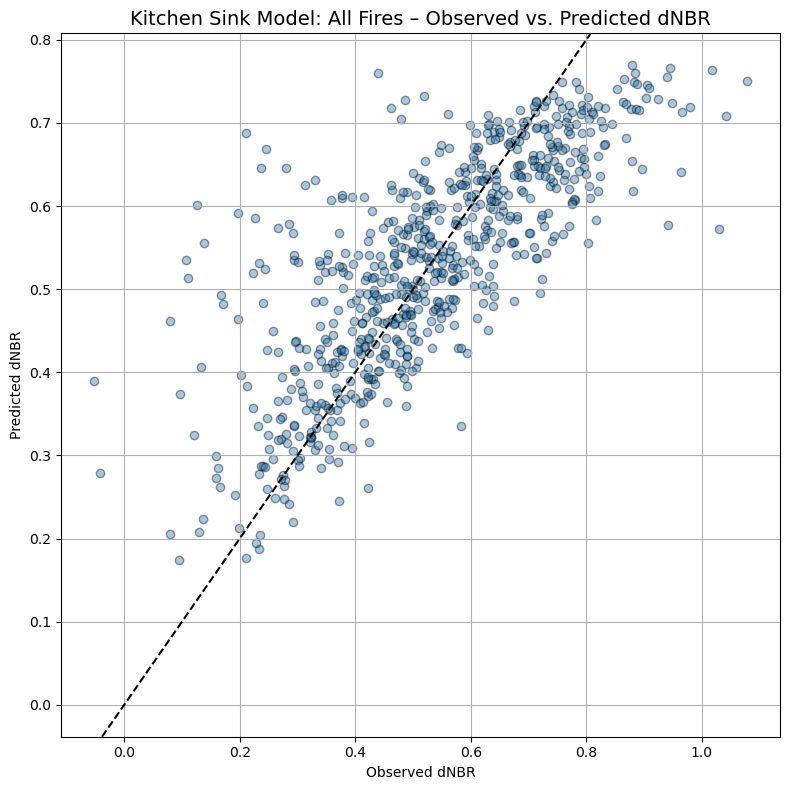

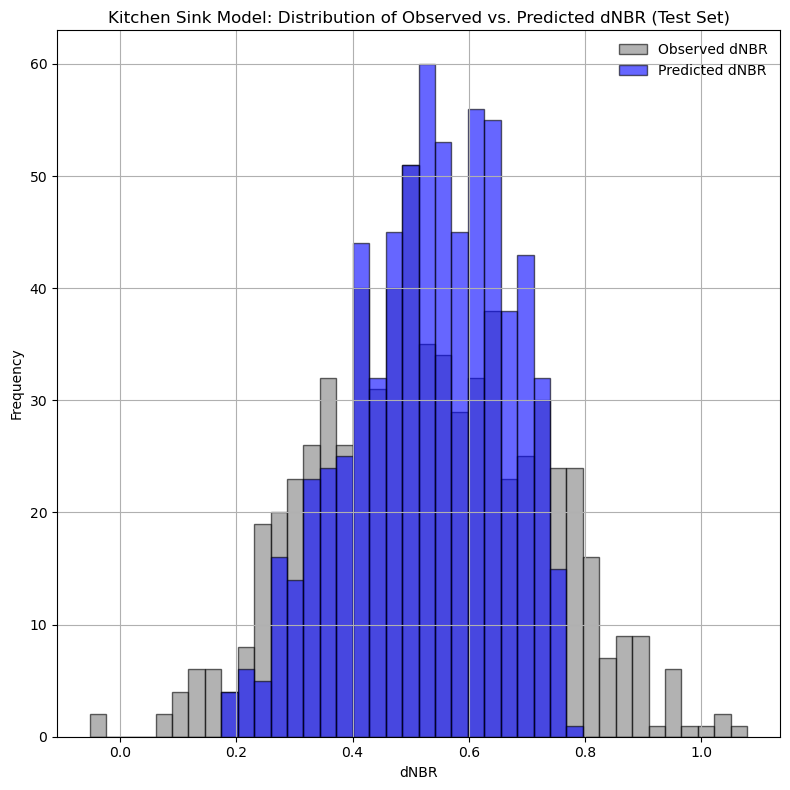

             All Predictors
R²                 0.587099
Adjusted R²        0.566896
RMSE               0.121853
MAE                0.089182


In [9]:
# ----------------------------
# Evaluate Predictions on updated model
# ----------------------------
"""
Purpose:
- Quantify model performance on the held-out test set
- Metrics: R², Adjusted R², RMSE, MAE
  * Adjusted R² corrects for number of predictors (k) relative to sample size (n)
- Visualize performance:
  * Scatter plot of Observed vs. Predicted dNBR (with 1:1 line)
  * Histograms comparing observed vs. predicted distributions
- Save metrics into a tidy DataFrame for easy reporting/export
"""


# Predict on test set only
y_pred_test = rf_kitchen_tuned.predict(X_test)

# Metrics for full model
r2 = r2_score(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred_test)
n = len(y_test)
k = X_test.shape[1]
r2_adj = 1 - ((1 - r2) * (n - 1)) / (n - k - 1)

print("\nKitchen Sink Model Metrics (All Predictors):")
print(f"R²:            {r2:.3f}")
print(f"Adjusted R²:   {r2_adj:.3f}")
print(f"RMSE:          {rmse:.3f}")
print(f"MAE:           {mae:.3f}")

# Observed vs. Predicted scatter plot (all fires)
plt.figure(figsize=(8, 8))
plt.scatter(y_test, y_pred_test, alpha=0.4, edgecolor='k')
plt.axline((0, 0), slope=1, color='black', linestyle='--')
plt.xlabel("Observed dNBR")
plt.ylabel("Predicted dNBR")
plt.title("Kitchen Sink Model: All Fires – Observed vs. Predicted dNBR", fontsize=14)
plt.grid(True)
plt.tight_layout()
plt.show()

# Histogram of predicted vs observed
plt.figure(figsize=(8, 8))
bins = np.histogram_bin_edges(np.concatenate([y_test, y_pred_test]), bins=40)
plt.hist(y_test, bins=bins, alpha=0.6, label="Observed dNBR", color="gray", edgecolor='black')
plt.hist(y_pred_test, bins=bins, alpha=0.6, label="Predicted dNBR", color="blue", edgecolor='black')
plt.xlabel("dNBR")
plt.ylabel("Frequency")
plt.title("Kitchen Sink Model: Distribution of Observed vs. Predicted dNBR (Test Set)")
plt.legend(frameon=False)
plt.grid(True)
plt.tight_layout()
plt.show()

# Save to DataFrame
metrics_all = {
    "R²": r2,
    "Adjusted R²": r2_adj,
    "RMSE": rmse,
    "MAE": mae
}
metrics_df = pd.DataFrame(metrics_all, index=["All Predictors"])
print(metrics_df.T)

## Feature Reduction Analysis on Kitchen Sink Model
Further refine feature set by identifying collinearity, redundant predictors, and assessing feature importance.

/var/folders/br/pyt6szbd2wb4q6n5wqkffrbc0000gn/T/ipykernel_22412/3532565353.py:45: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


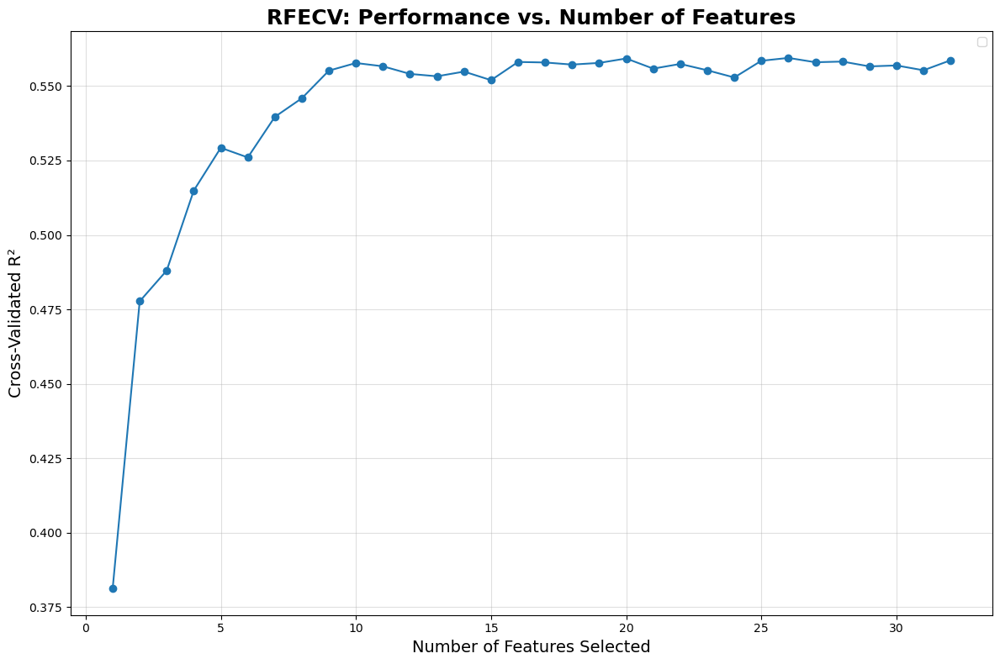

Optimal number of features: 26

Selected features from RFECV:
 - AreaSolarRadiation_directonly
 - CWC_20240625
 - ESI_20230409_1028am
 - ESI_20231202_1121am
 - ESI_20240625_1038am
 - ESI_20241201_1049am
 - ESIdiffDec24-Dec23
 - ESIdiff_Dec24-Apr23
 - ESIdiff_Dec24-June24
 - ET_20231202_1121am
 - ET_20240625_1038am
 - ET_20241201_1049am
 - ETdiffDec24-Dec23
 - Elevation
 - UGRD_avg_20250108
 - VGRD_avg_20250108
 - VPD_max_20250107
 - Vfrac_20240625
 - WUE_20231202_1121am
 - WUE_20240625_1038am
 - WUE_20241201_1049am
 - WUEdiff_Dec24-Apr23
 - WUEdiff_Dec24-June24
 - WindGust_max_20250108
 - WindSpeed_avg_20250108
 - cosAspect


In [10]:
# ----------------------------
# RFECV (Recursive Feature Elimination with Cross-Validation)
# ----------------------------
"""
Purpose:
- Iteratively remove the least important features (one at a time)
- Refit the model at each step and track cross-validated performance (R²)
- Identify the smallest subset of predictors that achieves the best CV performance

Notes:
- Uses the tuned Random Forest model (rf_kitchen_tuned) as the estimator
- 5-fold CV with shuffling ensures robust feature ranking
- Output includes:
    * A plot of R² vs. number of features
    * The optimal number of features (n_features_)
    * A ranked list of the selected features
"""


# RFECV setup
rfecv_kitchen = RFECV(
    estimator=rf_kitchen_tuned,
    step=1,
    cv=KFold(n_splits=5, shuffle=True, random_state=42),
    scoring='r2',
    n_jobs=-1,
    verbose=0
)

# Fit RFECV on training data
rfecv_kitchen.fit(X_train, y_train)

# ----------------------------
# Plot: CV performance vs. number of features
# ----------------------------
plt.figure(figsize=(12, 8))
plt.plot(
    range(1, len(rfecv_kitchen.cv_results_['mean_test_score']) + 1),
    rfecv_kitchen.cv_results_['mean_test_score'],
    marker='o'
)
plt.xlabel("Number of Features Selected", fontsize=14)
plt.ylabel("Cross-Validated R²", fontsize=14)
plt.title("RFECV: Performance vs. Number of Features", fontsize=18, fontweight="bold")
plt.legend()
plt.grid(True, alpha=0.4)
plt.tight_layout()
plt.show()

# ----------------------------
# Results: Selected features
# ----------------------------
selected_rfecv_features = X_train.columns[rfecv_kitchen.support_].tolist()
print(f"Optimal number of features: {rfecv_kitchen.n_features_}\n")
print("Selected features from RFECV:")
for feat in selected_rfecv_features:
    print(f" - {feat}")


VIF Scores:
                          Variable           VIF
0          AreaSolarRadiation_all  2.643039e+02
1   AreaSolarRadiation_directonly  2.768598e+02
2                    CWC_20240625  7.329124e+00
3             ESI_20230409_1028am  5.206474e+13
4             ESI_20231202_1121am  5.303648e+02
5             ESI_20240625_1038am  7.007265e+02
6             ESI_20241201_1049am  2.508969e+13
7              ESIdiffDec24-Dec23  3.756796e+02
8             ESIdiff_Dec24-Apr23  9.481262e+13
9            ESIdiff_Dec24-June24  6.128958e+02
10             ET_20230409_1028am  2.346858e+00
11             ET_20231202_1121am  4.195204e+02
12             ET_20240625_1038am  6.423220e+02
13             ET_20241201_1049am  4.174435e+02
14              ETdiffDec24-Dec23  2.334628e+02
15            ETdiff_Dec24-June24  4.743125e+02
16                      Elevation  7.751581e+00
17                          Slope  2.991040e+00
18              UGRD_avg_20250108  2.989137e+01
19              VGRD_avg_2

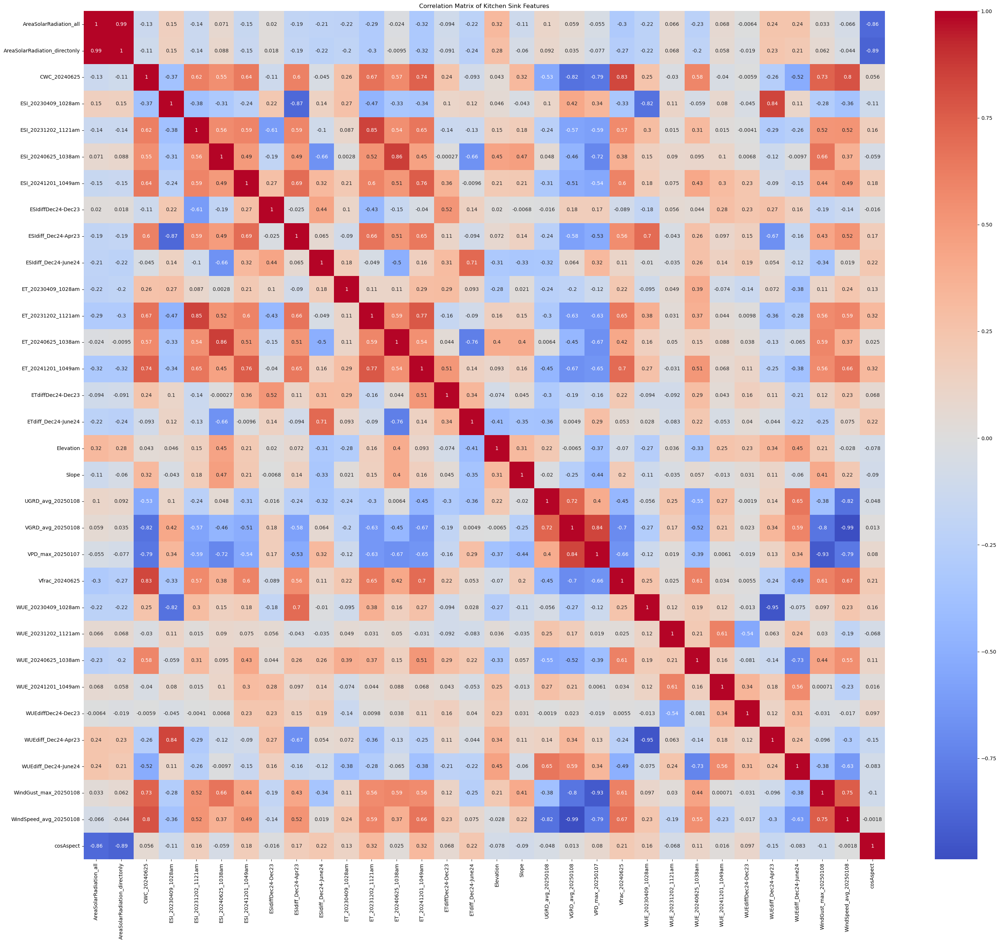


Permutation Importances:
                           Feature  Importance Mean  Importance Std
2                    CWC_20240625         0.080824        0.008036
6             ESI_20241201_1049am         0.072658        0.005991
13             ET_20241201_1049am         0.033264        0.003952
5             ESI_20240625_1038am         0.025020        0.003467
29          WindGust_max_20250108         0.022299        0.003445
4             ESI_20231202_1121am         0.017477        0.004325
11             ET_20231202_1121am         0.013946        0.002774
18              UGRD_avg_20250108         0.012176        0.001656
30         WindSpeed_avg_20250108         0.011626        0.001685
21                 Vfrac_20240625         0.010824        0.002078
19              VGRD_avg_20250108         0.010000        0.001619
12             ET_20240625_1038am         0.008467        0.001293
8             ESIdiff_Dec24-Apr23         0.008441        0.001687
20               VPD_max_20250107  

In [11]:
# ----------------------------
# Variance Inflation Factor (VIF)
# ----------------------------
# Detects multicollinearity among predictors (VIF > ~5–10 is concerning)

X_kitchen = X_train[continuous_vars]
vif_df = pd.DataFrame({
    "Variable": X_kitchen.columns,
    "VIF": [variance_inflation_factor(add_constant(X_kitchen).values, i + 1) for i in range(X_kitchen.shape[1])]
})

print("\nVIF Scores:\n", vif_df)

# ----------------------------
# Correlation Matrix
# ----------------------------
plt.figure(figsize=(30, 26))
sns.heatmap(X_kitchen.corr(), annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix of Kitchen Sink Features")
plt.tight_layout()
plt.show()

# ----------------------------
# Permutation Importance
# ----------------------------
# Can be more reliable than Gini for explaining model behavior (computed on test set)
perm = permutation_importance(
    rf_kitchen_tuned, X_test[continuous_vars], y_test,
    n_repeats=30, random_state=42
)

perm_df = pd.DataFrame({
    'Feature': continuous_vars,
    'Importance Mean': perm.importances_mean,
    'Importance Std': perm.importances_std
}).sort_values(by='Importance Mean', ascending=False)

print("\nPermutation Importances:\n", perm_df)

# ----------------------------
# Split-Based (Gini) Feature Importance
# ----------------------------
gini_importance = pd.DataFrame({
    'Feature': X_train[continuous_vars].columns,
    'Gini Importance': rf_kitchen_tuned.feature_importances_
}).sort_values(by='Gini Importance', ascending=False)

print("\nSplit-Based (Gini) Importances:\n", gini_importance)

# ----------------------------
# Combine Both Importances
# ----------------------------
# Cross-checks Gini vs. Permutation importance to identify consistently strong predictors

combined_df = gini_importance.merge(perm_df, on="Feature", how="outer")
print("\nCombined Importances (Gini + Permutation):\n", combined_df.sort_values("Importance Mean", ascending=False))

In [12]:
# ----------------------------
# Determine highly correlated features
# ----------------------------

# Compute correlation matrix
corr_matrix = X_train[continuous_vars].corr().abs()

# Upper triangle of the correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Identify highly correlated pairs
high_corr_pairs = [
    (row, col, upper.loc[row, col])
    for row in upper.index
    for col in upper.columns
    if pd.notnull(upper.loc[row, col]) and upper.loc[row, col] > 0.75
]

# Print the results
print("Highly correlated pairs (r > 0.75):")
for a, b, r in sorted(high_corr_pairs, key=lambda x: -x[2]):
    print(f"{a} ↔ {b} : r = {r:.2f}")

Highly correlated pairs (r > 0.75):
AreaSolarRadiation_all ↔ AreaSolarRadiation_directonly : r = 0.99
VGRD_avg_20250108 ↔ WindSpeed_avg_20250108 : r = 0.99
WUE_20230409_1028am ↔ WUEdiff_Dec24-Apr23 : r = 0.95
VPD_max_20250107 ↔ WindGust_max_20250108 : r = 0.93
AreaSolarRadiation_directonly ↔ cosAspect : r = 0.89
ESI_20230409_1028am ↔ ESIdiff_Dec24-Apr23 : r = 0.87
ESI_20240625_1038am ↔ ET_20240625_1038am : r = 0.86
AreaSolarRadiation_all ↔ cosAspect : r = 0.86
ESI_20231202_1121am ↔ ET_20231202_1121am : r = 0.85
ESI_20230409_1028am ↔ WUEdiff_Dec24-Apr23 : r = 0.84
VGRD_avg_20250108 ↔ VPD_max_20250107 : r = 0.84
CWC_20240625 ↔ Vfrac_20240625 : r = 0.83
CWC_20240625 ↔ VGRD_avg_20250108 : r = 0.82
ESI_20230409_1028am ↔ WUE_20230409_1028am : r = 0.82
UGRD_avg_20250108 ↔ WindSpeed_avg_20250108 : r = 0.82
VGRD_avg_20250108 ↔ WindGust_max_20250108 : r = 0.80
CWC_20240625 ↔ WindSpeed_avg_20250108 : r = 0.80
CWC_20240625 ↔ VPD_max_20250107 : r = 0.79
VPD_max_20250107 ↔ WindSpeed_avg_20250108 : r

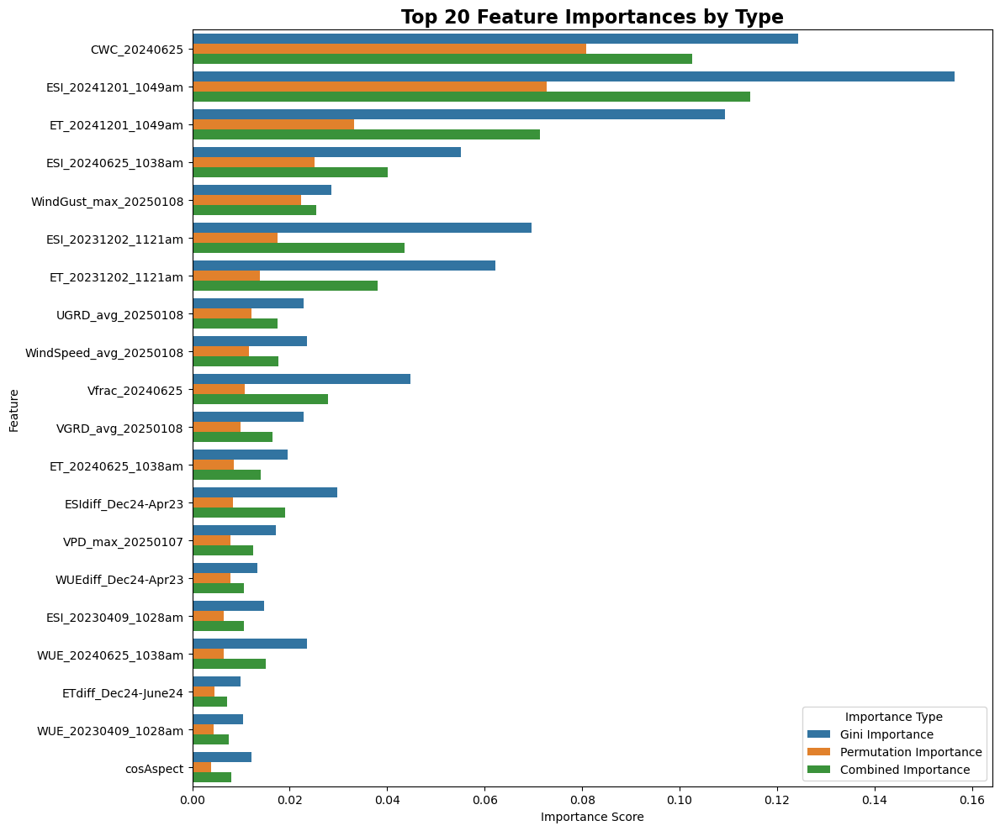

                   Feature  Gini Importance  Permutation Importance  \
0      ESI_20241201_1049am         0.156352                0.072658   
1             CWC_20240625         0.124322                0.080824   
2       ET_20241201_1049am         0.109287                0.033264   
3      ESI_20231202_1121am         0.069534                0.017477   
4      ESI_20240625_1038am         0.055167                0.025020   
5       ET_20231202_1121am         0.062272                0.013946   
7    WindGust_max_20250108         0.028485                0.022299   
6           Vfrac_20240625         0.044808                0.010824   
9   WindSpeed_avg_20250108         0.023628                0.011626   
10       UGRD_avg_20250108         0.022805                0.012176   
8      ESIdiff_Dec24-Apr23         0.029720                0.008441   
11       VGRD_avg_20250108         0.022863                0.010000   
13      ET_20240625_1038am         0.019502                0.008467   
12    

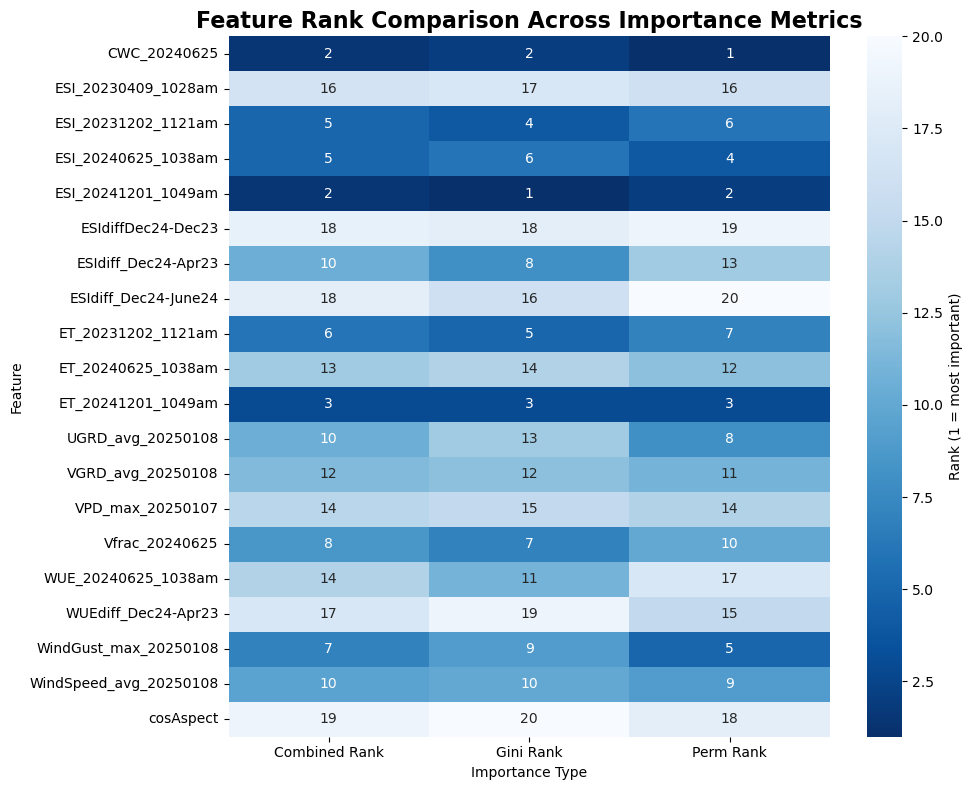

In [13]:
# ----------------------------
# Side-by-side comparison of the three importance types for the top 20 variables
# ----------------------------
"""
# ----------------------------
# Compare Feature Importance Across Methods
# ----------------------------
Purpose:
- Evaluate consistency between different importance metrics:
    * Gini Importance (tree-based, fast, can be biased)
    * Permutation Importance (more reliable, accounts for predictive reliance)
    * Combined (average of both, balances biases)
- Display top 20 features with side-by-side barplots
- Rank features by each metric to identify where methods agree/disagree

Notes:
- Using top 20 by combined score (average of Gini + Permutation)
- Make sure to consider correlation filtering first to avoid redundant features
"""

# Step 1: Get top 20 features by combined importance
top20_comb = combined_df.sort_values('Importance Mean', ascending=False).head(20)

# Step 2: Merge the three importance values
merged = top20_comb[['Feature']].copy()
merged = merged.merge(gini_importance[['Feature', 'Gini Importance']], on='Feature', how='left')
merged = merged.merge(perm_df[['Feature', 'Importance Mean']], on='Feature', how='left')
merged = merged.rename(columns={'Importance Mean': 'Permutation Importance'})

# Add a Combined column if not already in top20_comb
merged["Combined Importance"] = (merged["Gini Importance"] + merged["Permutation Importance"]) / 2

# Step 3: Melt for plotting
plot_df = merged.melt(id_vars="Feature", 
                      value_vars=["Gini Importance", "Permutation Importance", "Combined Importance"],
                      var_name="Importance Type", value_name="Score")

# Step 4: Plot
plt.figure(figsize=(12, 10))
sns.barplot(data=plot_df, y="Feature", x="Score", hue="Importance Type")
plt.title("Top 20 Feature Importances by Type", fontsize=16, fontweight="bold")
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.legend(title="Importance Type")
plt.tight_layout()
plt.show()

# ----------------------------
# Rank each feature by each importance metric.
# ----------------------------

# Select top 20 features from combined_df (sorted by average of both importances)
combined_df["Combined"] = (combined_df["Gini Importance"] + combined_df["Importance Mean"]) / 2
top20_comb = combined_df.sort_values("Combined", ascending=False).head(20)

# Start with just the top 20 feature names
merged = top20_comb[['Feature']].copy()

# Merge in Gini and Permutation importance values
merged = merged.merge(gini_importance[['Feature', 'Gini Importance']], on='Feature', how='left')
merged = merged.merge(perm_df[['Feature', 'Importance Mean']], on='Feature', how='left')
merged = merged.rename(columns={"Importance Mean": "Permutation Importance"})

# Compute ranks (1 = most important)
merged["Gini Rank"] = merged["Gini Importance"].rank(ascending=False)
merged["Perm Rank"] = merged["Permutation Importance"].rank(ascending=False)
merged["Combined Rank"] = (merged["Gini Rank"] + merged["Perm Rank"]) / 2

# Show result
print(merged.sort_values("Combined Rank"))

# ----------------------------
# Heatmap of Feature Ranks Across Importance Types
# ----------------------------
"""
Purpose:
- Visualize agreement/disagreement in rankings across Gini, Permutation, and Combined importance
- Rows = features (top 20 by combined score)
- Columns = importance types
- Lower rank = more important (1 = top-ranked)
"""

# Ensure Combined rank column exists
merged["Combined Rank"] = merged[["Gini Rank", "Perm Rank"]].mean(axis=1)

# Reshape to long format for heatmap
rank_df = merged.melt(
    id_vars="Feature",
    value_vars=["Gini Rank", "Perm Rank", "Combined Rank"],
    var_name="Importance Type",
    value_name="Rank"
)

# Pivot for heatmap
rank_matrix = rank_df.pivot(index="Feature", columns="Importance Type", values="Rank")

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(
    rank_matrix,
    annot=True, fmt=".0f", cmap="Blues_r",  # darker = more important (low rank)
    cbar_kws={"label": "Rank (1 = most important)"}
)
plt.title("Feature Rank Comparison Across Importance Metrics", fontsize=16, fontweight="bold")
plt.xlabel("Importance Type")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

# Reduced-Feature Model

## First Reduction: Retrain the RF on the refined set of predictors

### Retrain RF with first set of reduced variables

In [14]:
# ============================================================
# 1. Define reduced predictor set
# ============================================================
"""
Here we train and evaluate a reduced Random Forest regression model
for predicting dNBR. The reduced predictor set comes from feature importance
and correlation filtering, with the goal of maintaining strong predictive
power while improving interpretability.

This first reduced model still contains correlated features, with the aim of guiding further reduction.
"""
reduced_vars = [
    'CWC_20240625',
    'Vfrac_20240625',
    'ESI_20241201_1049am',
    'ET_20241201_1049am',
    'WUE_20241201_1049am',
    'ESI_20240625_1038am',
    'ET_20240625_1038am',
    'WUE_20240625_1038am',
    'ESI_20231202_1121am',
    'ET_20231202_1121am',
    'ESI_20230409_1028am',
    'ET_20230409_1028am',
    'WUE_20230409_1028am',
    'WindGust_max_20250108',
    'Elevation',
    'cosAspect',
    'Slope'
]


# ----------------------------
# 2. Prepare data
# ----------------------------
X_reduced = df[reduced_vars]     # predictors
y = df["dNBR"]                   # target variable

# Split into train/test sets (stratified by fire for balance)
X_train_red, X_test_red, y_train_red, y_test_red = train_test_split(
    X_reduced, y,
    test_size=0.3,
    random_state=42,
    stratify=df["Fire"]
)

# ----------------------------
# 3. Hyperparameter tuning
# ----------------------------
param_dist = {
    "n_estimators": [100, 200, 300, 400, 500],
    "max_depth": [5, 10, 15, 20, 30],
    "min_samples_split": [5, 10, 20, 40],
    "min_samples_leaf": [5, 10, 20],
    "max_features": ["sqrt", "log2"]
}

# RandomizedSearchCV: sample 25 parameter combinations, 5-fold CV
rf_reduced_cv = RandomizedSearchCV(
    estimator=RandomForestRegressor(random_state=42),
    param_distributions=param_dist,
    n_iter=25,
    cv=5,
    n_jobs=-1,
    verbose=0,
    random_state=42,
    scoring="r2"
)

# Fit cross-validation
rf_reduced_cv.fit(X_train_red, y_train_red)

# ----------------------------
# 4. Train final model
# ----------------------------
# Get best parameters from CV
best_params_red = rf_reduced_cv.best_params_

# Initialize reduced model with best parameters
rf_reduced = RandomForestRegressor(
    **best_params_red,
    oob_score=True,
    random_state=42
)

# Fit on training data
rf_reduced.fit(X_train_red, y_train_red)

RandomForestRegressor(max_depth=20, max_features='sqrt', min_samples_leaf=5,
                      min_samples_split=10, n_estimators=500, oob_score=True,
                      random_state=42)

In [15]:
# ============================================================
# Evaluation: Reduced Random Forest Model
# ============================================================

# ----------------------------
# 1. Evaluate on test data
# ----------------------------
y_pred_red = rf_reduced.predict(X_test_red)

# Performance metrics (test set)
r2_test  = r2_score(y_test_red, y_pred_red)
mse_test = mean_squared_error(y_test_red, y_pred_red)
rmse_test = np.sqrt(mse_test)
mae_test = mean_absolute_error(y_test_red, y_pred_red)

# Adjusted R² (test set)
n = len(y_test_red)            # number of samples
k = X_test_red.shape[1]        # number of predictors
r2_adj_test = 1 - ((1 - r2_test) * (n - 1)) / (n - k - 1)

# ----------------------------
# 2. Evaluate on training data
# ----------------------------
y_pred_train_red = rf_reduced.predict(X_train_red)

r2_train  = r2_score(y_train_red, y_pred_train_red)
rmse_train = np.sqrt(mean_squared_error(y_train_red, y_pred_train_red))
mae_train = mean_absolute_error(y_train_red, y_pred_train_red)

# ----------------------------
# 3. Print performance summary
# ----------------------------
print("\nReduced Feature Model – Train vs. Test Comparison")
print("-------------------------------------------------")
print(f"Train R²:           {r2_train:.3f}")
print(f"Test R²:            {r2_test:.3f}")
print(f"Test RMSE:          {rmse_test:.3f}")
print(f"Test MAE:           {mae_test:.3f}")
print(f"Generalization Gap: {r2_test - r2_train:.3f}")  # test - train

print("\nReduced Feature Model – Detailed Metrics")
print("-----------------------------------------")
print(f"Best Parameters:    {best_params_red}")
print(f"OOB R²:             {rf_reduced.oob_score_:.3f}")
print(f"Adjusted Test R²:   {r2_adj_test:.3f}")
print(f"RMSE (Test):        {rmse_test:.3f}")
print(f"MAE (Test):         {mae_test:.3f}")

# ----------------------------
# 4. Save metrics into DataFrame
# ----------------------------
metrics_reduced = pd.DataFrame({
    "Train R²": [r2_train],
    "Test R²": [r2_test],
    "Adjusted R² (Test)": [r2_adj_test],
    "RMSE (Test)": [rmse_test],
    "MAE (Test)": [mae_test],
    "OOB R²": [rf_reduced.oob_score_],
    "Generalization Gap": [r2_test - r2_train]
}, index=["Reduced Model"])

print("\nSummary Metrics (Transposed)")
print(metrics_reduced.T)



Reduced Feature Model – Train vs. Test Comparison
-------------------------------------------------
Train R²:           0.810
Test R²:            0.596
Test RMSE:          0.120
Test MAE:           0.088
Generalization Gap: -0.214

Reduced Feature Model – Detailed Metrics
-----------------------------------------
Best Parameters:    {'n_estimators': 500, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'max_depth': 20}
OOB R²:             0.593
Adjusted Test R²:   0.586
RMSE (Test):        0.120
MAE (Test):         0.088

Summary Metrics (Transposed)
                    Reduced Model
Train R²                 0.810463
Test R²                  0.596386
Adjusted R² (Test)       0.586129
RMSE (Test)              0.120475
MAE (Test)               0.087628
OOB R²                   0.593064
Generalization Gap      -0.214077


### Further tune hyperparameters to reduce overfitting

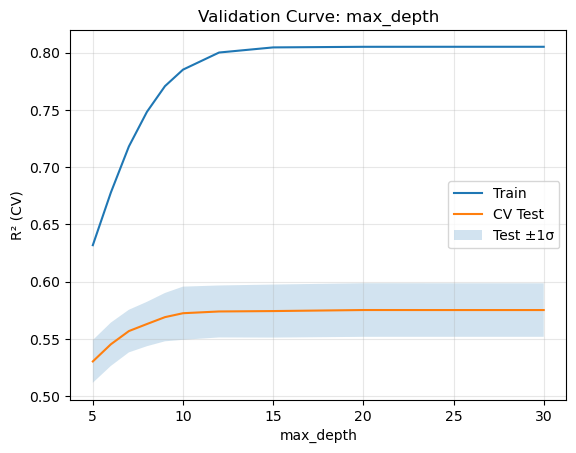

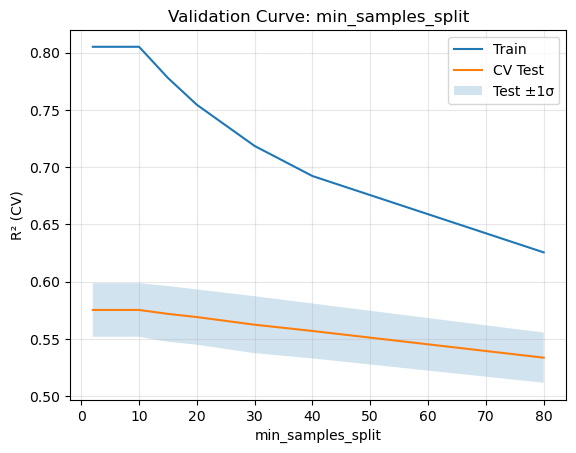

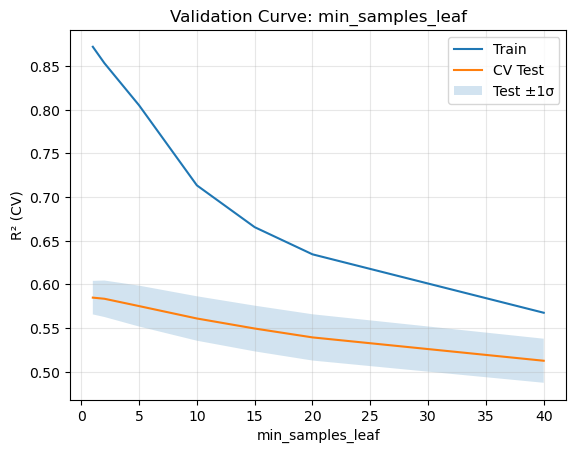

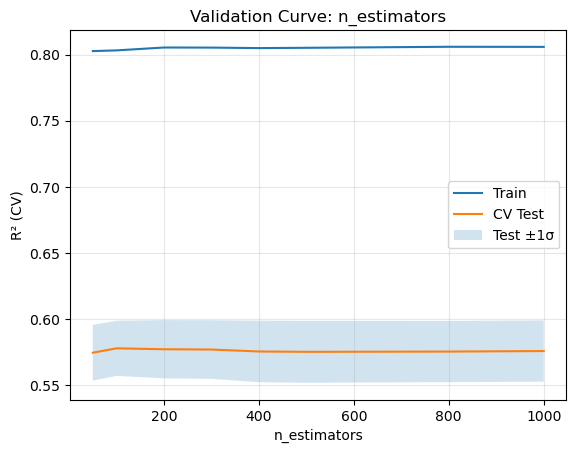

In [16]:
# ============================================================
# Hyperparameter Diagnostics: Validation Curves (Reduced Model)
# ============================================================
"""
Purpose:
- Evaluate how RF hyperparameters affect performance for the Reduced Feature Model
- Compares training vs. validation R² using 5-fold CV
- A large Train–Test gap indicates overfitting risk

Hyperparameters tested:
  * max_depth          → maximum depth of each tree
  * min_samples_split  → min samples required to split a node
  * min_samples_leaf   → min samples required at a leaf
  * n_estimators       → number of trees in the forest

Outputs:
- Validation curves (Train vs. CV Test R² with ±1σ shading)
- Tabular results for each hyperparameter
"""

# Base: tuned reduced model parameters
base_params_red = {**best_params_red, "random_state": 42}
base_est_red = RandomForestRegressor(**base_params_red)

# 5-fold CV (no grouping by Fire — all mixed)
kf = KFold(n_splits=5, shuffle=True, random_state=42)

def run_val_curve(estimator, X, y, param_name, param_range, xlabel=None, title=None):
    train_scores, test_scores = validation_curve(
        estimator, X, y,
        param_name=param_name, param_range=param_range,
        cv=kf, scoring="r2", n_jobs=-1
    )
    tr_m, te_m = train_scores.mean(axis=1), test_scores.mean(axis=1)
    tr_s, te_s = train_scores.std(axis=1),  test_scores.std(axis=1)

    # Plot
    plt.plot(param_range, tr_m, label="Train")
    plt.plot(param_range, te_m, label="CV Test")
    plt.fill_between(param_range, te_m - te_s, te_m + te_s, alpha=0.2, label="Test ±1σ")
    if xlabel: plt.xlabel(xlabel)
    plt.ylabel("R² (CV)")
    plt.title(title or f"Validation Curve: {param_name}")
    plt.legend(); plt.grid(True, alpha=0.3)
    plt.show()

    # Tabular summary
    return pd.DataFrame({
        param_name: param_range,
        "train_r2": tr_m,
        "test_r2": te_m,
        "gap": tr_m - te_m,
        "test_std": te_s
    }).round(3)

# ----------------------------
# Run validation curves (Reduced Model)
# ----------------------------

# max_depth
depths = [5, 6, 7, 8, 9, 10, 12, 15, 20, 25, 30]
vc_depth_red = run_val_curve(base_est_red, X_train_red, y_train_red,
                             "max_depth", depths, xlabel="max_depth")

# min_samples_split
split_range = [2, 5, 10, 15, 20, 30, 40, 80]
vc_split_red = run_val_curve(base_est_red, X_train_red, y_train_red,
                             "min_samples_split", split_range, xlabel="min_samples_split")

# min_samples_leaf
leaf_range = [1, 2, 5, 10, 15, 20, 40]
vc_leaf_red = run_val_curve(base_est_red, X_train_red, y_train_red,
                            "min_samples_leaf", leaf_range, xlabel="min_samples_leaf")

# n_estimators
estimator_range = [50, 100, 200, 300, 400, 500, 800, 1000]
vc_trees_red = run_val_curve(base_est_red, X_train_red, y_train_red,
                             "n_estimators", estimator_range, xlabel="n_estimators")


### Retrain reduced model with updated hyperparameters to balance overfitting and underfitting

In [17]:
# ============================================================
# Update RF model hyperparameters (Reduced Model)
# ============================================================
"""
Retrain the Reduced Feature RF with custom hyperparameters
(selected based on validation curves + CV).
"""

# Start from reduced model best params
custom_params_red = best_params_red.copy()
custom_params_red.update({
    "n_estimators": 400,
    "max_depth": 8,
    "min_samples_split": 20,
    "min_samples_leaf": 10,
    "max_features": "sqrt",
})

# Train tuned reduced RF
rf_reduced_tuned = RandomForestRegressor(
    **custom_params_red,
    oob_score=True,
    random_state=42
)
rf_reduced_tuned.fit(X_train_red, y_train_red)

# ----------------------------
# Evaluate tuned reduced model
# ----------------------------
ytr_red = rf_reduced_tuned.predict(X_train_red)
yte_red = rf_reduced_tuned.predict(X_test_red)

print("\nReduced Model Performance with Updated Hyperparameters:")
print("-------------------------------------------------------")
print(f"OOB R²:             {rf_reduced_tuned.oob_score_:.3f}")
print(f"Train R²:           {r2_score(y_train_red, ytr_red):.3f}")
print(f"Test R²:            {r2_score(y_test_red, yte_red):.3f}")
print(f"Test RMSE:          {np.sqrt(mean_squared_error(y_test_red, yte_red)):.3f}")
print(f"Test MAE:           {mean_absolute_error(y_test_red, yte_red):.3f}")
print(f"Generalization Gap: {r2_score(y_test_red, yte_red) - r2_score(y_train_red, ytr_red):.3f}")


Reduced Model Performance with Updated Hyperparameters:
-------------------------------------------------------
OOB R²:             0.563
Train R²:           0.692
Test R²:            0.568
Test RMSE:          0.125
Test MAE:           0.091
Generalization Gap: -0.124



Reduced Model Feature Importances:
                  Feature  Importance
2     ESI_20241201_1049am    0.222979
0            CWC_20240625    0.182327
3      ET_20241201_1049am    0.115337
8     ESI_20231202_1121am    0.080216
5     ESI_20240625_1038am    0.061296
9      ET_20231202_1121am    0.056456
1          Vfrac_20240625    0.053026
13  WindGust_max_20250108    0.046068
7     WUE_20240625_1038am    0.033669
6      ET_20240625_1038am    0.028274
10    ESI_20230409_1028am    0.023667
15              cosAspect    0.020332
4     WUE_20241201_1049am    0.020225
14              Elevation    0.016714
16                  Slope    0.015002
12    WUE_20230409_1028am    0.014880
11     ET_20230409_1028am    0.009531


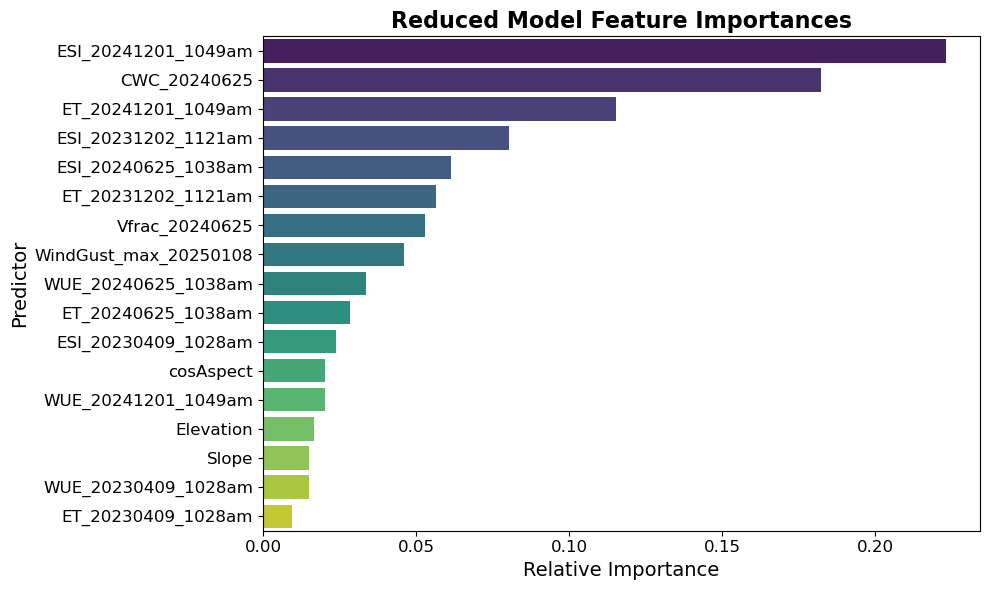


Permutation Importances (Reduced Model):
                  Feature  Importance Mean  Importance Std
0            CWC_20240625         0.114007        0.010603
2     ESI_20241201_1049am         0.098402        0.007099
13  WindGust_max_20250108         0.041654        0.005189
3      ET_20241201_1049am         0.037303        0.004612
5     ESI_20240625_1038am         0.026956        0.004143
6      ET_20240625_1038am         0.014531        0.001507
10    ESI_20230409_1028am         0.012809        0.002061
8     ESI_20231202_1121am         0.012055        0.004324
9      ET_20231202_1121am         0.008747        0.002310
1          Vfrac_20240625         0.008643        0.002333
15              cosAspect         0.007369        0.001669
7     WUE_20240625_1038am         0.006305        0.002244
12    WUE_20230409_1028am         0.006138        0.000896
14              Elevation         0.004304        0.000843
16                  Slope         0.003445        0.001944
4     WUE_2024

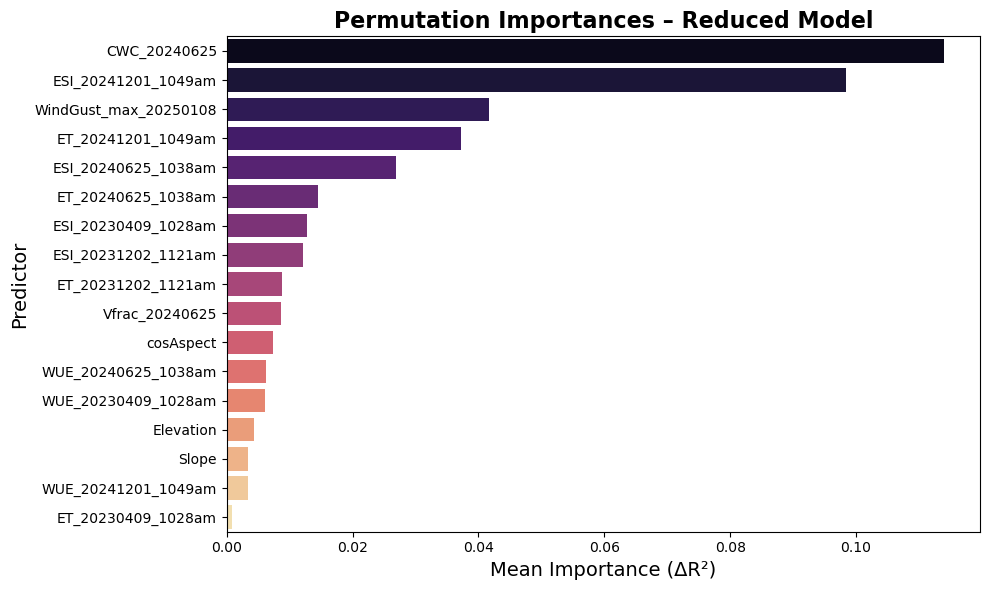

In [18]:
# Check importances to select final features in model

# ============================================================
# Feature Importances (Reduced Model)
# ============================================================
"""
Purpose:
- Rank the reduced predictor set by importance
- Helps identify which variables contribute most to dNBR prediction
"""

# Get importances
importances_red = rf_reduced_tuned.feature_importances_
feat_importances_red = pd.DataFrame({
    "Feature": reduced_vars,
    "Importance": importances_red
}).sort_values(by="Importance", ascending=False)

print("\nReduced Model Feature Importances:")
print(feat_importances_red)

# ----------------------------
# Plot split-based importances
# ----------------------------
plt.figure(figsize=(10, 6))
sns.barplot(
    data=feat_importances_red,
    x="Importance", y="Feature",
    palette="viridis"
)
plt.title("Reduced Model Feature Importances", fontsize=16, weight="bold")
plt.xlabel("Relative Importance", fontsize=14)
plt.ylabel("Predictor", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()

# ----------------------------
# Permutation Importance (Reduced Model)
# ----------------------------
"""
Purpose:
- Evaluate variable importance by measuring the drop in performance
  when each predictor is randomly permuted
"""

from sklearn.inspection import permutation_importance

# Run permutation importance on test set
perm_red = permutation_importance(
    rf_reduced_tuned,
    X_test_red, y_test_red,
    n_repeats=30,
    random_state=42,
    scoring="r2",
    n_jobs=-1
)

# Convert to DataFrame
perm_df_red = pd.DataFrame({
    "Feature": reduced_vars,
    "Importance Mean": perm_red.importances_mean,
    "Importance Std": perm_red.importances_std
}).sort_values(by="Importance Mean", ascending=False)

print("\nPermutation Importances (Reduced Model):")
print(perm_df_red)

# ----------------------------
# Plot permutation importances
# ----------------------------
plt.figure(figsize=(10, 6))
sns.barplot(
    data=perm_df_red.sort_values("Importance Mean", ascending=False),
    x="Importance Mean", y="Feature",
    palette="magma"
)
plt.title("Permutation Importances – Reduced Model", fontsize=16, weight="bold")
plt.xlabel("Mean Importance (ΔR²)", fontsize=14)
plt.ylabel("Predictor", fontsize=14)
plt.tight_layout()
plt.show()

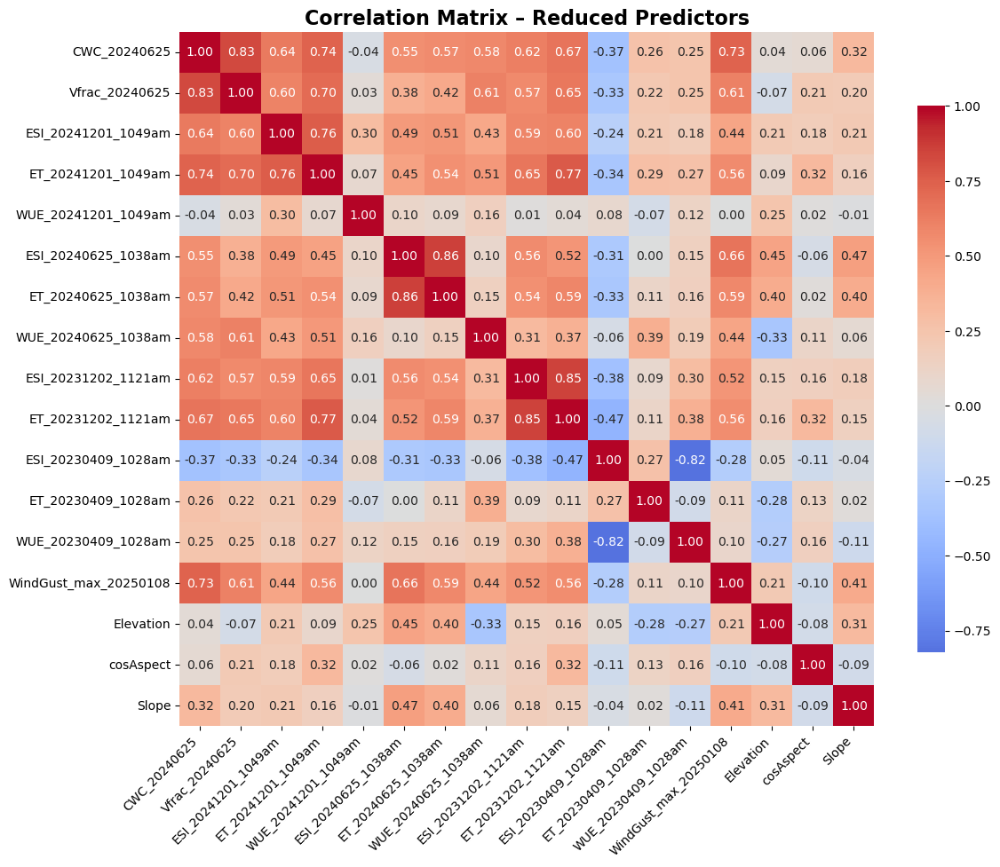

In [19]:
# ----------------------------
# Correlation Heatmap (Reduced Predictors)
# ----------------------------
"""
Purpose:
- Visualize pairwise correlations among reduced predictors
- Helps identify redundant variables to consider dropping for the final model
"""

# Compute correlation matrix
corr_red = X_train_red[reduced_vars].corr()

# Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(
    corr_red,
    annot=True, fmt=".2f",
    cmap="coolwarm", center=0,
    square=True,
    cbar_kws={"shrink": 0.75}
)
plt.title("Correlation Matrix – Reduced Predictors", fontsize=16, weight="bold")
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.yticks(rotation=0, fontsize=10)
plt.tight_layout()
plt.show()


## Final Reduction: Retrain the RF on the refined set of predictors (r >= 0.75)

### Retrain RF with final set of reduced variables

In [20]:
# ============================================================
# 1. Define reduced predictor set
# ============================================================
"""
Here we train and evaluate a reduced Random Forest regression model
for predicting dNBR. The reduced predictor set comes from feature importance
and correlation filtering, with the goal of maintaining strong predictive
power while improving interpretability.

This final reduced model contains features correlated <= 0.75.
"""
reduced_vars_final = [
    'CWC_20240625',
    'ESI_20241201_1049am',
    'ESI_20240625_1038am',
    'WUE_20230409_1028am',
    'WindGust_max_20250108',
    'Elevation',
    'cosAspect'
]


# ----------------------------
# 2. Prepare data
# ----------------------------
X_reduced = df[reduced_vars_final]     # predictors
y = df["dNBR"]                   # target variable

# Split into train/test sets (stratified by fire for balance)
X_train_red, X_test_red, y_train_red, y_test_red = train_test_split(
    X_reduced, y,
    test_size=0.3,
    random_state=42,
    stratify=df["Fire"]
)

# ----------------------------
# 3. Hyperparameter tuning
# ----------------------------
param_dist = {
    "n_estimators": [100, 200, 300, 400, 500],
    "max_depth": [5, 10, 15, 20, 30],
    "min_samples_split": [5, 10, 20, 40],
    "min_samples_leaf": [5, 10, 20],
    "max_features": ["sqrt", "log2"]
}

# RandomizedSearchCV: sample 25 parameter combinations, 5-fold CV
rf_reduced_cv = RandomizedSearchCV(
    estimator=RandomForestRegressor(random_state=42),
    param_distributions=param_dist,
    n_iter=25,
    cv=5,
    n_jobs=-1,
    verbose=0,
    random_state=42,
    scoring="r2"
)

# Fit cross-validation
rf_reduced_cv.fit(X_train_red, y_train_red)

# ----------------------------
# 4. Train final model
# ----------------------------
# Get best parameters from CV
best_params_red = rf_reduced_cv.best_params_

# Initialize reduced model with best parameters
rf_reduced = RandomForestRegressor(
    **best_params_red,
    oob_score=True,
    random_state=42
)

# Fit on training data
rf_reduced.fit(X_train_red, y_train_red)

RandomForestRegressor(max_depth=20, max_features='sqrt', min_samples_leaf=5,
                      min_samples_split=10, n_estimators=400, oob_score=True,
                      random_state=42)

In [21]:
# ============================================================
# Evaluation: Final Reduced Random Forest Model
# ============================================================

# ----------------------------
# 1. Evaluate on test data
# ----------------------------
y_pred_red = rf_reduced.predict(X_test_red)

# Performance metrics (test set)
r2_test  = r2_score(y_test_red, y_pred_red)
mse_test = mean_squared_error(y_test_red, y_pred_red)
rmse_test = np.sqrt(mse_test)
mae_test = mean_absolute_error(y_test_red, y_pred_red)

# Adjusted R² (test set)
n = len(y_test_red)            # number of samples
k = X_test_red.shape[1]        # number of predictors
r2_adj_test = 1 - ((1 - r2_test) * (n - 1)) / (n - k - 1)

# ----------------------------
# 2. Evaluate on training data
# ----------------------------
y_pred_train_red = rf_reduced.predict(X_train_red)

r2_train  = r2_score(y_train_red, y_pred_train_red)
rmse_train = np.sqrt(mean_squared_error(y_train_red, y_pred_train_red))
mae_train = mean_absolute_error(y_train_red, y_pred_train_red)

# ----------------------------
# 3. Print performance summary
# ----------------------------
print("\nReduced Feature Model – Train vs. Test Comparison")
print("-------------------------------------------------")
print(f"Train R²:           {r2_train:.3f}")
print(f"Test R²:            {r2_test:.3f}")
print(f"Test RMSE:          {rmse_test:.3f}")
print(f"Test MAE:           {mae_test:.3f}")
print(f"Generalization Gap: {r2_test - r2_train:.3f}")  # test - train

print("\nReduced Feature Model – Detailed Metrics")
print("-----------------------------------------")
print(f"Best Parameters:    {best_params_red}")
print(f"OOB R²:             {rf_reduced.oob_score_:.3f}")
print(f"Adjusted Test R²:   {r2_adj_test:.3f}")
print(f"RMSE (Test):        {rmse_test:.3f}")
print(f"MAE (Test):         {mae_test:.3f}")

# ----------------------------
# 4. Save metrics into DataFrame
# ----------------------------
metrics_reduced = pd.DataFrame({
    "Train R²": [r2_train],
    "Test R²": [r2_test],
    "Adjusted R² (Test)": [r2_adj_test],
    "RMSE (Test)": [rmse_test],
    "MAE (Test)": [mae_test],
    "OOB R²": [rf_reduced.oob_score_],
    "Generalization Gap": [r2_test - r2_train]
}, index=["Reduced Model"])

print("\nSummary Metrics (Transposed)")
print(metrics_reduced.T)


Reduced Feature Model – Train vs. Test Comparison
-------------------------------------------------
Train R²:           0.777
Test R²:            0.610
Test RMSE:          0.118
Test MAE:           0.088
Generalization Gap: -0.167

Reduced Feature Model – Detailed Metrics
-----------------------------------------
Best Parameters:    {'n_estimators': 400, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'max_depth': 20}
OOB R²:             0.582
Adjusted Test R²:   0.606
RMSE (Test):        0.118
MAE (Test):         0.088

Summary Metrics (Transposed)
                    Reduced Model
Train R²                 0.777419
Test R²                  0.610388
Adjusted R² (Test)       0.606371
RMSE (Test)              0.118367
MAE (Test)               0.087849
OOB R²                   0.581684
Generalization Gap      -0.167031


### Further tune hyperparameters to reduce overfitting

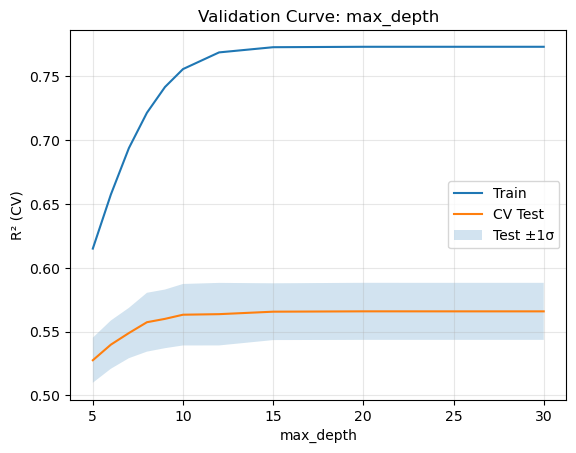

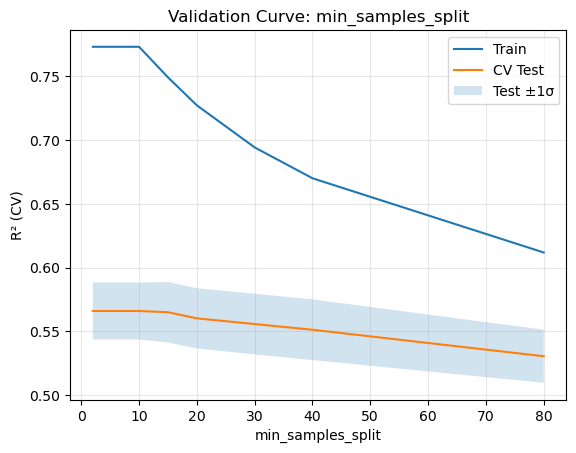

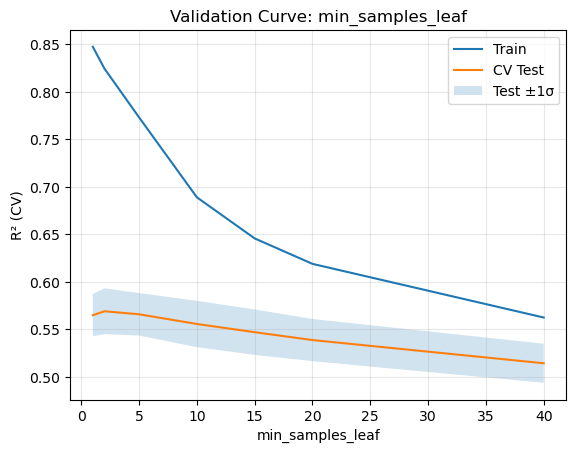

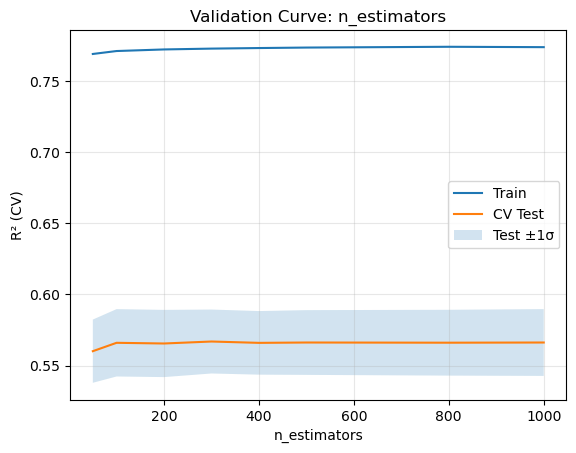

In [22]:
# ============================================================
# Hyperparameter Diagnostics: Validation Curves (Reduced Model)
# ============================================================
"""
Purpose:
- Evaluate how RF hyperparameters affect performance for the Reduced Feature Model
- Compares training vs. validation R² using 5-fold CV
- A large Train–Test gap indicates overfitting risk

Hyperparameters tested:
  * max_depth          → maximum depth of each tree
  * min_samples_split  → min samples required to split a node
  * min_samples_leaf   → min samples required at a leaf
  * n_estimators       → number of trees in the forest

Outputs:
- Validation curves (Train vs. CV Test R² with ±1σ shading)
- Tabular results for each hyperparameter
"""

# Base: tuned reduced model parameters
base_params_red = {**best_params_red, "random_state": 42}
base_est_red = RandomForestRegressor(**base_params_red)

# 5-fold CV (no grouping by Fire — all mixed)
kf = KFold(n_splits=5, shuffle=True, random_state=42)

def run_val_curve(estimator, X, y, param_name, param_range, xlabel=None, title=None):
    train_scores, test_scores = validation_curve(
        estimator, X, y,
        param_name=param_name, param_range=param_range,
        cv=kf, scoring="r2", n_jobs=-1
    )
    tr_m, te_m = train_scores.mean(axis=1), test_scores.mean(axis=1)
    tr_s, te_s = train_scores.std(axis=1),  test_scores.std(axis=1)

    # Plot
    plt.plot(param_range, tr_m, label="Train")
    plt.plot(param_range, te_m, label="CV Test")
    plt.fill_between(param_range, te_m - te_s, te_m + te_s, alpha=0.2, label="Test ±1σ")
    if xlabel: plt.xlabel(xlabel)
    plt.ylabel("R² (CV)")
    plt.title(title or f"Validation Curve: {param_name}")
    plt.legend(); plt.grid(True, alpha=0.3)
    plt.show()

    # Tabular summary
    return pd.DataFrame({
        param_name: param_range,
        "train_r2": tr_m,
        "test_r2": te_m,
        "gap": tr_m - te_m,
        "test_std": te_s
    }).round(3)

# ----------------------------
# Run validation curves (Reduced Model)
# ----------------------------

# max_depth
depths = [5, 6, 7, 8, 9, 10, 12, 15, 20, 25, 30]
vc_depth_red = run_val_curve(base_est_red, X_train_red, y_train_red,
                             "max_depth", depths, xlabel="max_depth")

# min_samples_split
split_range = [2, 5, 10, 15, 20, 30, 40, 80]
vc_split_red = run_val_curve(base_est_red, X_train_red, y_train_red,
                             "min_samples_split", split_range, xlabel="min_samples_split")

# min_samples_leaf
leaf_range = [1, 2, 5, 10, 15, 20, 40]
vc_leaf_red = run_val_curve(base_est_red, X_train_red, y_train_red,
                            "min_samples_leaf", leaf_range, xlabel="min_samples_leaf")

# n_estimators
estimator_range = [50, 100, 200, 300, 400, 500, 800, 1000]
vc_trees_red = run_val_curve(base_est_red, X_train_red, y_train_red,
                             "n_estimators", estimator_range, xlabel="n_estimators")


### Retrain final reduced model with updated hyperparameters to balance overfitting and underfitting

In [23]:
# ----------------------------
# Update RF model hyperparameters (Reduced Model)
# ----------------------------
"""
Retrain the Reduced Feature RF with custom hyperparameters
(selected based on validation curves + CV).
"""

# Start from reduced model best params
custom_params_red = best_params_red.copy()
custom_params_red.update({
    "n_estimators": 400,
    "max_depth": 10,
    "min_samples_split": 20,
    "min_samples_leaf": 5,
    "max_features": "sqrt",
})

# Train tuned reduced RF
rf_reduced_tuned = RandomForestRegressor(
    **custom_params_red,
    oob_score=True,
    random_state=42
)
rf_reduced_tuned.fit(X_train_red, y_train_red)

# ----------------------------
# Evaluate tuned reduced model
# ----------------------------
ytr_red = rf_reduced_tuned.predict(X_train_red)
yte_red = rf_reduced_tuned.predict(X_test_red)

print("\nReduced Model Performance with Updated Hyperparameters:")
print("-------------------------------------------------------")
print(f"OOB R²:             {rf_reduced_tuned.oob_score_:.3f}")
print(f"Train R²:           {r2_score(y_train_red, ytr_red):.3f}")
print(f"Test R²:            {r2_score(y_test_red, yte_red):.3f}")
print(f"Test RMSE:          {np.sqrt(mean_squared_error(y_test_red, yte_red)):.3f}")
print(f"Test MAE:           {mean_absolute_error(y_test_red, yte_red):.3f}")
print(f"Generalization Gap: {r2_score(y_test_red, yte_red) - r2_score(y_train_red, ytr_red):.3f}")


Reduced Model Performance with Updated Hyperparameters:
-------------------------------------------------------
OOB R²:             0.572
Train R²:           0.719
Test R²:            0.599
Test RMSE:          0.120
Test MAE:           0.089
Generalization Gap: -0.120


# Final Reduced-Feature Model Evaluation 
Correlation, VIF, Importance, Scatter, Histogram, Per-Fire-Stats

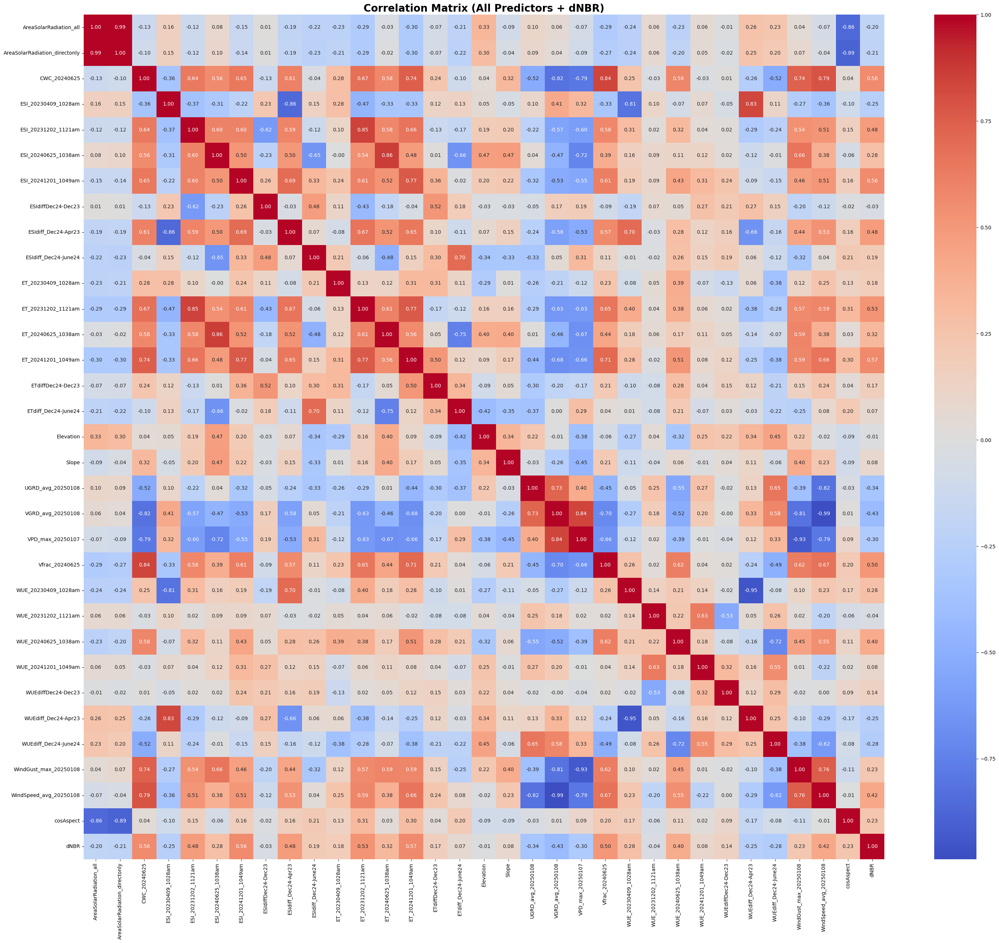

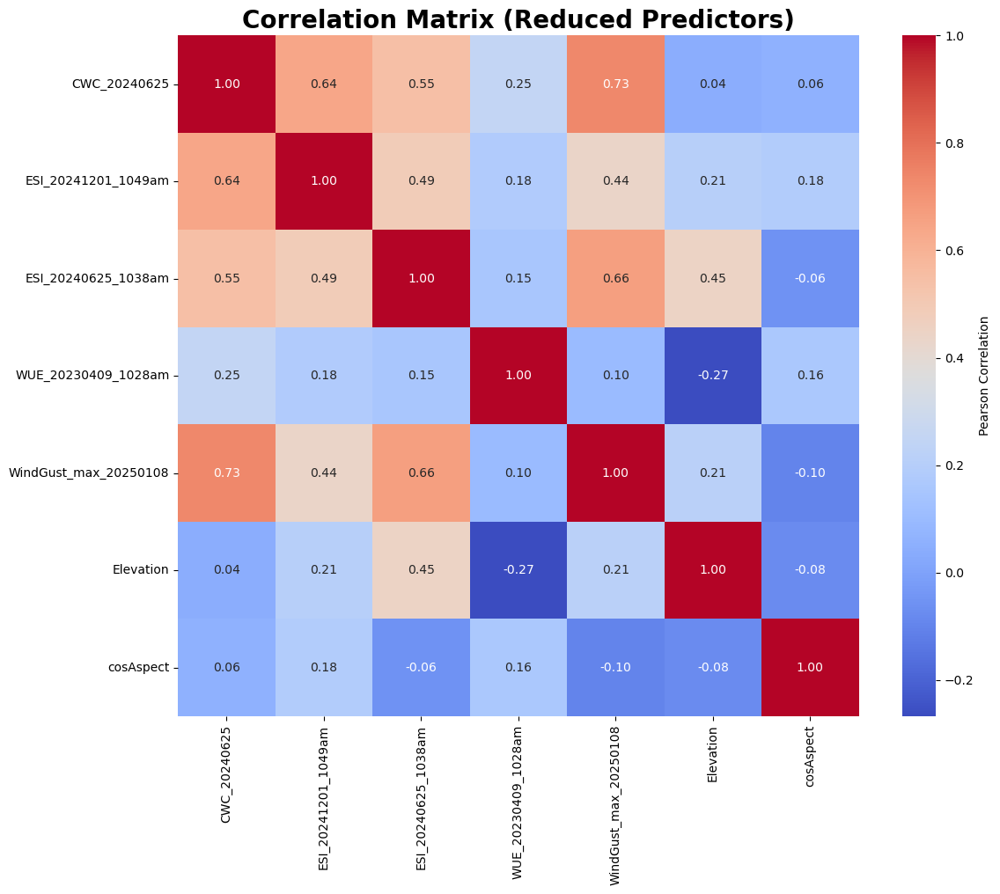


Variance Inflation Factors (Reduced Set):
                 Feature   VIF
0           CWC_20240625  3.32
4  WindGust_max_20250108  2.97
2    ESI_20240625_1038am  2.49
1    ESI_20241201_1049am  1.97
5              Elevation  1.58
3    WUE_20230409_1028am  1.26
6              cosAspect  1.11
                 Feature   VIF
0           CWC_20240625  3.32
4  WindGust_max_20250108  2.97
2    ESI_20240625_1038am  2.49
1    ESI_20241201_1049am  1.97
5              Elevation  1.58
3    WUE_20230409_1028am  1.26
6              cosAspect  1.11


In [24]:
# ============================================================
# All Variables: Correlation Matrix with dNBR
# ============================================================

# Include both predictors and dNBR
vars_with_dnbr = continuous_vars + ["dNBR"]

plt.figure(figsize=(30, 26))
sns.heatmap(
    df[vars_with_dnbr].corr(),
    annot=True,
    cmap="coolwarm",
    center=0,
    fmt=".2f"  # format to 2 decimals
)
plt.title("Correlation Matrix (All Predictors + dNBR)", fontsize=20, fontweight="bold")
plt.tight_layout()
plt.show()

# ============================================================
# Reduced Variables: Correlation Matrix
# ============================================================
plt.figure(figsize=(12, 10))
corr_matrix_red = X_train_red.corr()
sns.heatmap(
    corr_matrix_red,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    square=True,
    cbar_kws={"label": "Pearson Correlation"}
)
plt.title("Correlation Matrix (Reduced Predictors)", fontsize=20, fontweight="bold")
plt.tight_layout()
plt.show()

# ----------------------------
# Variance Inflation Factors (VIF)
# ----------------------------
X_vif = add_constant(X_train_red)
vif_data = pd.DataFrame({
    "Feature": X_train_red.columns,
    "VIF": [
        variance_inflation_factor(X_vif.values, i + 1)
        for i in range(X_train_red.shape[1])
    ]
}).sort_values("VIF", ascending=False)

print("\nVariance Inflation Factors (Reduced Set):")
print(vif_data.round(2))
print(vif_data.round(2))

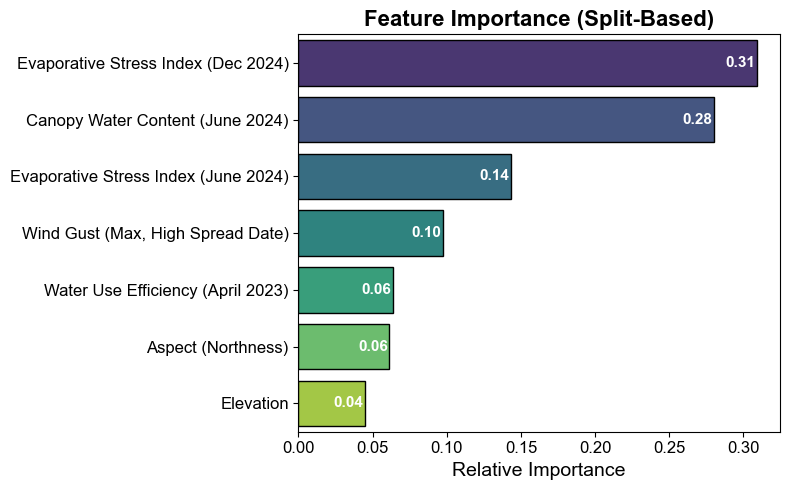

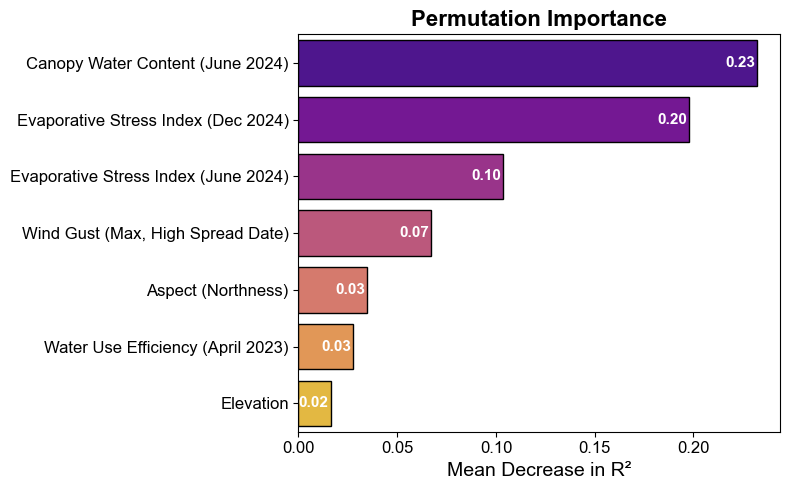

In [25]:
# ============================================================
# Evaluation Plots
# ============================================================
# Set default font family to Arial
mpl.rcParams["font.family"] = "Arial"

# ----------------------------
# Feature Importance (Split-Based)
# ----------------------------

importances = rf_reduced_tuned.feature_importances_
sorted_idx = np.argsort(importances)[::-1]
sorted_features = [X_train_red.columns[i] for i in sorted_idx]
sorted_importances = importances[sorted_idx]

feature_rename = {
    "CWC_20240625": "Canopy Water Content (June 2024)",
    "ESI_20241201_1049am": "Evaporative Stress Index (Dec 2024)",
    "ESI_20240625_1038am": "Evaporative Stress Index (June 2024)",
    "WUE_20230409_1028am": "Water Use Efficiency (April 2023)",
    "WindGust_max_20250108": "Wind Gust (Max, High Spread Date)",
    "Elevation": "Elevation",
    "cosAspect": "Aspect (Northness)"
}

renamed_sorted_features = [feature_rename.get(f, f) for f in sorted_features]

plt.figure(figsize=(8, 5))
ax = sns.barplot(
    x=sorted_importances, y=renamed_sorted_features,
    palette="viridis", edgecolor="black"
)

# Add value labels (white on bars)
for i, val in enumerate(sorted_importances):
    ax.text(val - 0.001, i, f"{val:.2f}",
            color="white", va="center", ha="right", fontsize=11, weight="bold")

plt.title("Feature Importance (Split-Based)", fontsize=16, fontweight="bold")
plt.xlabel("Relative Importance", fontsize=14)
plt.ylabel("")
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.savefig("/Users/megan/Desktop/figures-rfr-lafires/feature_importance.png",
            dpi=300, bbox_inches="tight", facecolor="white")
plt.show()


# ----------------------------
# Permutation Importance
# ----------------------------

perm = permutation_importance(
    rf_reduced_tuned, 
    X_test_red, y_test_red, 
    n_repeats=30,   # increase for more stability
    random_state=42, n_jobs=-1, 
    scoring="r2"
)

perm_df = pd.DataFrame({
    "Feature": X_test_red.columns,
    "ImportanceMean": perm.importances_mean,
    "ImportanceSTD": perm.importances_std
}).sort_values("ImportanceMean", ascending=False)

perm_df["FeatureLabel"] = perm_df["Feature"].map(feature_rename).fillna(perm_df["Feature"])

plt.figure(figsize=(8, 5))
ax = sns.barplot(
    data=perm_df.sort_values("ImportanceMean", ascending=False),
    x="ImportanceMean", y="FeatureLabel",
    palette="plasma", edgecolor="black"
)

# Add value labels (white on bars)
for i, val in enumerate(perm_df.sort_values("ImportanceMean", ascending=False)["ImportanceMean"]):
    ax.text(val - 0.001, i, f"{val:.2f}",
            color="white", va="center", ha="right", fontsize=11, weight="bold")

plt.title("Permutation Importance", fontsize=16, fontweight="bold")
plt.xlabel("Mean Decrease in R²", fontsize=14)
plt.ylabel("")
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.savefig("/Users/megan/Desktop/figures-rfr-lafires/permutation_importance.png",
            dpi=300, bbox_inches="tight", facecolor="white")
plt.show()

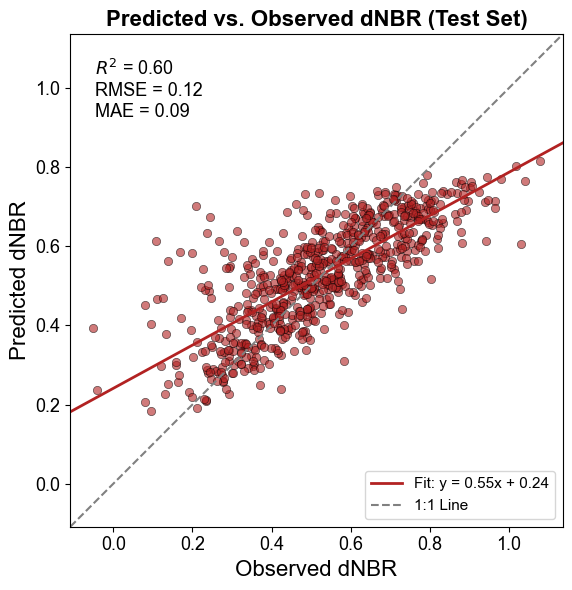

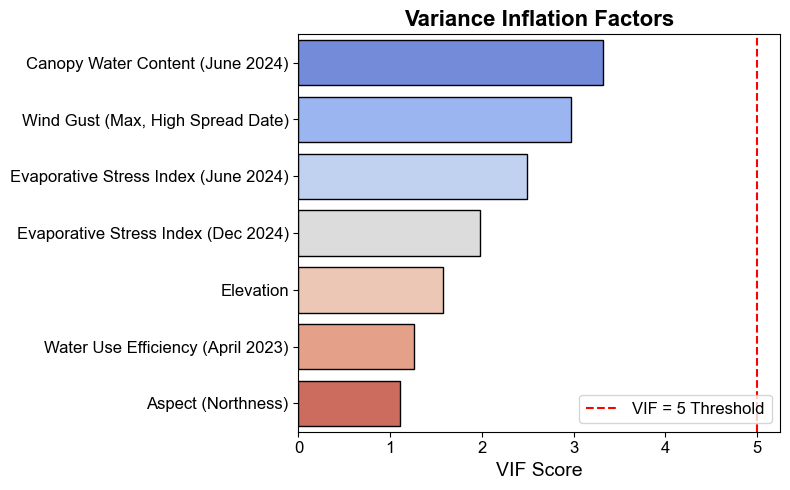

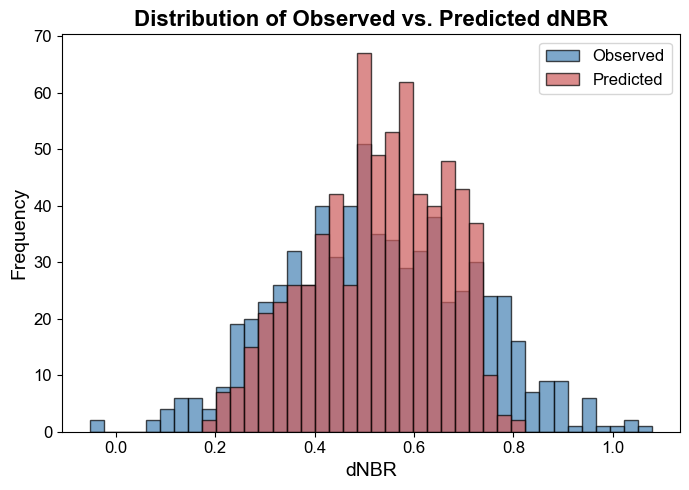

In [26]:
# ----------------------------
# Predicted vs. Observed with Regression Fit and Metrics
# ----------------------------

# Axis limits
all_vals = np.concatenate([y_test_red, yte_red])
buffer = (all_vals.max() - all_vals.min()) * 0.05
min_val, max_val = all_vals.min() - buffer, all_vals.max() + buffer

# Fit regression line
slope, intercept = np.polyfit(y_test_red, yte_red, 1)
x_fit = np.linspace(min_val, max_val, 100)
y_fit = slope * x_fit + intercept

# Metrics
r2_val   = r2_score(y_test_red, yte_red)
rmse_val = np.sqrt(mean_squared_error(y_test_red, yte_red))
mae_val  = mean_absolute_error(y_test_red, yte_red)

# Plot
plt.figure(figsize=(6, 6))
plt.scatter(y_test_red, yte_red, alpha=0.6,
            edgecolor='k', linewidth=0.5, color="firebrick")
plt.plot(x_fit, y_fit, color='firebrick', linewidth=2,
         label=f'Fit: y = {slope:.2f}x + {intercept:.2f}')
plt.axline((0, 0), slope=1, linestyle='--', color='grey',
           linewidth=1.5, label="1:1 Line")

# Labels and limits
plt.xlabel("Observed dNBR", fontsize=16)
plt.ylabel("Predicted dNBR", fontsize=16)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.title("Predicted vs. Observed dNBR (Test Set)", fontsize=16, fontweight="bold")
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)
plt.gca().set_aspect('equal', adjustable='box')

# Annotated metrics
plt.text(0.05, 0.95,
         f"$R^2$ = {r2_val:.2f}\nRMSE = {rmse_val:.2f}\nMAE = {mae_val:.2f}",
         transform=plt.gca().transAxes,
         fontsize=13, verticalalignment='top',
         bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

plt.legend(fontsize=11, loc="lower right")
plt.tight_layout()
plt.savefig("/Users/megan/Desktop/figures-rfr-lafires/scatter_pred_vs_obs.png",
            dpi=300, bbox_inches="tight", facecolor="white")
plt.show()

# ----------------------------
# Variance Inflation Factor (VIF)
# ----------------------------

X_vif = add_constant(X_train_red)
vif_data = pd.DataFrame({
    "Feature": X_train_red.columns,
    "VIF": [
        variance_inflation_factor(X_vif.values, i + 1)
        for i in range(X_train_red.shape[1])
    ]
}).sort_values("VIF", ascending=False)

vif_data["FeatureLabel"] = vif_data["Feature"].map(feature_rename).fillna(vif_data["Feature"])

plt.figure(figsize=(8, 5))
sns.barplot(
    data=vif_data.sort_values("VIF", ascending=False),
    x="VIF", y="FeatureLabel", palette="coolwarm", edgecolor="black"
)
plt.axvline(5, color="red", linestyle="--", label="VIF = 5 Threshold", linewidth=1.5)

plt.title("Variance Inflation Factors", fontsize=16, fontweight="bold")
plt.xlabel("VIF Score", fontsize=14)
plt.ylabel("")
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12, loc="lower right")
plt.tight_layout()
plt.savefig("/Users/megan/Desktop/figures-rfr-lafires/vif.png",
            dpi=300, bbox_inches="tight", facecolor="white")
plt.show()

# ----------------------------
# Histogram: Observed vs. Predicted dNBR
# ----------------------------
bins = np.histogram_bin_edges(np.concatenate([y_test_red, yte_red]), bins=40)

plt.figure(figsize=(7, 5))
plt.hist(y_test_red, bins=bins, alpha=0.7, label="Observed", color="steelblue", edgecolor='black')
plt.hist(yte_red, bins=bins, alpha=0.7, label="Predicted", color="indianred", edgecolor='black')

plt.xlabel("dNBR", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title("Distribution of Observed vs. Predicted dNBR", fontsize=16, fontweight="bold")
plt.legend(fontsize=12)
plt.tight_layout()
plt.savefig("/Users/megan/Desktop/figures-rfr-lafires/dnbr_hist.png",
            dpi=300, bbox_inches="tight", facecolor="white")
plt.show()

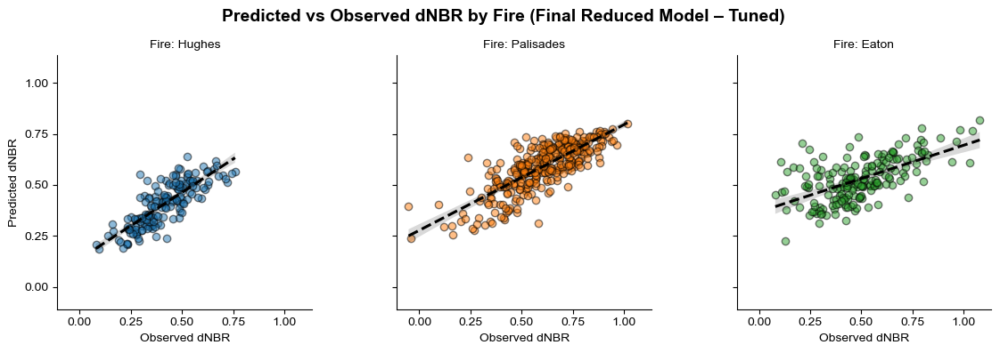

In [27]:
# ----------------------------
# Per-Fire Scatterplots
# ----------------------------

results_df = pd.DataFrame({
    "Observed": y_test_red,
    "Predicted": yte_red,
    "Fire": df.loc[X_test_red.index, "Fire"].values
})

g = sns.lmplot(
    data=results_df, x="Observed", y="Predicted",
    col="Fire", hue="Fire", col_wrap=3,
    height=4, scatter_kws=dict(alpha=0.5, edgecolor="k"),
    line_kws=dict(color="black", linestyle="--")
)

# Force equal axes and consistent ticks
for ax in g.axes.flatten():
    min_val = min(ax.get_xlim()[0], ax.get_ylim()[0])
    max_val = max(ax.get_xlim()[1], ax.get_ylim()[1])
    
    # Equal axes
    ax.set_xlim(min_val, max_val)
    ax.set_ylim(min_val, max_val)
    ax.set_aspect('equal', adjustable='box')
    
    # Consistent ticks (e.g., 0.00, 0.25, 0.50, ...)
    ax.xaxis.set_major_locator(mticker.MultipleLocator(0.25))
    ax.yaxis.set_major_locator(mticker.MultipleLocator(0.25))
    ax.xaxis.set_major_formatter(mticker.FormatStrFormatter("%.2f"))
    ax.yaxis.set_major_formatter(mticker.FormatStrFormatter("%.2f"))

g.set_titles("Fire: {col_name}")
g.set_axis_labels("Observed dNBR", "Predicted dNBR")
plt.subplots_adjust(top=0.85)
g.fig.suptitle("Predicted vs Observed dNBR by Fire (Final Reduced Model – Tuned)", 
               fontsize=14, weight="bold")
plt.show()

In [28]:
# ----------------------------
# Print Per-Fire Model Performance Stats
# ----------------------------

test_indices = X_test_red.index
fire_labels = df.loc[test_indices, "Fire"]

results_df = pd.DataFrame({
    "Observed": y_test_red,
    "Predicted": yte_red,
    "Fire": fire_labels.values
})

per_fire_stats = []
for fire, group in results_df.groupby("Fire"):
    obs = group["Observed"]
    pred = group["Predicted"]
    n = len(group)
    r2  = r2_score(obs, pred)
    mse = mean_squared_error(obs, pred)
    rmse = np.sqrt(mse)
    mae  = mean_absolute_error(obs, pred)
    
    per_fire_stats.append({
        "Fire": fire,
        "n": n,
        "R²": r2,
        "RMSE": rmse,
        "MAE": mae
    })

fire_metrics_df = pd.DataFrame(per_fire_stats).set_index("Fire").round(3)

print("\nPer-Fire Model Performance (Final Reduced Model – Tuned, Test Set Only):")
print(fire_metrics_df)


Per-Fire Model Performance (Final Reduced Model – Tuned, Test Set Only):
             n     R²   RMSE    MAE
Fire                               
Eaton      184  0.323  0.161  0.118
Hughes     166  0.656  0.078  0.060
Palisades  337  0.600  0.111  0.088


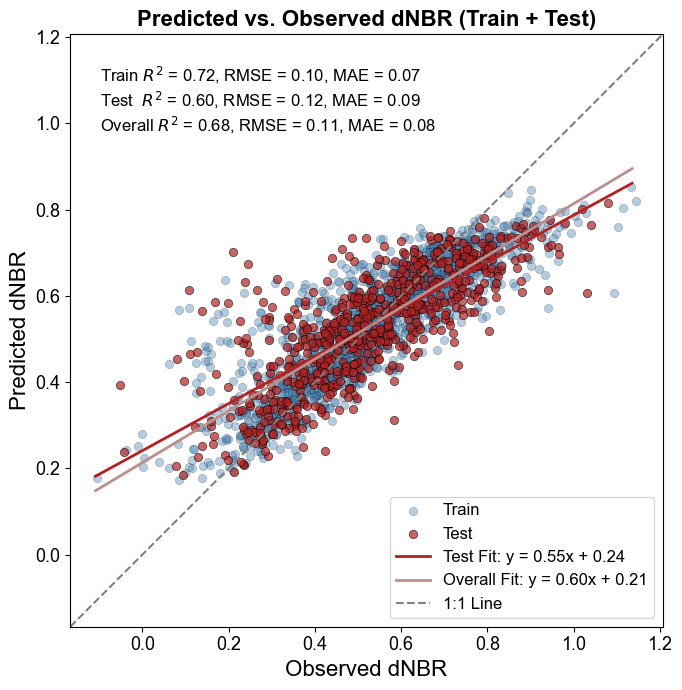

In [29]:
# ----------------------------
# Predicted vs. Observed (Train + Test + Overall)
# ----------------------------
# Set default font family to Arial
mpl.rcParams["font.family"] = "Arial"

# Metrics: Train
r2_train   = r2_score(y_train_red, ytr_red)
rmse_train = np.sqrt(mean_squared_error(y_train_red, ytr_red))
mae_train  = mean_absolute_error(y_train_red, ytr_red)

# Metrics: Test
r2_test   = r2_score(y_test_red, yte_red)
rmse_test = np.sqrt(mean_squared_error(y_test_red, yte_red))
mae_test  = mean_absolute_error(y_test_red, yte_red)

# Metrics: Overall (Train + Test together)
y_all_obs = np.concatenate([y_train_red, y_test_red])
y_all_pred = np.concatenate([ytr_red, yte_red])
r2_all   = r2_score(y_all_obs, y_all_pred)
rmse_all = np.sqrt(mean_squared_error(y_all_obs, y_all_pred))
mae_all  = mean_absolute_error(y_all_obs, y_all_pred)

# Axis limits from all data
all_vals = np.concatenate([y_all_obs, y_all_pred])
buffer = (all_vals.max() - all_vals.min()) * 0.05
min_val, max_val = all_vals.min() - buffer, all_vals.max() + buffer

# Fit regression line (test set only)
slope_test, intercept_test = np.polyfit(y_test_red, yte_red, 1)
y_fit_test = slope_test * x_fit + intercept_test

# Fit regression line (all data)
slope_all, intercept_all = np.polyfit(y_all_obs, y_all_pred, 1)
y_fit_all = slope_all * x_fit + intercept_all

# Plot
plt.figure(figsize=(7, 7))
plt.scatter(y_train_red, ytr_red, alpha=0.4, edgecolor='k',
            linewidth=0.3, color="steelblue", label="Train")
plt.scatter(y_test_red, yte_red, alpha=0.7, edgecolor='k',
            linewidth=0.5, color="firebrick", label="Test")

# Add regression lines
plt.plot(x_fit, y_fit_test, color='firebrick', linewidth=2,
         label=f'Test Fit: y = {slope_test:.2f}x + {intercept_test:.2f}')
plt.plot(x_fit, y_fit_all, color='rosybrown', linewidth=2, linestyle='-',
         label=f'Overall Fit: y = {slope_all:.2f}x + {intercept_all:.2f}')

# 1:1 reference line
plt.axline((0, 0), slope=1, linestyle='--', color='grey',
           linewidth=1.5, label="1:1 Line")

# Labels and limits
plt.xlabel("Observed dNBR", fontsize=16)
plt.ylabel("Predicted dNBR", fontsize=16)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.title("Predicted vs. Observed dNBR (Train + Test)", fontsize=16, fontweight="bold")
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)
plt.gca().set_aspect('equal', adjustable='box')

# Annotated metrics
plt.text(0.05, 0.95,
         f"Train $R^2$ = {r2_train:.2f}, RMSE = {rmse_train:.2f}, MAE = {mae_train:.2f}\n"
         f"Test  $R^2$ = {r2_test:.2f}, RMSE = {rmse_test:.2f}, MAE = {mae_test:.2f}\n"
         f"Overall $R^2$ = {r2_all:.2f}, RMSE = {rmse_all:.2f}, MAE = {mae_all:.2f}",
         transform=plt.gca().transAxes,
         fontsize=12, verticalalignment='top',
         bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

plt.legend(fontsize=12, loc="lower right")
plt.tight_layout()
plt.savefig("/Users/megan/Desktop/figures-rfr-lafires/pred_vs_obs_train_test_overall_2.png",
            dpi=300, bbox_inches="tight", facecolor="white")
plt.show()


## Figure 3

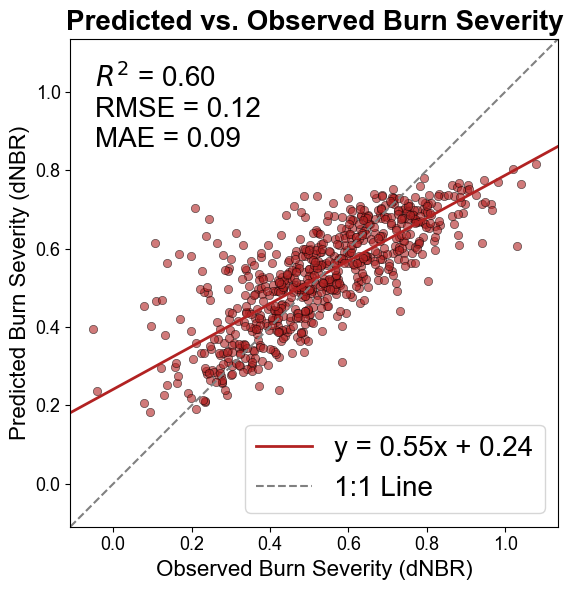

In [30]:
# ----------------------------
# Predicted vs. Observed with Regression Fit and Metrics
# ----------------------------

# Axis limits
all_vals = np.concatenate([y_test_red, yte_red])
buffer = (all_vals.max() - all_vals.min()) * 0.05
min_val, max_val = all_vals.min() - buffer, all_vals.max() + buffer

# Fit regression line
slope, intercept = np.polyfit(y_test_red, yte_red, 1)
x_fit = np.linspace(min_val, max_val, 100)
y_fit = slope * x_fit + intercept

# Metrics
r2_val   = r2_score(y_test_red, yte_red)
rmse_val = np.sqrt(mean_squared_error(y_test_red, yte_red))
mae_val  = mean_absolute_error(y_test_red, yte_red)

# Plot
plt.figure(figsize=(6, 6))
plt.scatter(y_test_red, yte_red, alpha=0.6,
            edgecolor='k', linewidth=0.5, color="firebrick")
plt.plot(x_fit, y_fit, color='firebrick', linewidth=2,
         label=f'y = {slope:.2f}x + {intercept:.2f}')
plt.axline((0, 0), slope=1, linestyle='--', color='grey',
           linewidth=1.5, label="1:1 Line")

# Labels and limits
plt.xlabel("Observed Burn Severity (dNBR)", fontsize=16)
plt.ylabel("Predicted Burn Severity (dNBR)", fontsize=16)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.title("Predicted vs. Observed Burn Severity", fontsize=20, fontweight="bold")
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)
plt.gca().set_aspect('equal', adjustable='box')

# Annotated metrics
plt.text(0.05, 0.95,
         f"$R^2$ = {r2_val:.2f}\nRMSE = {rmse_val:.2f}\nMAE = {mae_val:.2f}",
         transform=plt.gca().transAxes,
         fontsize=20, verticalalignment='top',
         bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

plt.legend(fontsize=20, loc="lower right")
plt.tight_layout()
plt.savefig("/Users/megan/Desktop/figures-rfr-lafires/Figure3_pred_vs_obs-testset.png",
            dpi=300, bbox_inches="tight", facecolor="white")
plt.show()

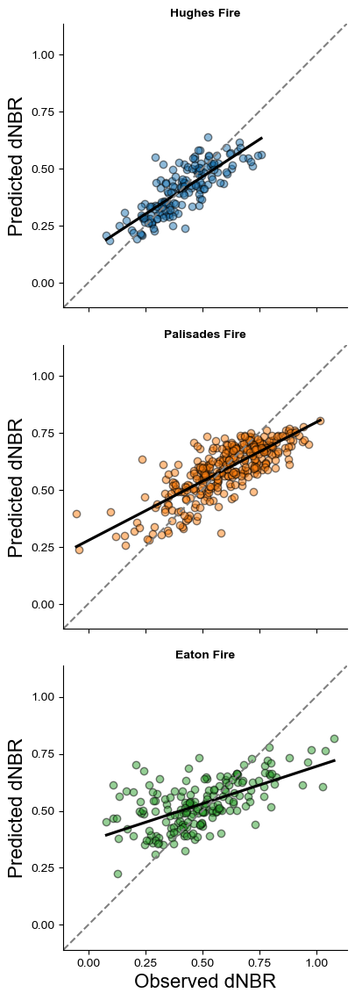

In [31]:
# ----------------------------
# Per-Fire Scatterplots (stacked vertically)
# ----------------------------

results_df = pd.DataFrame({
    "Observed": y_test_red,
    "Predicted": yte_red,
    "Fire": df.loc[X_test_red.index, "Fire"].values
})

g = sns.lmplot(
    data=results_df, x="Observed", y="Predicted",
    row="Fire", hue="Fire",
    ci=None,
    height=4, aspect=1,
    scatter_kws=dict(alpha=0.5, edgecolor="k"),
    line_kws=dict(color="black")  # regression line
)

for ax in g.axes.flatten():
    min_val = min(ax.get_xlim()[0], ax.get_ylim()[0])
    max_val = max(ax.get_xlim()[1], ax.get_ylim()[1])
    ax.set_xlim(min_val, max_val)
    ax.set_ylim(min_val, max_val)
    ax.set_aspect('equal', adjustable='box')
    
    # add 1:1 line
    ax.axline((0, 0), slope=1, linestyle="--", color="grey", linewidth=1.5)
    
    ax.xaxis.set_major_locator(mticker.MultipleLocator(0.25))
    ax.yaxis.set_major_locator(mticker.MultipleLocator(0.25))
    ax.xaxis.set_major_formatter(mticker.FormatStrFormatter("%.2f"))
    ax.yaxis.set_major_formatter(mticker.FormatStrFormatter("%.2f"))

g.set_titles("{row_name} Fire", fontsize=40, weight="bold")  

g.set_axis_labels("Observed dNBR", "Predicted dNBR", fontsize=16)

plt.subplots_adjust(top=0.93)
#g.fig.suptitle("Predicted vs Observed dNBR by Fire", 
           #    fontsize=14, weight="bold")

plt.savefig("/Users/megan/Desktop/figures-rfr-lafires/Figure3_perfire_scatterplot_reduced.png",
            dpi=300, bbox_inches="tight", facecolor="white")
plt.show()


## Figure 6

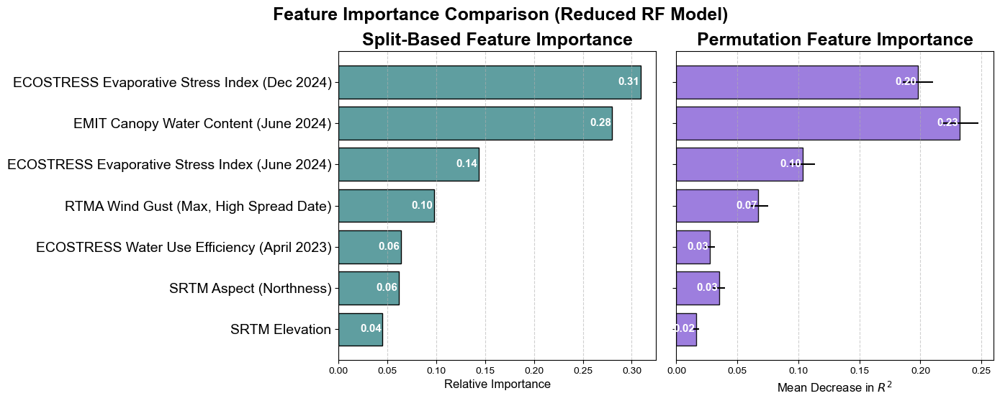

In [33]:
# -------------------------------------------
# Two-Panel Bar Plot: Feature Importances (Top = Most Important)
# -------------------------------------------
mpl.rcParams["font.family"] = "Arial"

# Split-based (Gini) importance
gini = rf_reduced_tuned.feature_importances_

# Sort indices by descending importance
idx_desc = np.argsort(gini)[::-1]

# For plotting: use ascending order so largest ends up at the TOP row
idx_plot = idx_desc[::-1]

features_desc = [X_train_red.columns[i] for i in idx_desc]
features_plot  = [X_train_red.columns[i] for i in idx_plot]

gini_desc = gini[idx_desc]
gini_plot = gini[idx_plot]

# Rename for display
feature_rename = {
    "CWC_20240625": "EMIT Canopy Water Content (June 2024)",
    "ESI_20241201_1049am": "ECOSTRESS Evaporative Stress Index (Dec 2024)",
    "ESI_20240625_1038am": "ECOSTRESS Evaporative Stress Index (June 2024)",
    "WUE_20230409_1028am": "ECOSTRESS Water Use Efficiency (April 2023)",
    "WindGust_max_20250108": "RTMA Wind Gust (Max, High Spread Date)",
    "Elevation": "SRTM Elevation",
    "cosAspect": "SRTM Aspect (Northness)"
}
labels_plot = [feature_rename.get(f, f) for f in features_plot]

# Permutation importance (test set)
perm = permutation_importance(
    rf_reduced_tuned, X_test_red, y_test_red,
    n_repeats=30, random_state=42, n_jobs=-1, scoring="r2"
)
perm_df = pd.DataFrame({
    "Feature": X_test_red.columns,
    "Mean": perm.importances_mean,
    "STD": perm.importances_std
}).set_index("Feature")

# Reorder permutation to match plotting order
perm_mean_plot = perm_df.loc[features_plot, "Mean"].values
perm_std_plot  = perm_df.loc[features_plot, "STD"].values

# ---- Plot
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# Panel 1: Gini (split-based)
ax0 = axes[0]
bars0 = ax0.barh(labels_plot, gini_plot, color="cadetblue", edgecolor="black")
ax0.set_title("Split-Based Feature Importance", fontsize=18, fontweight="bold")
ax0.set_xlabel("Relative Importance", fontsize=12)
ax0.grid(axis="x", linestyle="--", alpha=0.6)

# Annotate (white text on bars)
for b in bars0:
    w = b.get_width()
    y = b.get_y() + b.get_height()/2
    ax0.text(w - 0.001, y, f"{w:.2f}", va="center", ha="right",
             color="white", fontsize=11, weight="bold")

# Panel 2: Permutation
ax1 = axes[1]
bars1 = ax1.barh(labels_plot, perm_mean_plot, xerr=perm_std_plot,
                 color="mediumpurple", edgecolor="black", alpha=0.9)
ax1.set_title("Permutation Feature Importance", fontsize=18, fontweight="bold")
ax1.set_xlabel("Mean Decrease in $R^2$", fontsize=12)
ax1.grid(axis="x", linestyle="--", alpha=0.6)

# Loop
for ax in [ax0, ax1]:
    ax.tick_params(axis="y", labelsize=14)

# Annotate second panel
for b in bars1:
    w = b.get_width()
    y = b.get_y() + b.get_height()/2
    if w >= 0:
        ax1.text(w - 0.001, y, f"{w:.2f}", va="center", ha="right",
                 color="white", fontsize=11, weight="bold")
    else:
        ax1.text(w + 0.001, y, f"{w:.2f}", va="center", ha="left",
                 color="white", fontsize=11, weight="bold")

plt.suptitle("Feature Importance Comparison (Reduced RF Model)", fontsize=18, weight="bold", y=0.92)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig("/Users/megan/Desktop/figures-rfr-lafires/Figure6_feature_importances_two_panel.png",
            dpi=300, bbox_inches="tight", facecolor="white")
plt.show()

# NLCD Class Evaluation

In [34]:
# Count pixels per NLCD class
class_counts = df_full_scaled["NLCD_Class"].value_counts().sort_index()

print("\nNumber of pixels per NLCD class:")
for cls, count in class_counts.items():
    print(f"{cls:25s} {count:,}")


Number of pixels per NLCD class:
Emergent Herbaceous Wetlands 23
Evergreen Forest          4,653
Grassland/Herbaceous      839
Mixed Forest              9,033
Pasture/Hay               3
Shrub/Scrub               33,347
Woody Wetlands            352


## Figure S1

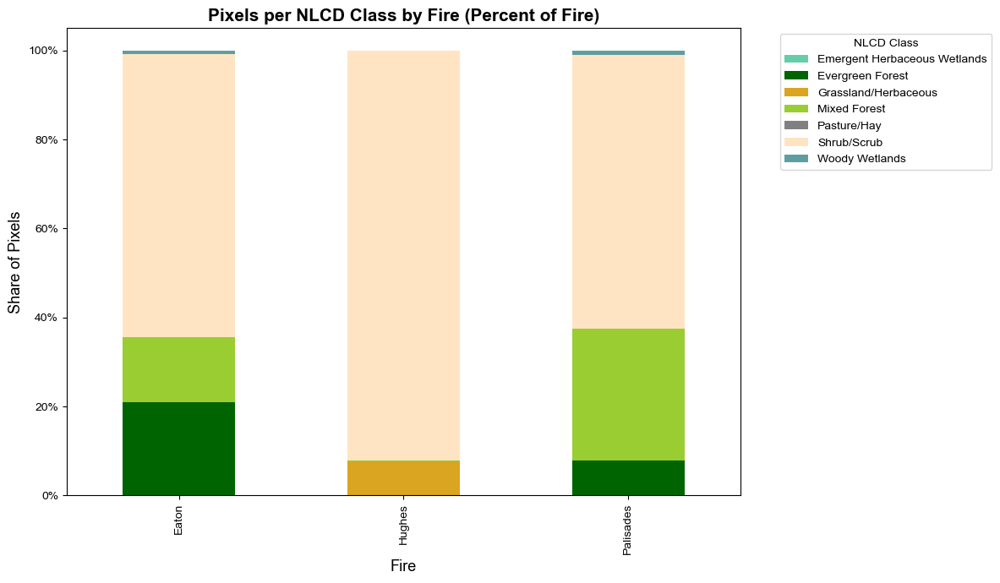

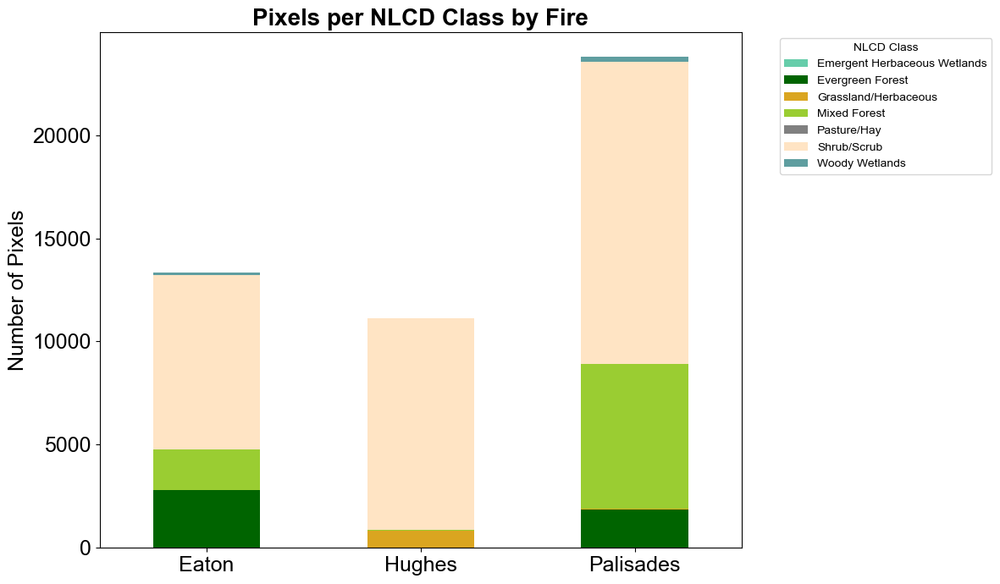

In [36]:
# -------------------------------------------
# Stacked bar chart of NLCD pixel percent per fire
# -------------------------------------------

custom_colors = {
    "Shrub/Scrub": "bisque",
    "Mixed Forest": "yellowgreen",
    "Evergreen Forest": "darkgreen",
    "Grassland/Herbaceous": "goldenrod",
    "Woody Wetlands": "cadetblue",
    "Emergent Herbaceous Wetlands": "mediumaquamarine"
}

# Count pixels per Fire × NLCD class
nlcd_counts = (
    df_full.groupby(["Fire", "NLCD_Class"])
    .size()
    .reset_index(name="n_pixels")
)

# Convert counts to shares per fire
nlcd_counts["share"] = nlcd_counts.groupby("Fire")["n_pixels"].transform(
    lambda x: x / x.sum()
)

# Pivot to wide format for plotting
nlcd_share_wide = nlcd_counts.pivot(
    index="Fire", columns="NLCD_Class", values="share"
).fillna(0)

# Assign colors *after* nlcd_share_wide exists
colors = [custom_colors.get(cls, "grey") for cls in nlcd_share_wide.columns]

# Plot stacked bar chart
nlcd_share_wide.plot(
    kind="bar", stacked=True, figsize=(12, 7),
    color=colors
)

plt.ylabel("Share of Pixels", fontsize=13)
plt.xlabel("Fire", fontsize=13)
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
plt.title("Pixels per NLCD Class by Fire (Percent of Fire)", fontsize=15, weight="bold")
plt.legend(title="NLCD Class", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.savefig("/Users/megan/Desktop/figures-rfr-lafires/NLCDpercentperfire.png",
            dpi=300, bbox_inches="tight", facecolor="white")
plt.show()


# -------------------------------------------
# Stacked bar chart of NLCD pixel count per fire
# -------------------------------------------


# Count pixels per Fire × NLCD class
nlcd_counts = (
    df_full.groupby(["Fire", "NLCD_Class"])
    .size()
    .reset_index(name="n_pixels")
)

# Convert counts to shares per fire
nlcd_counts["share"] = nlcd_counts.groupby("Fire")["n_pixels"].transform(
    lambda x: x / x.sum()
)

# Pivot to wide format for plotting
nlcd_share_wide = nlcd_counts.pivot(
    index="Fire", columns="NLCD_Class", values="n_pixels"
).fillna(0)

# Plot stacked bar chart
nlcd_share_wide.plot(
    kind="bar", stacked=True, figsize=(12, 7),
    color=colors
)

plt.xlabel("")
plt.xticks(rotation=0, fontsize=18) # Keep fire names horizontal
plt.ylabel("Number of Pixels", fontsize=18)
plt.yticks(fontsize=18)
plt.title("Pixels per NLCD Class by Fire", fontsize=20, weight="bold")
plt.legend(title="NLCD Class", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.savefig("/Users/megan/Desktop/figures-rfr-lafires/FigureS1_NLCDcountperfire.png",
            dpi=300, bbox_inches="tight", facecolor="white")
plt.show()

In [37]:
# -------------------------------------------
# Evaluate model performance per NLCD class
# -------------------------------------------
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

results = []

for lc_code, group in df_full_scaled.groupby("NLCD"):
    lc_name = nlcd_classes.get(lc_code, str(lc_code))
    n = len(group)
    if n < 50:   # skip very small classes
        continue

    y_true = group["dNBR"].values
    y_pred = group["Predicted_dNBR"].values

    r2   = r2_score(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae  = mean_absolute_error(y_true, y_pred)

    results.append({
        "NLCD": lc_code,
        "Class": lc_name,
        "n": n,
        "R²": r2,
        "RMSE": rmse,
        "MAE": mae
    })

# Convert to DataFrame for viewing
df_nlcd_perf = pd.DataFrame(results).sort_values("n", ascending=False)

print("\nModel performance by NLCD class:")
print(df_nlcd_perf.to_string(index=False))

# -------------------------------------------
# Evaluate model performance per NLCD class (TEST SET ONLY)
# -------------------------------------------

# Rebuild a test DataFrame with predictions and NLCD info
test_idx = X_test.index
df_test = df.loc[test_idx].copy()   # unscaled df has NLCD + coords
df_test["dNBR"] = y_test.values
df_test["Predicted_dNBR"] = y_pred_test  # from model.predict(X_test)

results_test = []

for lc_code, group in df_test.groupby("NLCD"):
    lc_name = nlcd_classes.get(lc_code, str(lc_code))
    n = len(group)
    if n < 10:   # skip very small classes
        continue

    y_true = group["dNBR"].values
    y_pred = group["Predicted_dNBR"].values

    r2   = r2_score(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae  = mean_absolute_error(y_true, y_pred)

    results_test.append({
        "NLCD": lc_code,
        "Class": lc_name,
        "n": n,
        "R²": r2,
        "RMSE": rmse,
        "MAE": mae
    })

df_nlcd_perf_test = pd.DataFrame(results_test).sort_values("n", ascending=False)

print("\nTest-set performance by NLCD class:")
print(df_nlcd_perf_test.to_string(index=False))


Model performance by NLCD class:
 NLCD                Class     n       R²     RMSE      MAE
   52          Shrub/Scrub 33347 0.668323 0.090336 0.067681
   43         Mixed Forest  9033 0.325277 0.119267 0.093365
   42     Evergreen Forest  4653 0.314652 0.209212 0.167640
   71 Grassland/Herbaceous   839 0.585281 0.068354 0.049830
   90       Woody Wetlands   352 0.392758 0.144235 0.110120

Test-set performance by NLCD class:
 NLCD                Class   n       R²     RMSE      MAE
   52          Shrub/Scrub 498 0.583284 0.100927 0.074202
   43         Mixed Forest 110 0.317168 0.128452 0.104404
   42     Evergreen Forest  62 0.261690 0.221881 0.181208
   71 Grassland/Herbaceous  10 0.097591 0.131969 0.090477


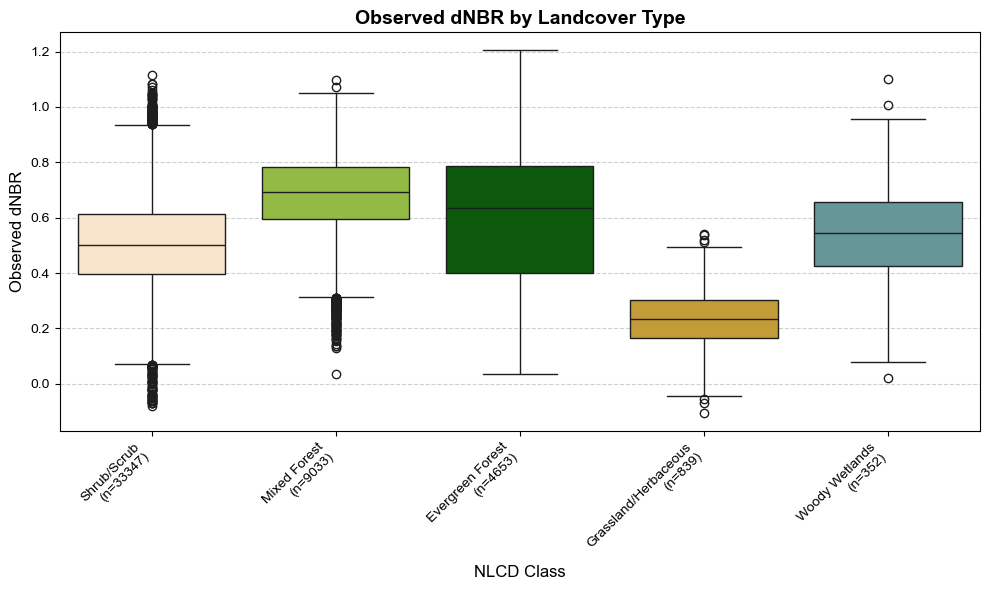

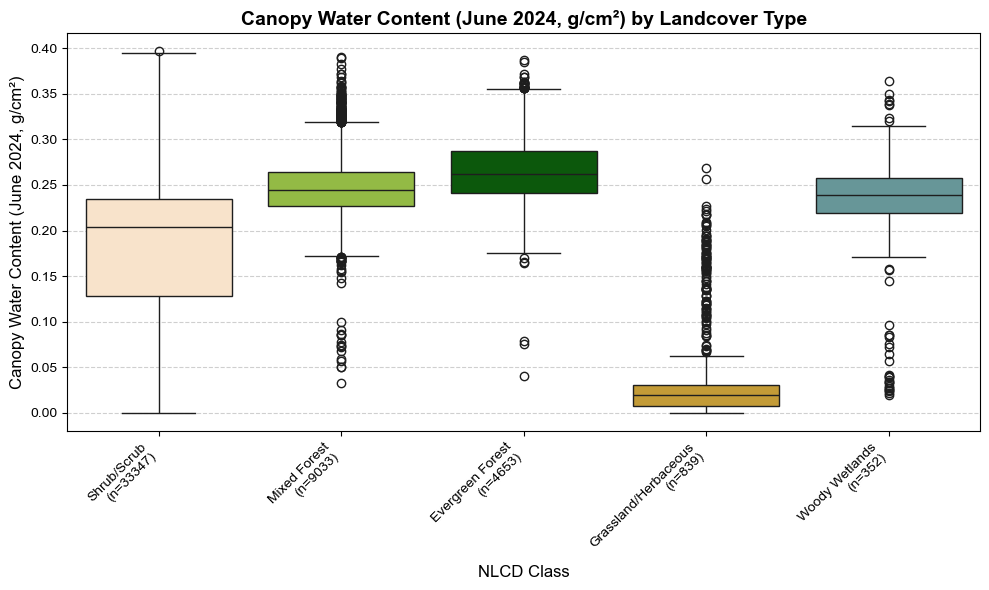

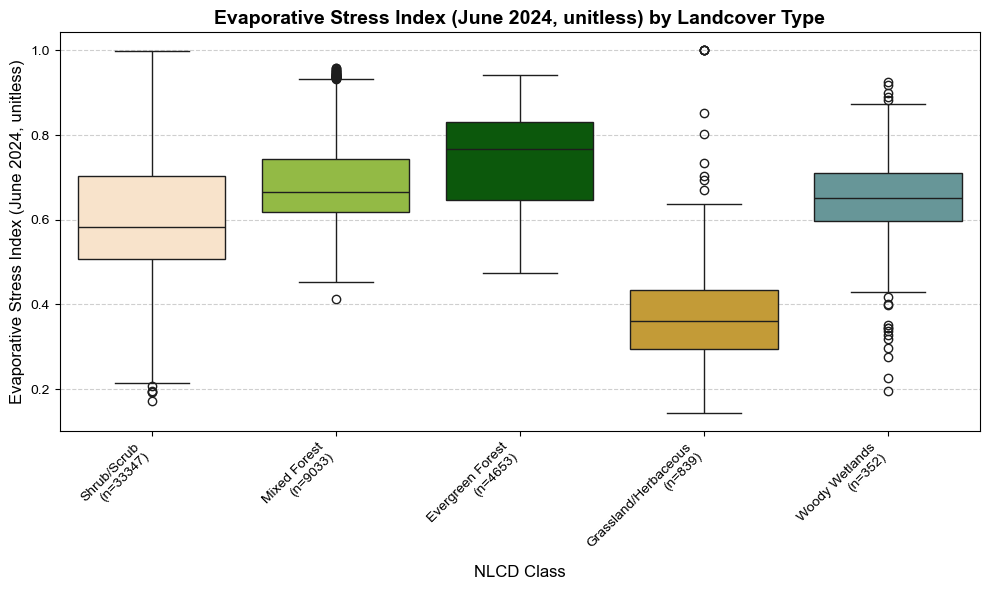

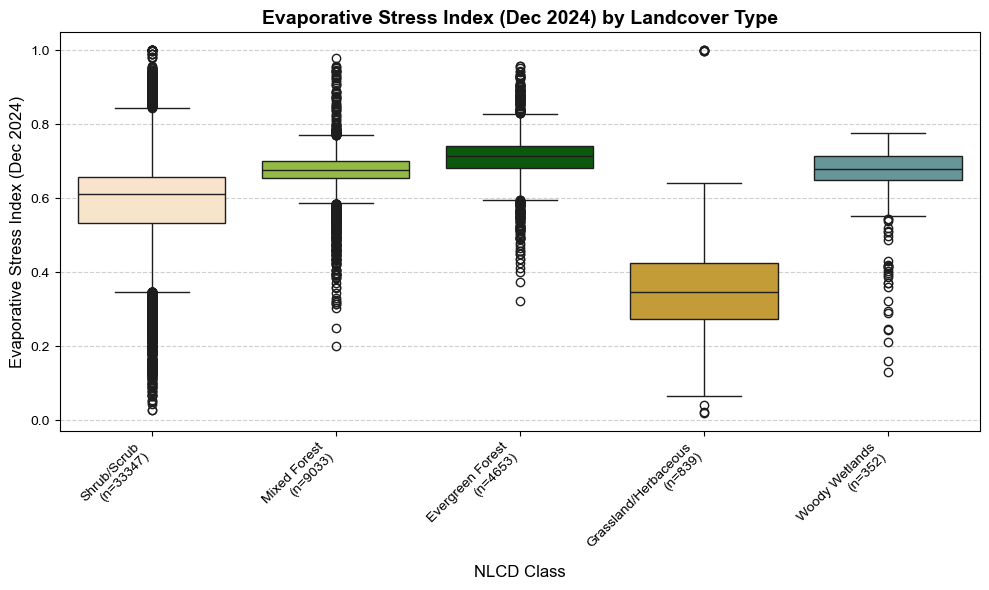

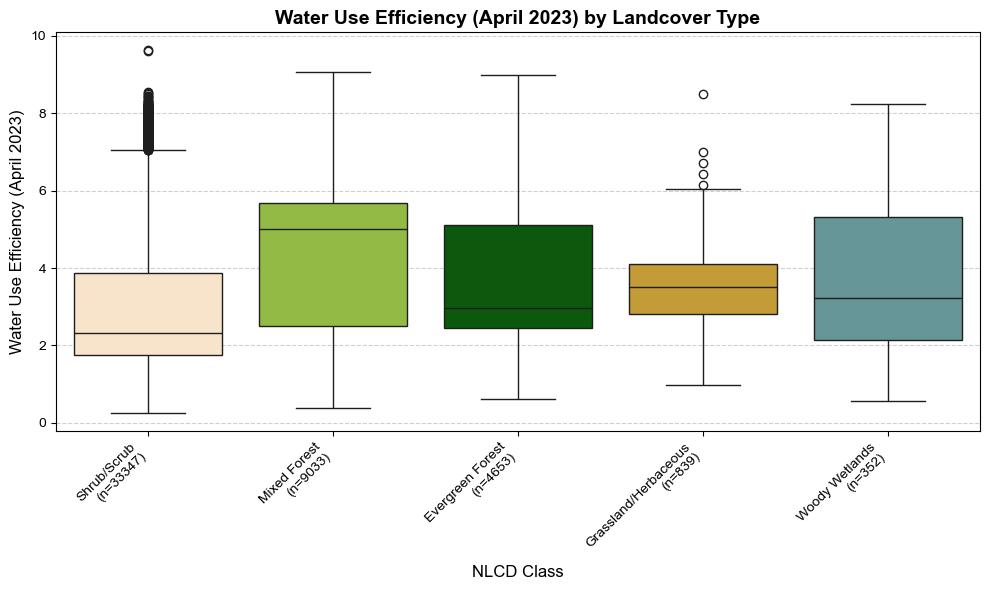

In [41]:
# -------------------------------------------
# Plot variables by landcover (NLCD class)
# -------------------------------------------

# Define fixed NLCD color mapping
nlcd_palette = {
    "Shrub/Scrub": "bisque",
    "Mixed Forest": "yellowgreen",
    "Evergreen Forest": "darkgreen",
    "Grassland/Herbaceous": "goldenrod",
    "Woody Wetlands": "cadetblue",
    "Emergent Herbaceous Wetlands": "mediumaquamarine"
}

# Unscale predictors for boxplots

# Make a copy so we don’t overwrite df_full_scaled
df_unscaled = df_full_scaled.copy()

# Apply inverse transform to predictors
X_unscaled = scaler.inverse_transform(df_unscaled[continuous_vars])

# Put unscaled values back into the dataframe
df_unscaled[continuous_vars] = X_unscaled

# Map NLCD codes to names
df_unscaled["NLCD_Class"] = df_unscaled["NLCD"].map(nlcd_classes)

# Count pixels per class
class_counts = df_unscaled["NLCD_Class"].value_counts()

# Keep only classes with >=100 pixels
valid_classes = class_counts[class_counts >= 100].index
df_unscaled = df_unscaled[df_unscaled["NLCD_Class"].isin(valid_classes)]

# Relabel x-axis ticks with counts
class_labels = [f"{cls}\n(n={class_counts[cls]})" for cls in valid_classes]

# Variables of interest
vars_to_plot = {
    "dNBR": "Observed dNBR",
    "CWC_20240625": "Canopy Water Content (June 2024, g/cm²)",
    "ESI_20240625_1038am": "Evaporative Stress Index (June 2024, unitless)",
    "ESI_20241201_1049am": "Evaporative Stress Index (Dec 2024)",
    "WUE_20230409_1028am": "Water Use Efficiency (April 2023)"
}

# Output directory
outdir = "/Users/megan/Desktop/figures-rfr-lafires"
os.makedirs(outdir, exist_ok=True)

# Plot and save
for var, label in vars_to_plot.items():
    plt.figure(figsize=(10, 6))
    sns.boxplot(
        data=df_unscaled,
        x="NLCD_Class", y=var,
        order=valid_classes,
        palette=nlcd_palette
    )
    
    plt.title(f"{label} by Landcover Type", fontsize=14, fontweight="bold")
    plt.xlabel("NLCD Class", fontsize=12)
    plt.ylabel(label, fontsize=12)
    plt.xticks(
        ticks=range(len(valid_classes)),
        labels=class_labels,
        rotation=45, ha="right"
    )
    plt.grid(axis="y", linestyle="--", alpha=0.6)
    plt.tight_layout()
    
    # Save each variable plot as PNG
    outfile = os.path.join(outdir, f"{var}_by_landcover.png")
    plt.savefig(outfile, dpi=300, bbox_inches="tight", facecolor="white")
    
    plt.show()
    plt.close()

## Figure S2

/var/folders/br/pyt6szbd2wb4q6n5wqkffrbc0000gn/T/ipykernel_22412/2422890282.py:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[-1].set_xticklabels(class_labels, rotation=45, ha="right")


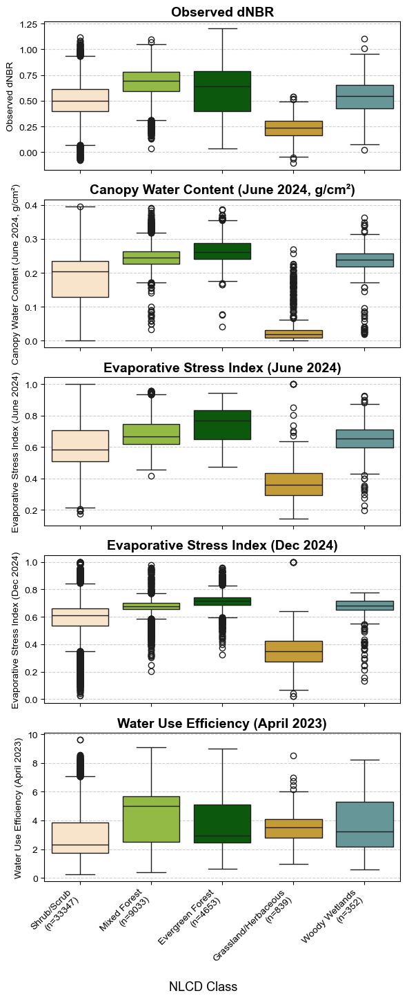

In [42]:
import os

# Variables of interest
vars_to_plot = {
    "dNBR": "Observed dNBR",
    "CWC_20240625": "Canopy Water Content (June 2024, g/cm²)",
    "ESI_20240625_1038am": "Evaporative Stress Index (June 2024)",
    "ESI_20241201_1049am": "Evaporative Stress Index (Dec 2024)",
    "WUE_20230409_1028am": "Water Use Efficiency (April 2023)"
}

# Set up stacked figure: one row per variable
n_vars = len(vars_to_plot)
fig, axes = plt.subplots(
    n_vars, 1, figsize=(6, 3 * n_vars), sharex=True
)

# Loop through each variable and subplot
for ax, (var, label) in zip(axes, vars_to_plot.items()):
    sns.boxplot(
        data=df_unscaled,
        x="NLCD_Class", y=var,
        order=valid_classes,
        palette=nlcd_palette,
        ax=ax
    )
    ax.set_title(label, fontsize=14, fontweight="bold")
    ax.set_xlabel("")
    ax.set_ylabel(label, fontsize=10)
    ax.grid(axis="y", linestyle="--", alpha=0.6)
    ax.tick_params(axis="x", rotation=45)

# Add shared x-axis label at the bottom
fig.text(0.5, 0.04, "NLCD Class", ha="center", fontsize=13)

# Relabel xticks with counts (only once, at bottom axis)
axes[-1].set_xticklabels(class_labels, rotation=45, ha="right")

plt.tight_layout(rect=[0, 0.05, 1, 1])
plt.savefig(
    os.path.join(outdir, "/Users/megan/Desktop/figures-rfr-lafires/FigureS2_all_variables_by_landcover_stackedfig.png"),
    dpi=300, bbox_inches="tight", facecolor="white"
)
plt.show()

# Partial Dependence Plots

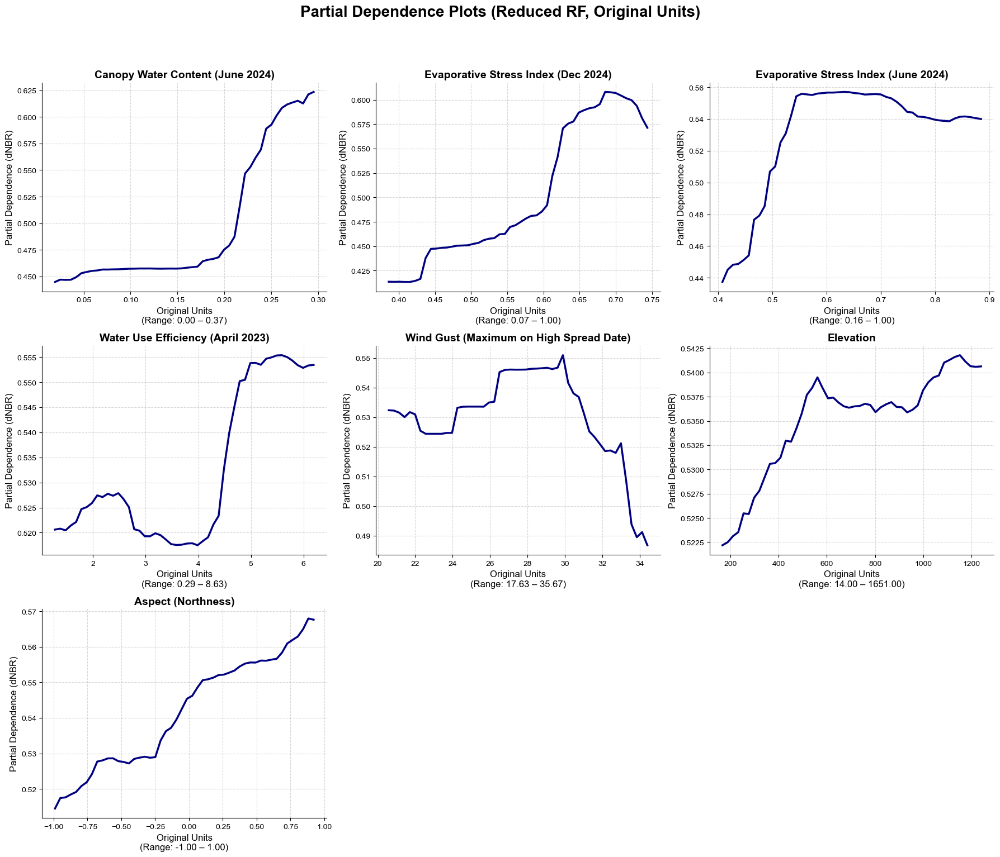

In [43]:
# ============================================================
# Partial Dependence Plots (Reduced Model, Original Units)
# ============================================================
"""
Partial dependence plots (PDPs) showing the marginal effect of each reduced predictor on predicted 
burn severity (dNBR). Curves are derived from the tuned Random Forest model fit to the training data, 
with predictor ranges shown in original measurement units.
"""
# List of reduced predictors
selected_features_red = [
    'CWC_20240625',
    'ESI_20241201_1049am',
    'ESI_20240625_1038am',
    'WUE_20230409_1028am',
    'WindGust_max_20250108',
    'Elevation',
    'cosAspect'
]

# Mapping to rename for display
feature_rename = {
    "CWC_20240625": "Canopy Water Content (June 2024)",
    "ESI_20241201_1049am": "Evaporative Stress Index (Dec 2024)",
    "ESI_20240625_1038am": "Evaporative Stress Index (June 2024)",
    "WUE_20230409_1028am": "Water Use Efficiency (April 2023)",
    "WindGust_max_20250108": "Wind Gust (Maximum on High Spread Date)",
    "Elevation": "Elevation",
    "cosAspect": "Aspect (Northness)"
}


# Create mapping from feature name to index in full feature list
scaler_feature_index = {var: idx for idx, var in enumerate(continuous_vars)}

# Set up figure grid
n_features = len(selected_features_red)
n_cols = 3
n_rows = int(np.ceil(n_features / n_cols))
fig, axs = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
axs = axs.flatten()

for i, feature in enumerate(selected_features_red):
    # ----------------------------
    # Compute PDP in scaled space
    # ----------------------------
    pd_result = partial_dependence(
        estimator=rf_reduced_tuned,     # use tuned reduced model
        X=X_train_red,
        features=[i],                  # index in reduced feature list
        grid_resolution=50,
        kind="average"
    )

    grid_scaled = pd_result["grid_values"][0].reshape(-1, 1)

    # Dummy array for inverse transform (matches full feature space)
    dummy_input = np.zeros((len(grid_scaled), len(continuous_vars)))
    full_index = scaler_feature_index[feature]
    dummy_input[:, full_index] = grid_scaled.flatten()

    # Inverse transform → back to original units
    grid_unscaled = scaler.inverse_transform(dummy_input)[:, full_index]

    # ----------------------------
    # Get observed range in training data (original units)
    # ----------------------------
    dummy_train = np.zeros((len(X_train_red), len(continuous_vars)))
    for j, feat in enumerate(selected_features_red):
        full_idx = scaler_feature_index[feat]
        dummy_train[:, full_idx] = X_train_red.iloc[:, j]
    train_vals = scaler.inverse_transform(dummy_train)[:, full_index]
    val_min, val_max = train_vals.min(), train_vals.max()

    # ----------------------------
    # Plot PDP
    # ----------------------------
    ax = axs[i]
    ax.plot(grid_unscaled, pd_result["average"][0],
            color="navy", linewidth=2.5)

    ax.set_title(feature_rename.get(feature, feature),
                 fontsize=14, fontweight="bold")
    ax.set_xlabel(f"Original Units\n(Range: {val_min:.2f} – {val_max:.2f})",
                  fontsize=12)
    ax.set_ylabel("Partial Dependence (dNBR)", fontsize=12)
    ax.tick_params(axis='both', labelsize=10)
    ax.grid(True, linestyle="--", alpha=0.5)

    # Style: remove top/right borders
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

# ----------------------------
# Global figure settings
# ----------------------------
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])  # remove unused subplots

plt.suptitle("Partial Dependence Plots (Reduced RF, Original Units)",
             fontsize=20, fontweight="bold", y=1.02)
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()



Plotting Reduced PDPs for: Evergreen Forest (n=4653)


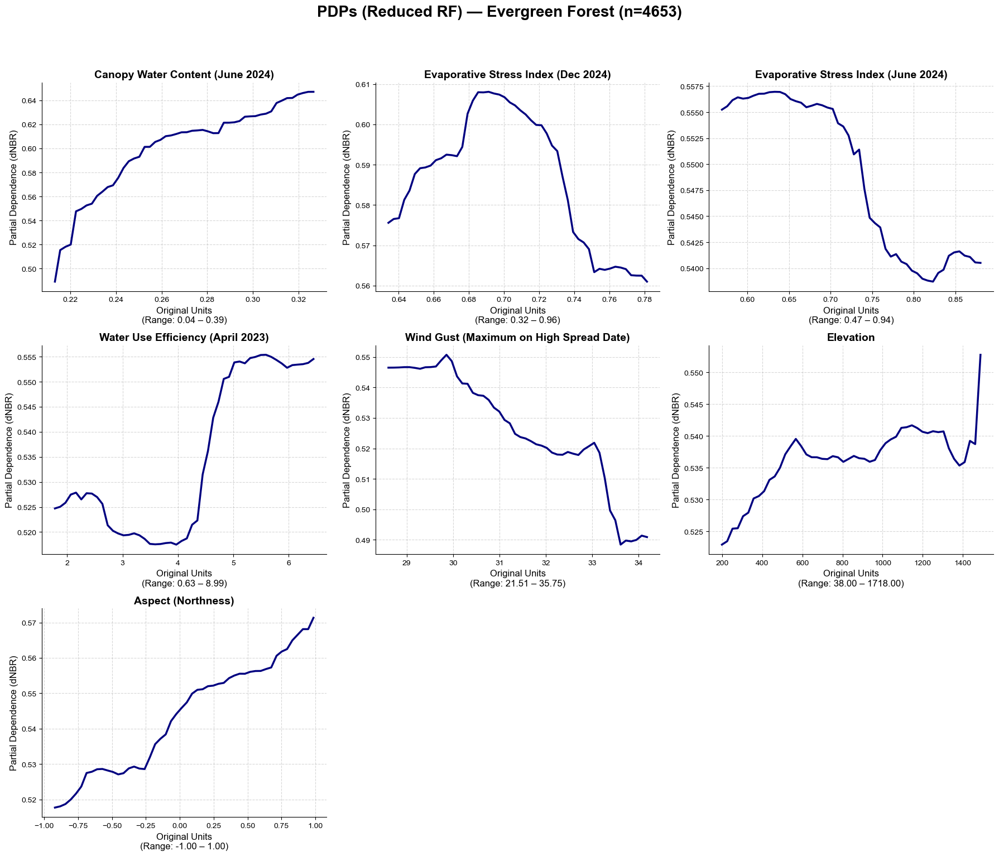


Plotting Reduced PDPs for: Mixed Forest (n=9033)


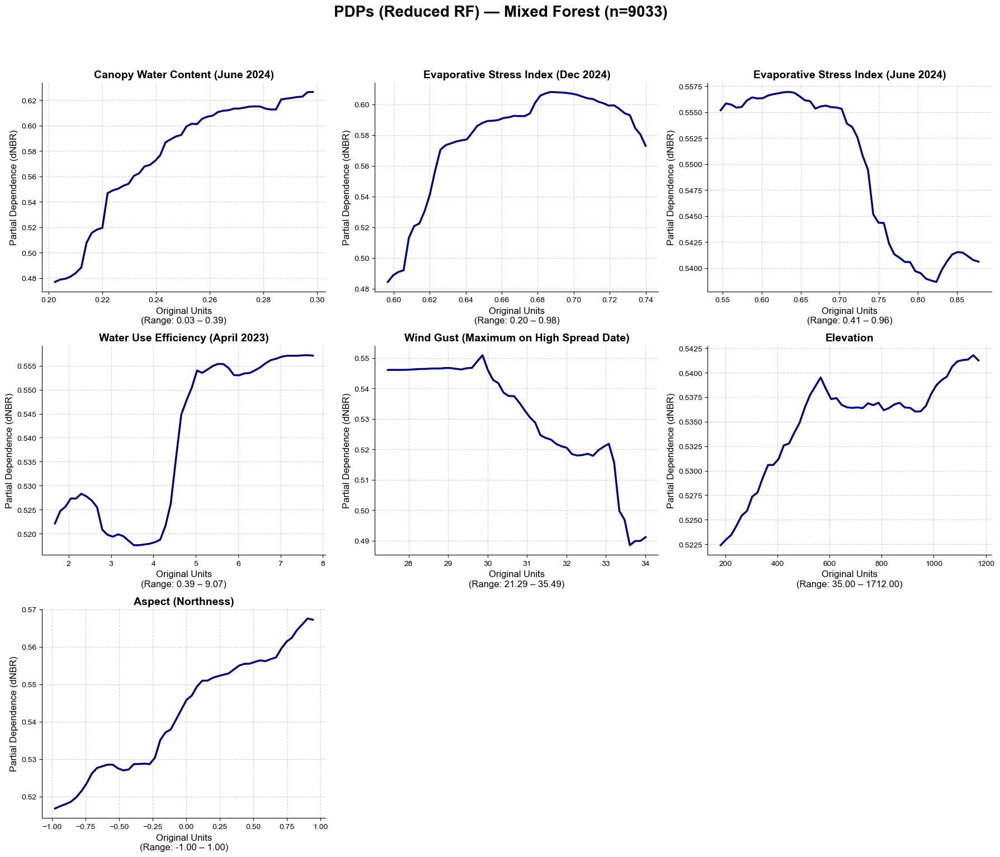


Plotting Reduced PDPs for: Shrub/Scrub (n=33347)


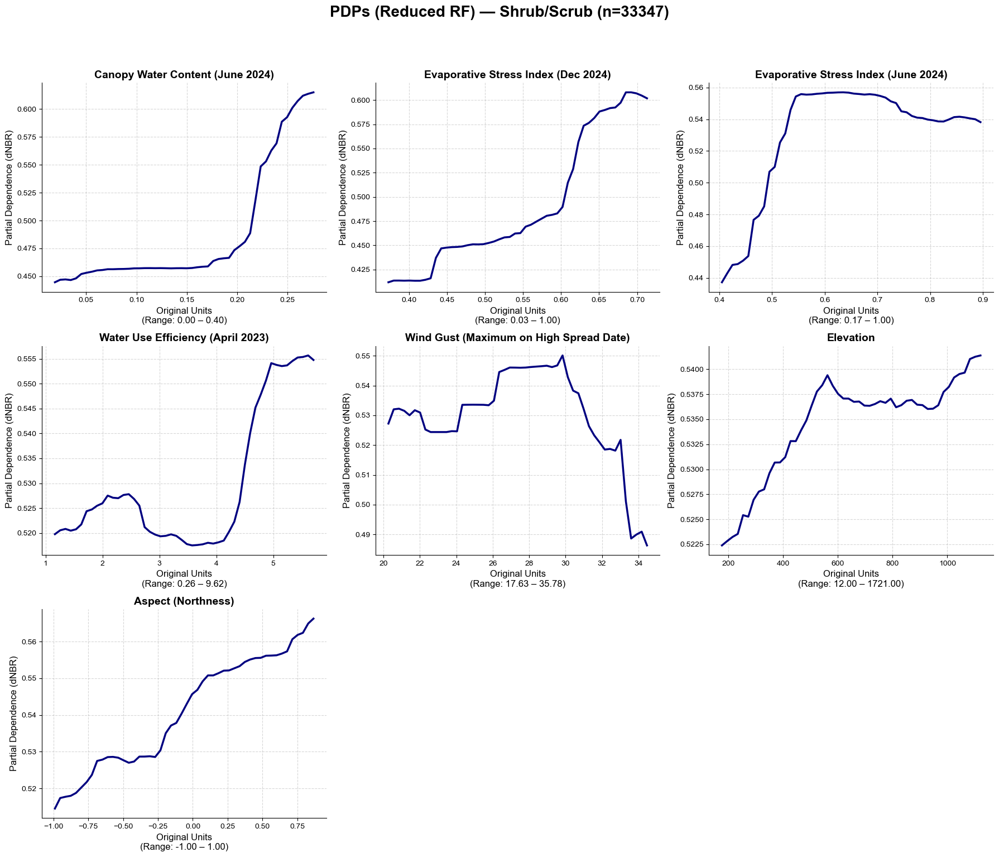


Plotting Reduced PDPs for: Grassland/Herbaceous (n=839)


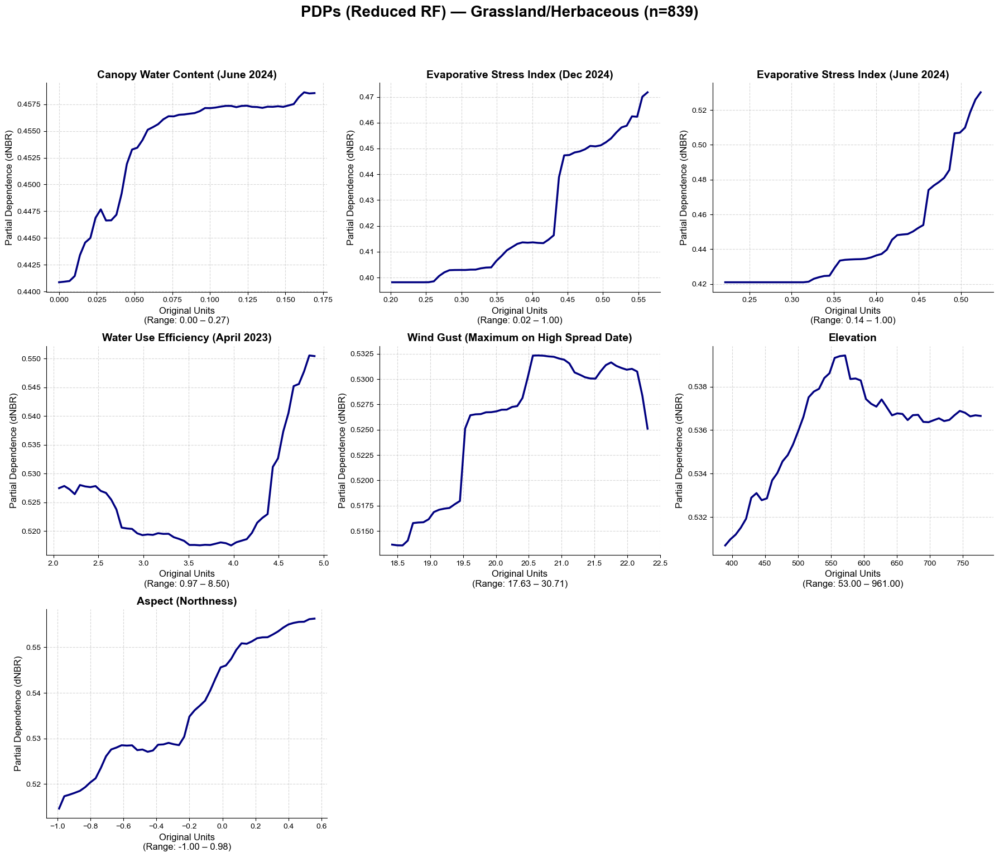

Skipping Pasture/Hay (n=3) — too few samples

Plotting Reduced PDPs for: Woody Wetlands (n=352)


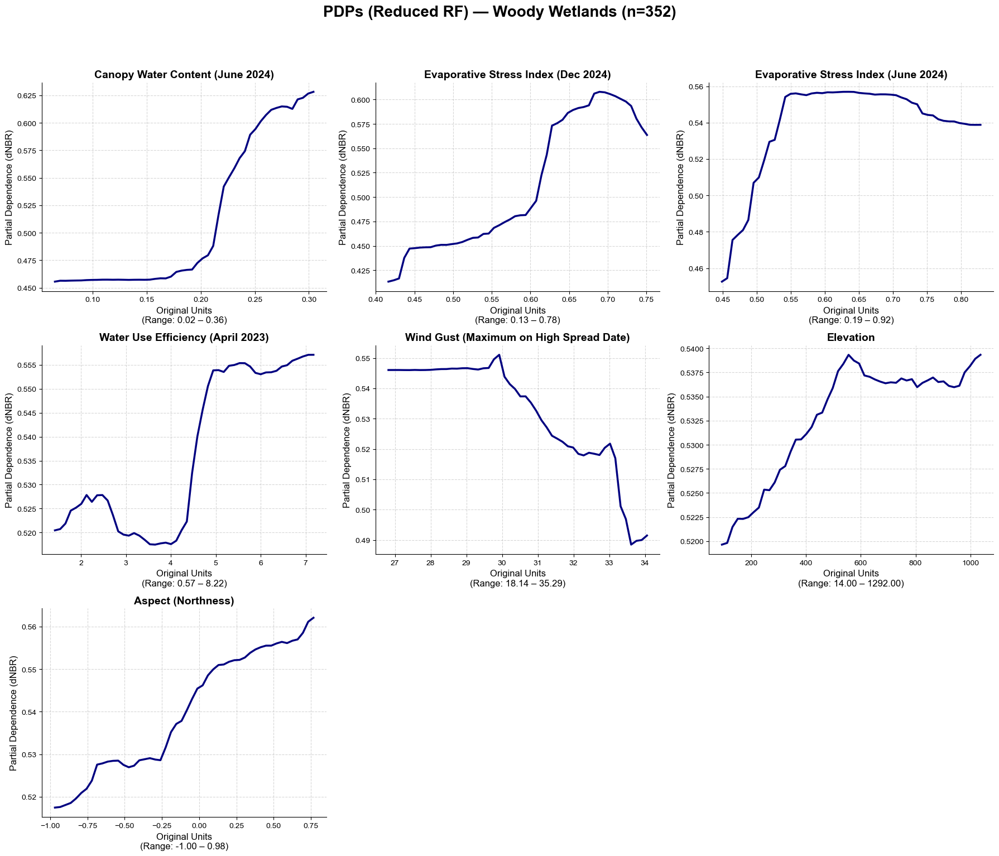

Skipping Emergent Herbaceous Wetlands (n=23) — too few samples


In [44]:
# -------------------------------------------
# Per-NLCD Class Partial Dependence Plots
# -------------------------------------------
"""
Generates Partial Dependence Plots (PDPs) for the tuned reduced Random Forest model,
separately for each NLCD land cover class with ≥100 pixels.
For each class:
  - Subset the data to reduced predictors for that NLCD class.
  - Compute PDPs in scaled space and convert them back to original units.
  - Plot PDP curves with observed value ranges for context.
Each class produces its own grid of PDP plots across the reduced predictors.
"""

# Minimum pixels per NLCD class to avoid noisy plots
min_samples = 100  

for lc_code, group in df_full_scaled.groupby("NLCD"):
    lc_name = nlcd_classes.get(lc_code, str(lc_code))
    n = len(group)
    if n < min_samples:
        print(f"Skipping {lc_name} (n={n}) — too few samples")
        continue

    print(f"\nPlotting Reduced PDPs for: {lc_name} (n={n})")

    # Use scaled predictors for this class, subset to reduced features
    X_group_red = group[selected_features_red]

    # Set up figure grid
    n_features = len(selected_features_red)
    n_cols = 3
    n_rows = int(np.ceil(n_features / n_cols))
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
    axs = axs.flatten()

    for i, feature in enumerate(selected_features_red):
        # ----------------------------
        # Compute PDP in scaled space
        # ----------------------------
        pd_result = partial_dependence(
            estimator=rf_reduced_tuned,
            X=X_group_red,
            features=[i],   # index in reduced feature list
            grid_resolution=50,
            kind="average"
        )

        grid_scaled = pd_result["grid_values"][0].reshape(-1, 1)

        # Dummy array for inverse transform
        dummy_input = np.zeros((len(grid_scaled), len(continuous_vars)))
        full_index = scaler_feature_index[feature]
        dummy_input[:, full_index] = grid_scaled.flatten()

        # Convert back to original units
        grid_unscaled = scaler.inverse_transform(dummy_input)[:, full_index]

        # Observed range for this NLCD class (original units)
        dummy_train = np.zeros((len(X_group_red), len(continuous_vars)))
        for j, feat in enumerate(selected_features_red):
            full_idx = scaler_feature_index[feat]
            dummy_train[:, full_idx] = X_group_red.iloc[:, j]
        train_vals = scaler.inverse_transform(dummy_train)[:, full_index]
        val_min, val_max = train_vals.min(), train_vals.max()

        # ----------------------------
        # Plot PDP
        # ----------------------------
        ax = axs[i]
        ax.plot(grid_unscaled, pd_result["average"][0],
                color="navy", linewidth=2.5)

        ax.set_title(feature_rename.get(feature, feature),
                     fontsize=14, fontweight="bold")
        ax.set_xlabel(f"Original Units\n(Range: {val_min:.2f} – {val_max:.2f})",
                      fontsize=12)
        ax.set_ylabel("Partial Dependence (dNBR)", fontsize=12)
        ax.tick_params(axis='both', labelsize=10)
        ax.grid(True, linestyle="--", alpha=0.5)

        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    # Remove unused panels
    for j in range(i + 1, len(axs)):
        fig.delaxes(axs[j])

    plt.suptitle(f"PDPs (Reduced RF) — {lc_name} (n={n})",
                 fontsize=20, fontweight="bold", y=1.02)
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()

In [46]:
# -------------------------------------------
# Create 'overall_pdp' from full model PDPs
# -------------------------------------------
overall_pdp = {}

for i, feature in enumerate(selected_features_red):
    pd_result = partial_dependence(
        estimator=rf_reduced_tuned,
        X=X_train_red,
        features=[i],
        grid_resolution=50,
        kind="average"
    )

    grid_scaled = pd_result["grid_values"][0].reshape(-1, 1)
    dummy_input = np.zeros((len(grid_scaled), len(continuous_vars)))
    full_index = scaler_feature_index[feature]
    dummy_input[:, full_index] = grid_scaled.flatten()
    grid_unscaled = scaler.inverse_transform(dummy_input)[:, full_index]

    overall_pdp[feature] = {
        "x": grid_unscaled,
        "y": pd_result["average"][0]
    }

print(f"Stored PDP curves for {len(overall_pdp)} features.")


Stored PDP curves for 7 features.


## Figure S3

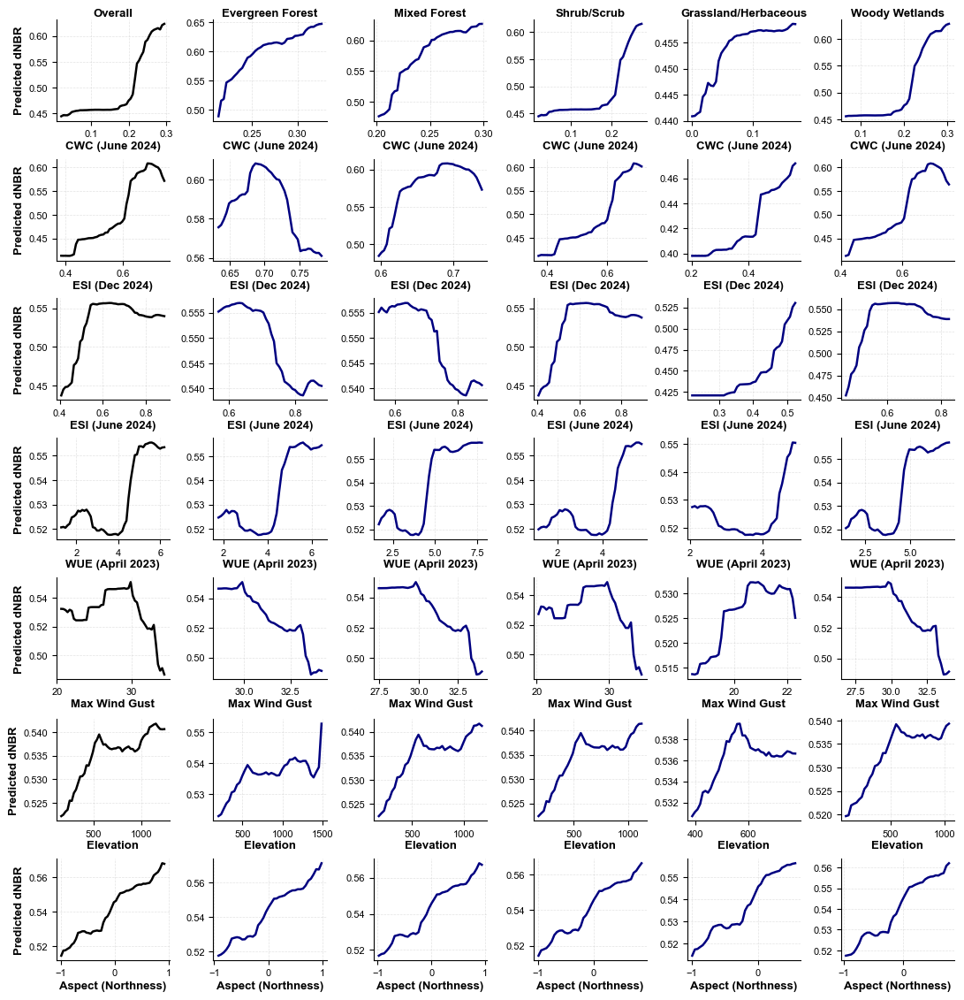

In [47]:
# -------------------------------------------
# Full PDP Grid (Overall + NLCD Classes) — X-axis = predictor, Y-axis = dNBR
# -------------------------------------------

# Mapping to rename for display
feature_rename = {
    "CWC_20240625": "CWC (June 2024)",
    "ESI_20241201_1049am": "ESI (Dec 2024)",
    "ESI_20240625_1038am": "ESI (June 2024)",
    "WUE_20230409_1028am": "WUE (April 2023)",
    "WindGust_max_20250108": "Max Wind Gust",
    "Elevation": "Elevation",
    "cosAspect": "Aspect (Northness)"
}

# Output directory
outdir = "/Users/megan/Desktop/figures-rfr-lafires"
os.makedirs(outdir, exist_ok=True)

# -----------------------------------------------------
# Prepare group list (Overall + valid NLCD groups)
# -----------------------------------------------------
min_samples = 100
valid_groups = [
    (lc_code, nlcd_classes.get(lc_code, str(lc_code)), len(group))
    for lc_code, group in df_full_scaled.groupby("NLCD")
    if len(group) >= min_samples
]

# Add “Overall” as first column
valid_groups_with_overall = [("Overall", "Overall", len(df_full_scaled))] + valid_groups
n_cols = len(valid_groups_with_overall)
n_rows = len(selected_features_red)

# -----------------------------------------------------
# Figure setup
# -----------------------------------------------------
fig, axs = plt.subplots(
    n_rows, n_cols,
    figsize=(1.8 * n_cols, 1.6 * n_rows),
    sharex=False, sharey=False,
    constrained_layout=True
)

plt.rcParams.update({
    "font.family": "Arial",
    "axes.titlesize": 9.5,
    "axes.labelsize": 9.5,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8
})

# -----------------------------------------------------
# Loop through columns (Overall + each NLCD class)
# -----------------------------------------------------
for col_idx, (lc_code, lc_name, n) in enumerate(valid_groups_with_overall):

    # --------------------------
    # 1. OVERALL PDP COLUMN
    # --------------------------
    if lc_code == "Overall":
        for row_idx, feature in enumerate(selected_features_red):
            ax = axs[row_idx, col_idx]
            pd_data = overall_pdp[feature]  # must be defined/loaded beforehand

            ax.plot(pd_data["x"], pd_data["y"], color="black", linewidth=1.8)

            # Titles and labels
            if row_idx == 0:
                ax.set_title("Overall", fontsize=9.5, fontweight="bold", pad=2)
            if col_idx == 0:
                ax.set_ylabel("Predicted dNBR", fontsize=9.5, fontweight="bold", labelpad=3)
            ax.set_xlabel(feature_rename.get(feature, feature), fontsize=9.5, fontweight="bold", labelpad=2)

            # Style
            ax.tick_params(axis="both", labelsize=8)
            ax.grid(True, linestyle="--", alpha=0.35, linewidth=0.5)
            ax.spines[['top', 'right']].set_visible(False)
        continue

    # --------------------------
    # 2. NLCD-SPECIFIC COLUMNS
    # --------------------------
    group = df_full_scaled[df_full_scaled["NLCD"] == lc_code]
    X_group_red = group[selected_features_red]

    for row_idx, feature in enumerate(selected_features_red):
        ax = axs[row_idx, col_idx]

        pd_result = partial_dependence(
            estimator=rf_reduced_tuned,
            X=X_group_red,
            features=[row_idx],
            grid_resolution=40,
            kind="average"
        )

        # Inverse-transform grid back to original units
        grid_scaled = pd_result["grid_values"][0].reshape(-1, 1)
        dummy_input = np.zeros((len(grid_scaled), len(continuous_vars)))
        full_index = scaler_feature_index[feature]
        dummy_input[:, full_index] = grid_scaled.flatten()
        grid_unscaled = scaler.inverse_transform(dummy_input)[:, full_index]

        # Plot per-class PDP (navy)
        ax.plot(grid_unscaled, pd_result["average"][0],
                color="navy", linewidth=1.8)

        # Titles and labels
        if row_idx == 0:
            ax.set_title(lc_name, fontsize=9.5, fontweight="bold", pad=2)
        if col_idx == 0:
            ax.set_ylabel("Predicted dNBR", fontsize=9.5, fontweight="bold", labelpad=3)
        ax.set_xlabel(feature_rename.get(feature, feature),
                      fontsize=9.5, fontweight="bold", labelpad=2)

        # Style
        ax.tick_params(axis="both", labelsize=8)
        ax.grid(True, linestyle="--", alpha=0.35, linewidth=0.5)
        ax.spines[['top', 'right']].set_visible(False)

# -----------------------------------------------------
# Save
# -----------------------------------------------------
plt.savefig(
    os.path.join(outdir, "FigureS3_PDPs_Overall_and_NLCD_axislabels.png"),
    dpi=400, bbox_inches="tight", facecolor="white"
)
plt.show()

# Maps of predicted burn severity 

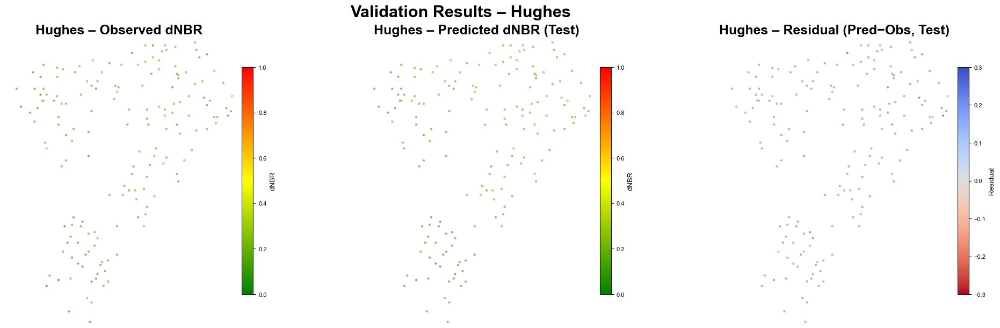

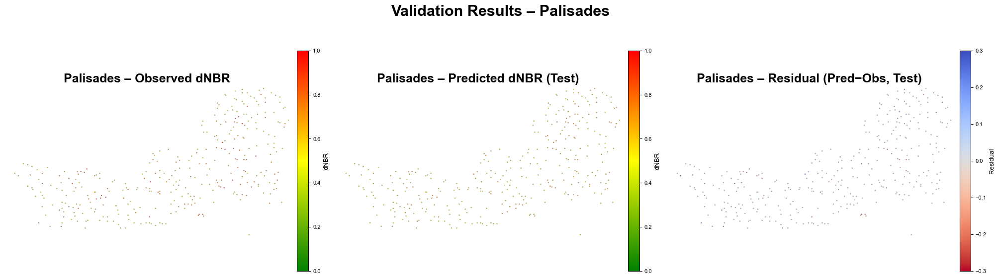

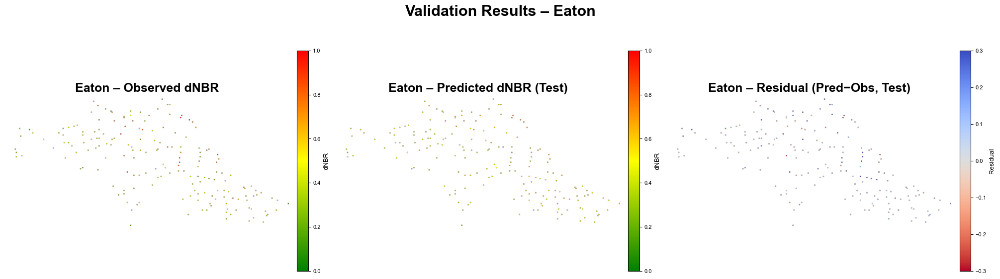

In [48]:
# ============================================================
# Updated reduced model predicted burn severity maps
# Predictions on TEST set only
# ============================================================
test_indices = X_test_red.index
df_test = df.loc[test_indices].copy()

df_test["Predicted_dNBR"] = rf_reduced_tuned.predict(X_test_red)
df_test["Residual"] = df_test["Predicted_dNBR"] - df_test["dNBR"]

# ------------------------------------------------------------
# Define Colormaps
# ------------------------------------------------------------
dNBR_cmap = mcolors.LinearSegmentedColormap.from_list("GreenRed", ["green", "yellow", "red"])
residual_cmap = "coolwarm_r"

# ------------------------------------------------------------
# Plot per fire
# ------------------------------------------------------------
for fire in df_test["Fire"].unique():
    fire_df = df_test[df_test["Fire"] == fire]
    rows = fire_df["Row"].max() + 1
    cols = fire_df["Col"].max() + 1
    
    observed_raster  = np.full((rows, cols), np.nan)
    predicted_raster = np.full((rows, cols), np.nan)
    residual_raster  = np.full((rows, cols), np.nan)
    
    r, c = fire_df["Row"].values, fire_df["Col"].values
    observed_raster[r, c]  = fire_df["dNBR"].values
    predicted_raster[r, c] = fire_df["Predicted_dNBR"].values
    residual_raster[r, c]  = fire_df["Residual"].values
    
    fig, axs = plt.subplots(1, 3, figsize=(20, 6), constrained_layout=True)
    im1 = axs[0].imshow(observed_raster, cmap=dNBR_cmap, vmin=0, vmax=1)
    im2 = axs[1].imshow(predicted_raster, cmap=dNBR_cmap, vmin=0, vmax=1)
    im3 = axs[2].imshow(residual_raster, cmap=residual_cmap, vmin=-0.3, vmax=0.3)

    axs[0].set_title(f"{fire} – Observed dNBR", fontsize=18, fontweight="bold")
    axs[1].set_title(f"{fire} – Predicted dNBR (Test)", fontsize=18, fontweight="bold")
    axs[2].set_title(f"{fire} – Residual (Pred−Obs, Test)", fontsize=18, fontweight="bold")

    for ax in axs: ax.axis("off")

    plt.colorbar(im1, ax=axs[0], shrink=0.8, pad=0.03, label="dNBR")
    plt.colorbar(im2, ax=axs[1], shrink=0.8, pad=0.03, label="dNBR")
    plt.colorbar(im3, ax=axs[2], shrink=0.8, pad=0.03, label="Residual")

    plt.suptitle(f"Validation Results – {fire}", fontsize=22, fontweight="bold")
    plt.show()


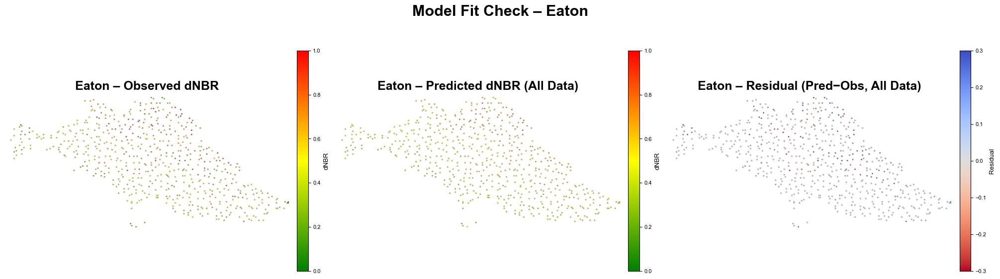

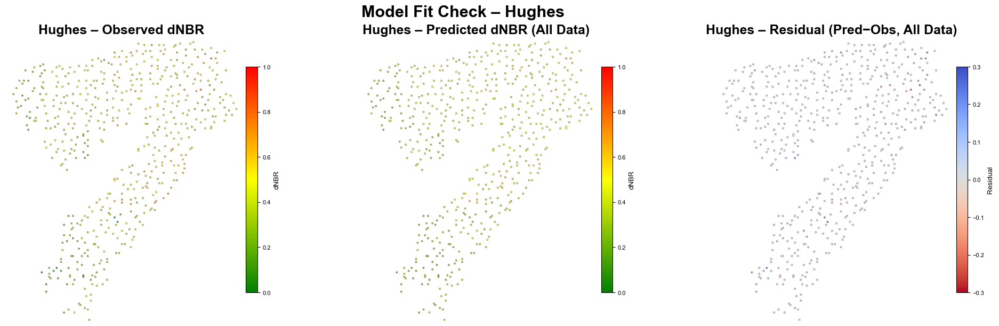

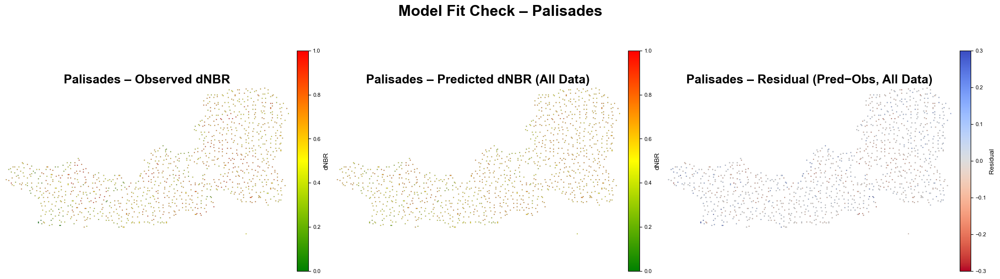

In [49]:
# ----------------------------
# Predictions on ALL available data (train + test)
# ----------------------------
df_all = df.copy()
df_all["Predicted_dNBR"] = rf_reduced_tuned.predict(X_reduced)
df_all["Residual"] = df_all["Predicted_dNBR"] - df_all["dNBR"]

for fire in df_all["Fire"].unique():
    fire_df = df_all[df_all["Fire"] == fire]
    rows = fire_df["Row"].max() + 1
    cols = fire_df["Col"].max() + 1
    
    observed_raster  = np.full((rows, cols), np.nan)
    predicted_raster = np.full((rows, cols), np.nan)
    residual_raster  = np.full((rows, cols), np.nan)
    
    r, c = fire_df["Row"].values, fire_df["Col"].values
    observed_raster[r, c]  = fire_df["dNBR"].values
    predicted_raster[r, c] = fire_df["Predicted_dNBR"].values
    residual_raster[r, c]  = fire_df["Residual"].values
    
    fig, axs = plt.subplots(1, 3, figsize=(20, 6), constrained_layout=True)
    im1 = axs[0].imshow(observed_raster, cmap=dNBR_cmap, vmin=0, vmax=1)
    im2 = axs[1].imshow(predicted_raster, cmap=dNBR_cmap, vmin=0, vmax=1)
    im3 = axs[2].imshow(residual_raster, cmap=residual_cmap, vmin=-0.3, vmax=0.3)

    axs[0].set_title(f"{fire} – Observed dNBR", fontsize=18, fontweight="bold")
    axs[1].set_title(f"{fire} – Predicted dNBR (All Data)", fontsize=18, fontweight="bold")
    axs[2].set_title(f"{fire} – Residual (Pred−Obs, All Data)", fontsize=18, fontweight="bold")

    for ax in axs: ax.axis("off")

    plt.colorbar(im1, ax=axs[0], shrink=0.8, pad=0.03, label="dNBR")
    plt.colorbar(im2, ax=axs[1], shrink=0.8, pad=0.03, label="dNBR")
    plt.colorbar(im3, ax=axs[2], shrink=0.8, pad=0.03, label="Residual")

    plt.suptitle(f"Model Fit Check – {fire}", fontsize=22, fontweight="bold")
    plt.show()

## Figure 4

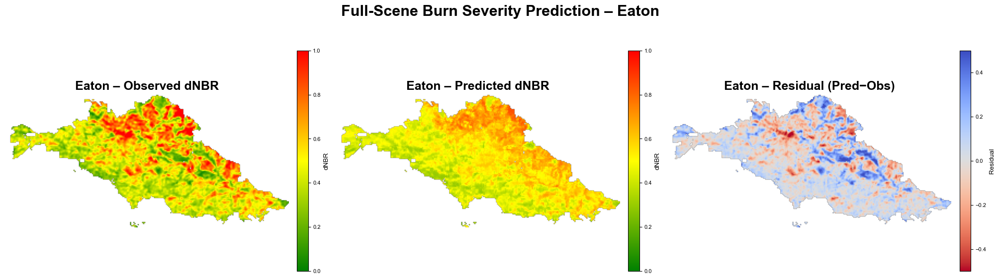

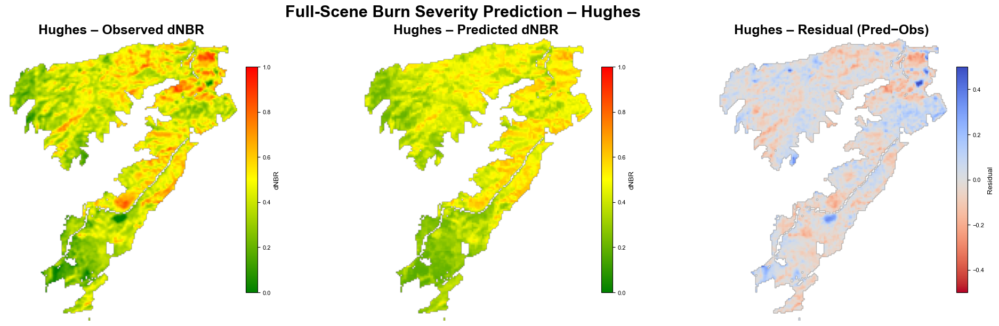

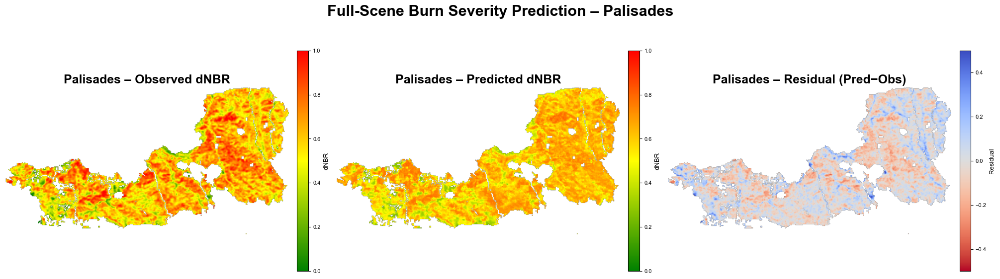

In [50]:
# ----------------------------
# Predictions on FULL-SCENE dataset
# ----------------------------
df_full_scaled = pd.read_parquet(
    "/Volumes/GEOG/EMIT_ECOSTRESS_wildfires/updated_allfiresmodel/manuscript_ready/kitchen_sink_model_20251023.parquet"
)

X_full_red = df_full_scaled[reduced_vars_final]
df_full_scaled["Predicted_dNBR"] = rf_reduced_tuned.predict(X_full_red)
df_full_scaled["Residual"] = df_full_scaled["Predicted_dNBR"] - df_full_scaled["dNBR"]

for fire in df_full_scaled["Fire"].unique():
    fire_df = df_full_scaled[df_full_scaled["Fire"] == fire]
    rows = fire_df["Row"].max() + 1
    cols = fire_df["Col"].max() + 1
    
    observed_raster  = np.full((rows, cols), np.nan)
    predicted_raster = np.full((rows, cols), np.nan)
    residual_raster  = np.full((rows, cols), np.nan)
    
    r, c = fire_df["Row"].values, fire_df["Col"].values
    observed_raster[r, c]  = fire_df["dNBR"].values
    predicted_raster[r, c] = fire_df["Predicted_dNBR"].values
    residual_raster[r, c]  = fire_df["Residual"].values
    
    fig, axs = plt.subplots(1, 3, figsize=(20, 6), constrained_layout=True)
    im1 = axs[0].imshow(observed_raster, cmap=dNBR_cmap, vmin=0, vmax=1)
    im2 = axs[1].imshow(predicted_raster, cmap=dNBR_cmap, vmin=0, vmax=1)
    im3 = axs[2].imshow(residual_raster, cmap=residual_cmap, vmin=-0.5, vmax=0.5)

    axs[0].set_title(f"{fire} – Observed dNBR", fontsize=18, fontweight="bold")
    axs[1].set_title(f"{fire} – Predicted dNBR", fontsize=18, fontweight="bold")
    axs[2].set_title(f"{fire} – Residual (Pred−Obs)", fontsize=18, fontweight="bold")

    for ax in axs: ax.axis("off")

    plt.colorbar(im1, ax=axs[0], shrink=0.8, pad=0.03, label="dNBR")
    plt.colorbar(im2, ax=axs[1], shrink=0.8, pad=0.03, label="dNBR")
    plt.colorbar(im3, ax=axs[2], shrink=0.8, pad=0.03, label="Residual")

    plt.suptitle(f"Full-Scene Burn Severity Prediction – {fire}", fontsize=22, fontweight="bold")
    plt.show()